# Author: Raquel Ana M Bush
# MTH 565 - Spotify Feature Network

initial imports, data, and integral functions:

In [639]:
import pandas as pd
import networkx as nx
import numpy as np
from matplotlib import pyplot as plt
from math import ceil
import ast
from ast import literal_eval
import community.community_louvain as community_louvain
from collections import defaultdict, Counter
import random
from itertools import combinations
from scipy.optimize import curve_fit
from sklearn.metrics import r2_score

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes_df = pd.read_csv(nodes_path)
edges_df = pd.read_csv(edges_path)

# print first 5 rows of each csv file:
print("Nodes:")
print(nodes_df.head())

print("\nEdges:")
print(edges_df.head())

# to calculate diameter:
def calculate_diameter(G):
    if nx.is_connected(G):
        return nx.diameter(G)
    else:
        # infinite diameter if graph is disconnected:
        return float('inf')

# to generate random graphs:
def generate_graphs(n, p, num_samples):
    graphs = []
    for _ in range(num_samples):
        G_random = nx.gnp_random_graph(n, p)
        graphs.append(G_random)
    return graphs

# to visualize a specific subgraph:
def visualize_genre_subgraph(subgraph, about):
    # use seed for consistency:
    pos = nx.spring_layout(subgraph, seed=42)
    plt.figure(figsize=(10, 10))
    nx.draw_networkx_nodes(subgraph, pos, node_size=20, node_color="skyblue", alpha=0.8)
    nx.draw_networkx_edges(subgraph, pos, edge_color="lightgray", alpha=0.5)
    plt.title(f"Visualization of {about} subgraph")
    plt.axis("off")
    plt.show()

Nodes:
               spotify_id                name  followers  popularity  \
0  48WvrUGoijadXXCsGocwM4           Byklubben     1738.0          24   
1  4lDiJcOJ2GLCK6p9q5BgfK            Kontra K  1999676.0          72   
2  652XIvIBNGg3C0KIGEJWit               Maxim    34596.0          36   
3  3dXC1YPbnQPsfHPVkm1ipj  Christopher Martin   249233.0          52   
4  74terC9ol9zMo8rfzhSOiG       Jakob Hellman    21193.0          39   

                                              genres  \
0                     ['nordic house', 'russelater']   
1             ['christlicher rap', 'german hip hop']   
2                                                 []   
3  ['dancehall', 'lovers rock', 'modern reggae', ...   
4  ['classic swedish pop', 'norrbotten indie', 's...   

                                          chart_hits  
0                                         ['no (3)']  
1  ['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ...  
2                                         ['de (1)']  
3  

I will first do some analysis on the entire graph, although it has the bias of not including connections between non-seed artists:

In [640]:
# create the graph:
G = nx.Graph()

# add nodes:
for _, row in nodes_df.iterrows():
    G.add_node(row['spotify_id'])

# add edges:
for _, row in edges_df.iterrows():
    G.add_edge(row['id_0'], row['id_1'])

# count nodes and edges:
node_count = G.number_of_nodes()
print("Node count:", node_count)

edge_count = G.number_of_edges()
print("Edge count:", edge_count)

Node count: 156326
Edge count: 300386


In [641]:
# parse genres strings to objects or set as empty list if not a string:
nodes_df['genres'] = nodes_df['genres'].apply(lambda x: literal_eval(x) if isinstance(x, str) else [])

# add genres list to each node:
for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['genres'] = row['genres']

# add artist names to each node:
for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['name'] = row['name']

# add popularity scores to each node:
for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['popularity'] = row['popularity']

# add chart hits to each node:
for _, row in nodes_df.iterrows():
    node_id = row['spotify_id']
    G.nodes[node_id]['chart_hits'] = row['chart_hits']

# verify node data:
print("Sample node data:")
list(G.nodes(data=True))[:5]

Sample node data:


[('48WvrUGoijadXXCsGocwM4',
  {'genres': ['nordic house', 'russelater'],
   'name': 'Byklubben',
   'popularity': 24,
   'chart_hits': "['no (3)']"}),
 ('4lDiJcOJ2GLCK6p9q5BgfK',
  {'genres': ['christlicher rap', 'german hip hop'],
   'name': 'Kontra K',
   'popularity': 72,
   'chart_hits': "['at (44)', 'de (111)', 'lu (22)', 'ch (31)', 'vn (1)']"}),
 ('652XIvIBNGg3C0KIGEJWit',
  {'genres': [],
   'name': 'Maxim',
   'popularity': 36,
   'chart_hits': "['de (1)']"}),
 ('3dXC1YPbnQPsfHPVkm1ipj',
  {'genres': ['dancehall', 'lovers rock', 'modern reggae', 'reggae fusion'],
   'name': 'Christopher Martin',
   'popularity': 52,
   'chart_hits': "['at (1)', 'de (1)']"}),
 ('74terC9ol9zMo8rfzhSOiG',
  {'genres': ['classic swedish pop', 'norrbotten indie', 'swedish pop'],
   'name': 'Jakob Hellman',
   'popularity': 39,
   'chart_hits': "['se (6)']"})]

In [644]:
# calculate diameter:
spotify_diameter = calculate_diameter(G)
print("Spotify network diameter:", spotify_diameter)

# find all connected components in graph:
components = [G.subgraph(c).copy() for c in nx.connected_components(G)]
print(f"There are {len(components)} connected components.")

# largest connected component size:
largest_cc = sorted(nx.connected_components(G), reverse=True)[0]
print(f"The largest connected component contains {len(largest_cc)} artists.")

Spotify network diameter: inf
There are 4338 connected components.
The largest connected component contains 148386 artists.


So, we can see that there are a lot of disjointed components, but the largest one contains the vast majority of the artists.

Let's check the vertex degree distribution (number of feature collaborations per artist):

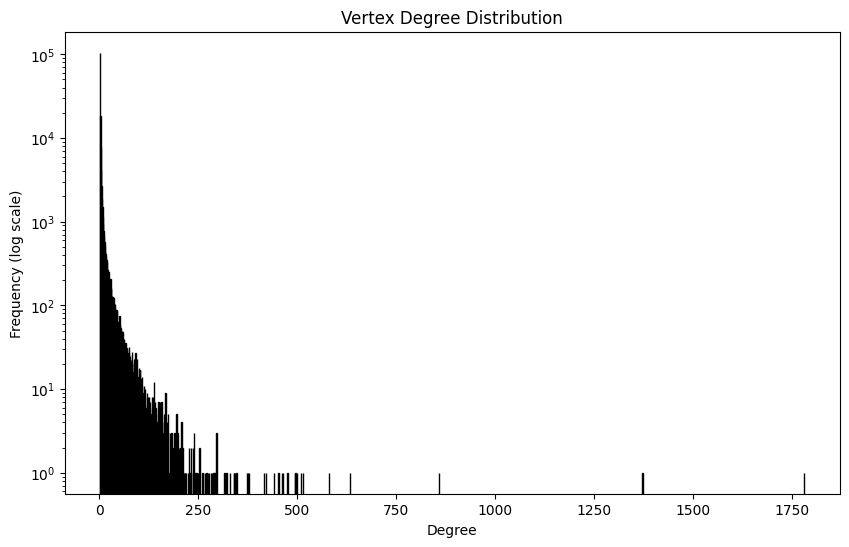

In [645]:
# graph vertex degree dist:
degrees = [degree for node, degree in G.degree()]
plt.figure(figsize=(10, 6))
plt.hist(degrees, bins=range(1, max(degrees) + 1), edgecolor='black')
plt.yscale('log')
plt.xlabel("Degree")
plt.ylabel("Frequency (log scale)")
plt.title("Vertex Degree Distribution")
plt.show()

From the above, we can see that there are many artists with very few connections, and a few that are "hubs," with many connections.
This suggests we should investigate for power law.
The following is that investigation:

In [646]:
# funcs for power law analysis:

# define linear model for log-log data:
def linear_model(log_x, a, b):
    return a + b * log_x

# plot & fit log-log data:
def plot_and_fit_log_log(graph):
    degrees = [deg for _, deg in graph.degree()]
    degree_count = Counter(degrees)
    x = np.array(list(degree_count.keys()))
    y = np.array(list(degree_count.values()))

    # remove zeros & ensure consistent filtering:
    positive_indices = (x > 0) & (y > 0)
    x, y = x[positive_indices], y[positive_indices]
    
    # log-transform data:
    log_x = np.log(x)
    log_y = np.log(y)
    
    # scatter plot of log-log data:
    plt.scatter(log_x, log_y, label="Log-Log Data", alpha=0.7)
    plt.title("Log-Log Degree Distribution")
    plt.xlabel("Log(Degree)")
    plt.ylabel("Log(Count)")
    plt.grid(True)
    plt.legend()
    plt.show()

    # fit straight line to log-log data:
    params, _ = curve_fit(linear_model, log_x, log_y)
    intercept, slope = params

    power_law_text = f"$P(k) \sim k^{{{slope:.4f}}}$"
    plt.text(log_x.min() + 3, log_y.max() - 2, power_law_text, fontsize=12, color="black")

    r2_text = f"$R^2$ = {compute_r2(graph):.4f}"
    plt.text(log_x.min() + 1, log_y.max() - 7, r2_text, fontsize=12, color="black")

    # plot data w/ fitted line:
    plt.scatter(log_x, log_y, label="Log-Log Data", alpha=0.7)
    plt.plot(log_x, linear_model(log_x, *params), color="red", label=f"Fit: slope = {slope:.4f}")
    plt.title("Log-Log Degree Distribution with Fitted Line")
    plt.xlabel("Log(Degree)")
    plt.ylabel("Log(Count)")
    plt.legend()
    plt.grid(True)
    plt.show()

    return slope

# computes R^2 for the fit:
def compute_r2(graph):
    degrees = [deg for _, deg in graph.degree()]
    degree_count = Counter(degrees)
    x = np.array(list(degree_count.keys()))
    y = np.array(list(degree_count.values()))
    
    # remove zeros:
    positive_indices = (x > 0) & (y > 0)
    x, y = x[positive_indices], y[positive_indices]
    
    log_x = np.log(x)
    log_y = np.log(y)
    
    # fit straight line:
    params, _ = curve_fit(linear_model, log_x, log_y)
    predicted_log_y = linear_model(log_x, *params)
    
    # calculate R^2:
    r2 = r2_score(log_y, predicted_log_y)
    print(f"R^2: {r2:.4f}")
    return r2

<>:35: SyntaxWarning: invalid escape sequence '\s'
<>:35: SyntaxWarning: invalid escape sequence '\s'
/var/folders/hn/fv9qnhpj3kndp1821xh_dmkr0000gn/T/ipykernel_48027/3156686533.py:35: SyntaxWarning: invalid escape sequence '\s'
  power_law_text = f"$P(k) \sim k^{{{slope:.4f}}}$"


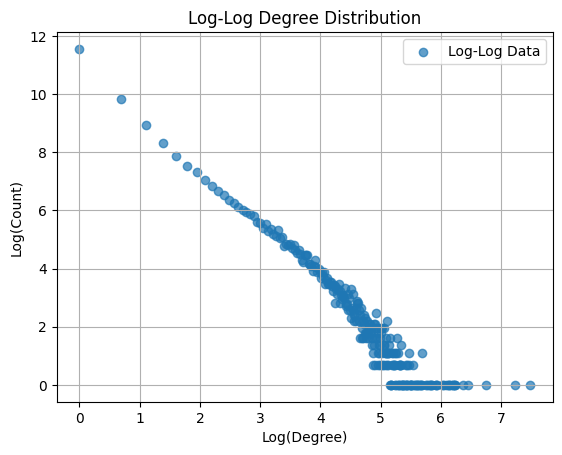

R^2: 0.9331


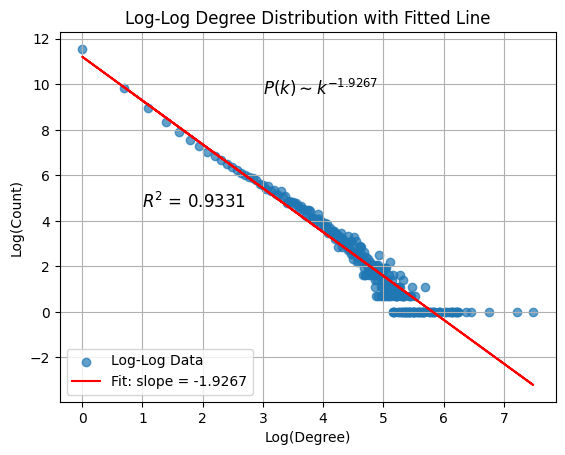

R^2: 0.9331
Slope of the log-log fit: -1.9267
R^2 value: 0.9331


In [647]:
# power law analysis:

slope = plot_and_fit_log_log(G)
r2_value = compute_r2(G)

print(f"Slope of the log-log fit: {slope:.4f}")
print(f"R^2 value: {r2_value:.4f}")

From the above plot, we can see that the largest connected component of the entire graph follows a power law strongly (R^2 = 0.93), with slope -1.93.

However, due to the biases inherent in this dataset, we will focus our analysis mostly on the top and seed artists.

Let's take a moment to look at the artists with over 200 collaborative connections in this network:

In [648]:
degree_threshold = 200

# find nodes with degree above the threshold:
outlier_nodes = [node for node, degree in G.degree() if degree > degree_threshold]
print(f"Number of artists with over 200 collaborations on Spotify: {len(outlier_nodes)}\n")


# print outlier nodes & their degrees:
for node in outlier_nodes:
    artist_name = G.nodes[node].get('name', 'Unknown')
    print(f"Artist: {artist_name}, Degree: {G.degree(node)}")


Number of artists with over 200 collaborations on Spotify: 83

Artist: Shaggy, Degree: 226
Artist: Ennio Morricone, Degree: 276
Artist: MOTi, Degree: 246
Artist: NERVO, Degree: 293
Artist: Tritonal, Degree: 243
Artist: Flo Rida, Degree: 244
Artist: Armin van Buuren, Degree: 513
Artist: Wyclef Jean, Degree: 260
Artist: DJ Gollum, Degree: 215
Artist: Dillon Francis, Degree: 216
Artist: Alkpote, Degree: 242
Artist: Busta Rhymes, Degree: 205
Artist: Eko Fresh, Degree: 231
Artist: Ty Dolla $ign, Degree: 252
Artist: John Williams, Degree: 415
Artist: Brray, Degree: 213
Artist: Kaskade, Degree: 281
Artist: Moby, Degree: 340
Artist: Yuvan Shankar Raja, Degree: 315
Artist: J Alvarez, Degree: 204
Artist: Mc Gw, Degree: 858
Artist: Dimitri Vegas & Like Mike, Degree: 226
Artist: Afrojack, Degree: 252
Artist: Sean Paul, Degree: 236
Artist: Rudimental, Degree: 202
Artist: Quimico Ultra Mega, Degree: 295
Artist: INNA, Degree: 288
Artist: Farruko, Degree: 284
Artist: Diplo, Degree: 494
Artist: Gucci M

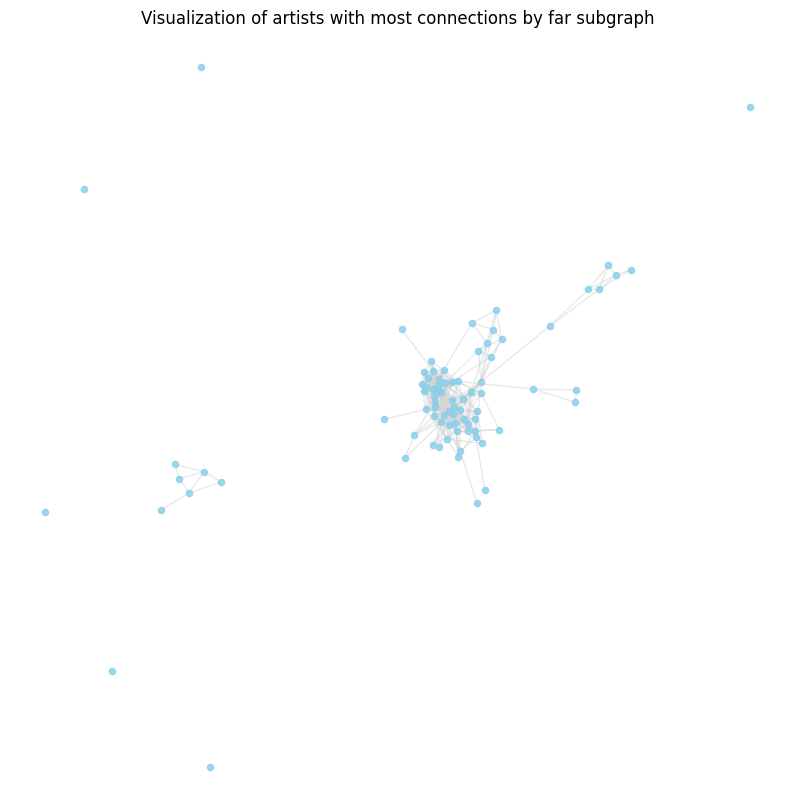

In [650]:
# visualize the subgraph with just artists who have over 200 collaborations:
high_degree_subgraph = G.subgraph(outlier_nodes).copy()
visualize_genre_subgraph(high_degree_subgraph, 'artists with most connections by far')

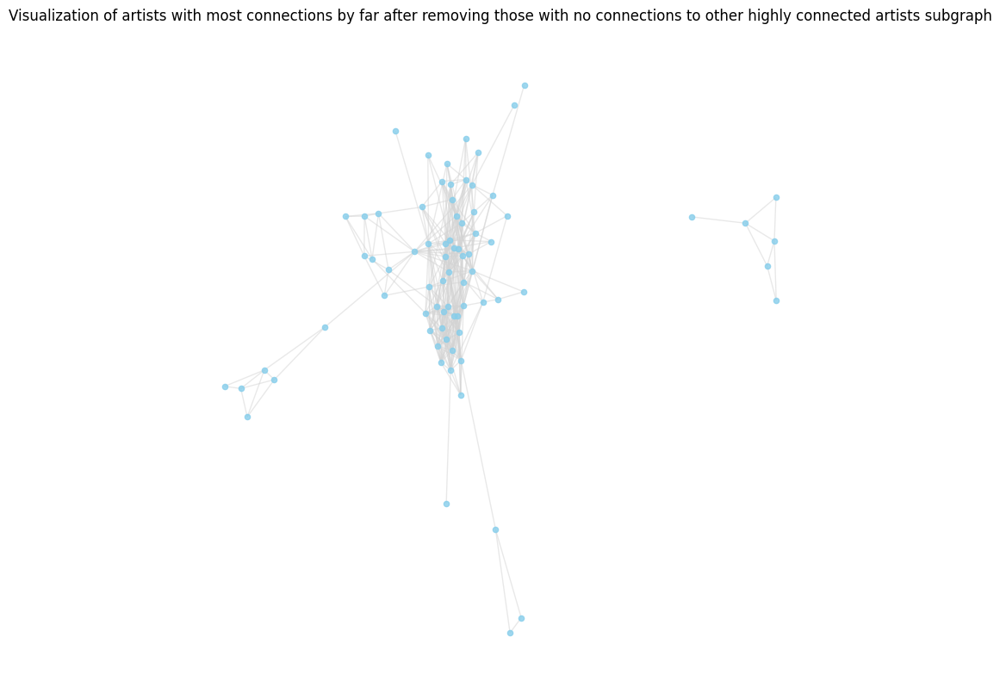

In [651]:
# cutting out those w/ 0 connections with other highly connected artists:
isolated_nodes = list(nx.isolates(high_degree_subgraph))
high_degree_subgraph.remove_nodes_from(isolated_nodes)
visualize_genre_subgraph(high_degree_subgraph, 'artists with most connections by far after removing those with no connections to other highly connected artists')

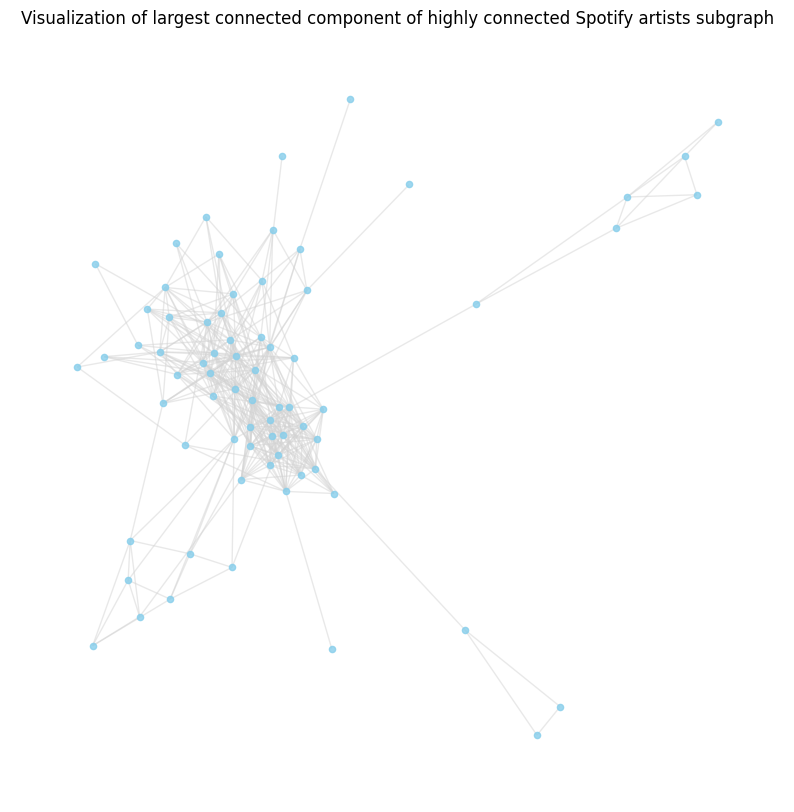

In [652]:
# look at the largest connected component of these highly connected artists:
largest_cc = max(nx.connected_components(high_degree_subgraph), key=len)
largest_cc = high_degree_subgraph.subgraph(largest_cc).copy()
visualize_genre_subgraph(largest_cc, 'largest connected component of highly connected Spotify artists')

In [653]:
# find top 15 artists by degree in the largest connected component:
top_15_artists = sorted(largest_cc.degree, key=lambda x: x[1], reverse=True)[:15]
print(f"\n15 most connected artist(s) in the highly connected artists subgraph by number of connections:")
for artist, degree in top_15_artists:
    artist_name = G.nodes[artist].get('name', 'Unknown')
    print(f"Artist: {artist_name}, Connections: {degree}")


15 most connected artist(s) in the highly connected artists subgraph by number of connections:
Artist: Steve Aoki, Connections: 23
Artist: Ty Dolla $ign, Connections: 22
Artist: French Montana, Connections: 22
Artist: Gucci Mane, Connections: 22
Artist: Tiësto, Connections: 21
Artist: Chris Brown, Connections: 21
Artist: Afrojack, Connections: 20
Artist: Lil Wayne, Connections: 20
Artist: David Guetta, Connections: 20
Artist: Snoop Dogg, Connections: 20
Artist: R3HAB, Connections: 19
Artist: 2 Chainz, Connections: 19
Artist: The Game, Connections: 18
Artist: Rick Ross, Connections: 17
Artist: Wale, Connections: 17


We saw that the giant component contains the vast majority of the artists. Let's look at the next few too:

In [654]:
# find connected components & their sizes:
components = sorted([[G.subgraph(c).copy(), len(c)] for c in nx.connected_components(G)], key=lambda x: x[1], reverse=True)

# print sizes of each component:
for component in components[0:10]:
    print(component[1])

# get giant component:
largest_component = components[0][0]

148386
66
37
22
21
21
21
20
19
16


Let's look at some of the properties of this giant component: (we're still looking at both seed and non-seed artists here)

In [655]:
# approximate diameter calculation using subset of nodes (average of 10 approximations):
largest_c_diameters = []
for i in range(10):
    largest_c_diameter = nx.approximation.diameter(largest_component)
    largest_c_diameters.append(largest_c_diameter)
print(f"Diamter approximations: {largest_c_diameters}")
largest_c_avg_diameter = sum(largest_c_diameters) / len(largest_c_diameters)
print(f"Average diameter: {largest_c_avg_diameter}")

# calculate global clustering coefficient:
largest_c_clustering = nx.average_clustering(largest_component)

# calculate density:
largest_c_density = nx.density(G)

print(f"\nLargest component size: {len(largest_component)}")
print(f"Diameter of this component: {largest_c_diameter}")
print(f"Global clustering coefficient of this component: {largest_c_clustering}")
print(f"Density of this component: {largest_c_density}")

Diamter approximations: [24, 24, 24, 24, 24, 24, 24, 24, 24, 24]
Average diameter: 24.0

Largest component size: 148386
Diameter of this component: 24
Global clustering coefficient of this component: 0.08504040224253798
Density of this component: 2.458385754043054e-05


In [662]:
# find random graph stats:
n = len(largest_component)
p = largest_c_density

***Generating random graphs to see global clustering and find expected diameter:*** (fair warning this cell takes ~30 min)

In [444]:
# generate & draw 3 samples:
random_graphs = generate_graphs(n, p, 3)

# analyze each:
for random_G in random_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc).copy()

    # approximate diameter calculation using largest connected component:
    randomG_diameter = nx.approximation.diameter(random_G)
    print(f"Approximate diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Global clustering: {randomG_clustering}")

    print('')

Approximate diameter: 22
Global clustering: 1.288034621136571e-05

Approximate diameter: 21
Global clustering: 2.8203026537285282e-05

Approximate diameter: 19
Global clustering: 2.2078486422646412e-05



***Generating regular lattices to see diameter and find expected global clustering:***

In [659]:
# decide k:
k = (2 * edge_count) / len(largest_component)
print(k)
k = int(k)
print(f"k = {k}")

4.048710794818918
k = 4


In [660]:
# generate regular lattice:
reg_lat = nx.watts_strogatz_graph(n, k, 0)

# diameter calculation:
reg_lat_diameter = ceil(n / k)
print(f"Regular lattice diameter: {reg_lat_diameter}")
        
# calculate global clustering coefficient:
reg_lat_clustering = nx.average_clustering(reg_lat)
print(f"Global clustering: {reg_lat_clustering}")

Regular lattice diameter: 37097
Global clustering: 0.5


***Analyzing subgraphs for specific genres:***

In [665]:
# count genre occurrences:
genre_counts = nodes_df['genres'].explode().value_counts()

# display the most common genres to help decide which ones to pick (top 15)
genre_counts.head(15)

genres
pop               544
electro house     513
dance pop         506
edm               453
rap               448
german hip hop    434
uk pop            406
pop rap           395
french hip hop    384
hip hop           381
pop dance         379
pop edm           368
tropical house    356
filmi             353
funk carioca      351
Name: count, dtype: int64

In [666]:
# verify that genres are parsed correctly:
print(nodes_df[['spotify_id', 'genres']].head())

               spotify_id                                             genres
0  48WvrUGoijadXXCsGocwM4                         [nordic house, russelater]
1  4lDiJcOJ2GLCK6p9q5BgfK                 [christlicher rap, german hip hop]
2  652XIvIBNGg3C0KIGEJWit                                                 []
3  3dXC1YPbnQPsfHPVkm1ipj  [dancehall, lovers rock, modern reggae, reggae...
4  74terC9ol9zMo8rfzhSOiG  [classic swedish pop, norrbotten indie, swedis...


german hip hop - Total nodes: 434, Isolated nodes: 20, Isolated percentage: 4.61%

20 most connected artist(s) in german hip hop by number of connections:
Artist: Capital Bra, Connections: 55
Artist: Olexesh, Connections: 55
Artist: Manuellsen, Connections: 53
Artist: Haftbefehl, Connections: 49
Artist: Nimo, Connections: 47
Artist: Celo & Abdi, Connections: 45
Artist: Farid Bang, Connections: 44
Artist: Summer Cem, Connections: 42
Artist: Sido, Connections: 42
Artist: RAF Camora, Connections: 41
Artist: KC Rebell, Connections: 39
Artist: Kool Savas, Connections: 38
Artist: XATAR, Connections: 37
Artist: Azzi Memo, Connections: 36
Artist: GRiNGO, Connections: 35
Artist: Massiv, Connections: 34
Artist: Bausa, Connections: 34
Artist: Bonez MC, Connections: 34
Artist: Azad, Connections: 34
Artist: Ufo361, Connections: 33

Diameter for german hip hop: 9
Global clustering for german hip hop: 0.2591539253881741
Density for german hip hop: 0.022935178007036795

Comparable random graph diamete

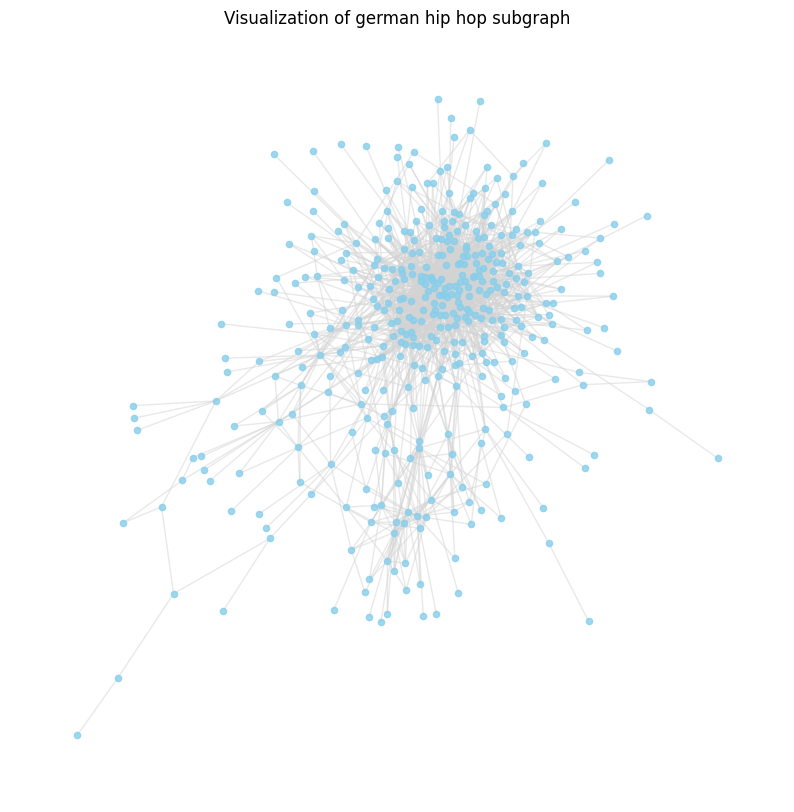

dance pop - Total nodes: 505, Isolated nodes: 61, Isolated percentage: 12.08%

20 most connected artist(s) in dance pop by number of connections:
Artist: R3HAB, Connections: 90
Artist: David Guetta, Connections: 87
Artist: Tiësto, Connections: 63
Artist: Pitbull, Connections: 58
Artist: Ty Dolla $ign, Connections: 56
Artist: Steve Aoki, Connections: 53
Artist: Nicki Minaj, Connections: 49
Artist: Chris Brown, Connections: 47
Artist: Sean Paul, Connections: 46
Artist: Afrojack, Connections: 46
Artist: MOTi, Connections: 45
Artist: Clean Bandit, Connections: 43
Artist: Major Lazer, Connections: 42
Artist: Ludacris, Connections: 41
Artist: Cheat Codes, Connections: 41
Artist: Dimitri Vegas & Like Mike, Connections: 40
Artist: Flo Rida, Connections: 40
Artist: Don Diablo, Connections: 39
Artist: Benny Benassi, Connections: 37
Artist: Missy Elliott, Connections: 37

Diameter for dance pop: 8
Global clustering for dance pop: 0.18297026753481982
Density for dance pop: 0.026496168979084696

Co

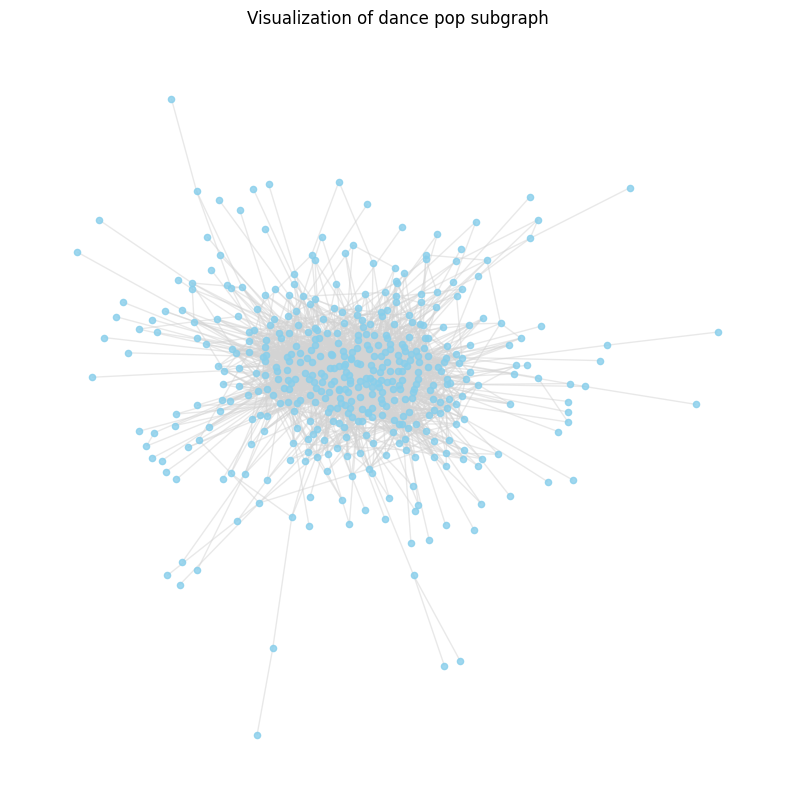

pop - Total nodes: 544, Isolated nodes: 79, Isolated percentage: 14.52%

20 most connected artist(s) in pop by number of connections:
Artist: R3HAB, Connections: 90
Artist: Ty Dolla $ign, Connections: 66
Artist: David Guetta, Connections: 62
Artist: Tiësto, Connections: 57
Artist: Nicki Minaj, Connections: 51
Artist: Khalid, Connections: 41
Artist: Calvin Harris, Connections: 41
Artist: Chris Brown, Connections: 41
Artist: Justin Bieber, Connections: 40
Artist: Cheat Codes, Connections: 39
Artist: Major Lazer, Connections: 38
Artist: Diplo, Connections: 37
Artist: Charli XCX, Connections: 37
Artist: G-Eazy, Connections: 35
Artist: Joel Corry, Connections: 35
Artist: Clean Bandit, Connections: 34
Artist: Kygo, Connections: 34
Artist: Sam Feldt, Connections: 34
Artist: Ed Sheeran, Connections: 33
Artist: DJ Khaled, Connections: 33

Diameter for pop: 7
Global clustering for pop: 0.15543253625460068
Density for pop: 0.02136358401474145

Comparable random graph diameter: 5
Comparable random

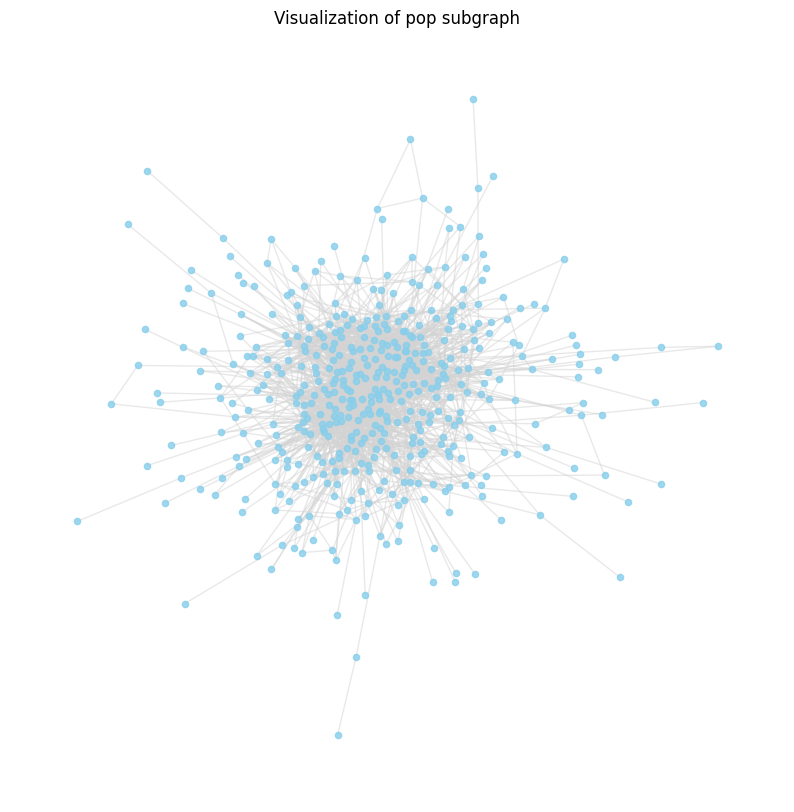

uk pop - Total nodes: 406, Isolated nodes: 171, Isolated percentage: 42.12%

20 most connected artist(s) in uk pop by number of connections:
Artist: Jonas Blue, Connections: 31
Artist: Sam Feldt, Connections: 30
Artist: Cheat Codes, Connections: 27
Artist: Rudimental, Connections: 25
Artist: Martin Jensen, Connections: 23
Artist: Clean Bandit, Connections: 20
Artist: Sigala, Connections: 19
Artist: M-22, Connections: 19
Artist: Matoma, Connections: 18
Artist: NOTD, Connections: 18
Artist: Ed Sheeran, Connections: 17
Artist: MK, Connections: 17
Artist: Demi Lovato, Connections: 16
Artist: Anne-Marie, Connections: 16
Artist: Jax Jones, Connections: 16
Artist: MNEK, Connections: 15
Artist: Becky Hill, Connections: 15
Artist: Tinie Tempah, Connections: 15
Artist: Charli XCX, Connections: 15
Artist: Rita Ora, Connections: 15

Diameter for uk pop: 9
Global clustering for uk pop: 0.08903376160316774
Density for uk pop: 0.02274672862908157

Comparable random graph diameter: 7
Comparable random

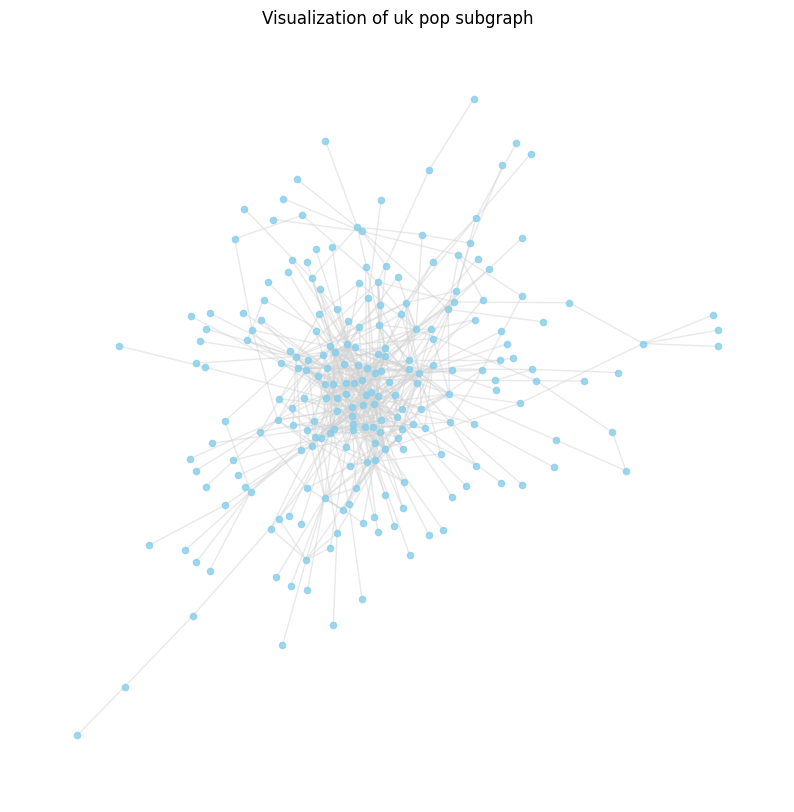

hip hop - Total nodes: 381, Isolated nodes: 52, Isolated percentage: 13.65%

20 most connected artist(s) in hip hop by number of connections:
Artist: Snoop Dogg, Connections: 89
Artist: The Game, Connections: 83
Artist: Gucci Mane, Connections: 80
Artist: Lil Wayne, Connections: 78
Artist: Ty Dolla $ign, Connections: 74
Artist: T.I., Connections: 74
Artist: 2 Chainz, Connections: 72
Artist: DJ Drama, Connections: 71
Artist: French Montana, Connections: 69
Artist: Rick Ross, Connections: 67
Artist: Busta Rhymes, Connections: 66
Artist: DJ Khaled, Connections: 61
Artist: Wiz Khalifa, Connections: 57
Artist: Young Thug, Connections: 55
Artist: Jeezy, Connections: 55
Artist: Meek Mill, Connections: 54
Artist: Nas, Connections: 53
Artist: Big Sean, Connections: 53
Artist: Ludacris, Connections: 52
Artist: JAY-Z, Connections: 51

Diameter for hip hop: 7
Global clustering for hip hop: 0.3213617764789591
Density for hip hop: 0.044483217950882725

Comparable random graph diameter: 4
Comparable 

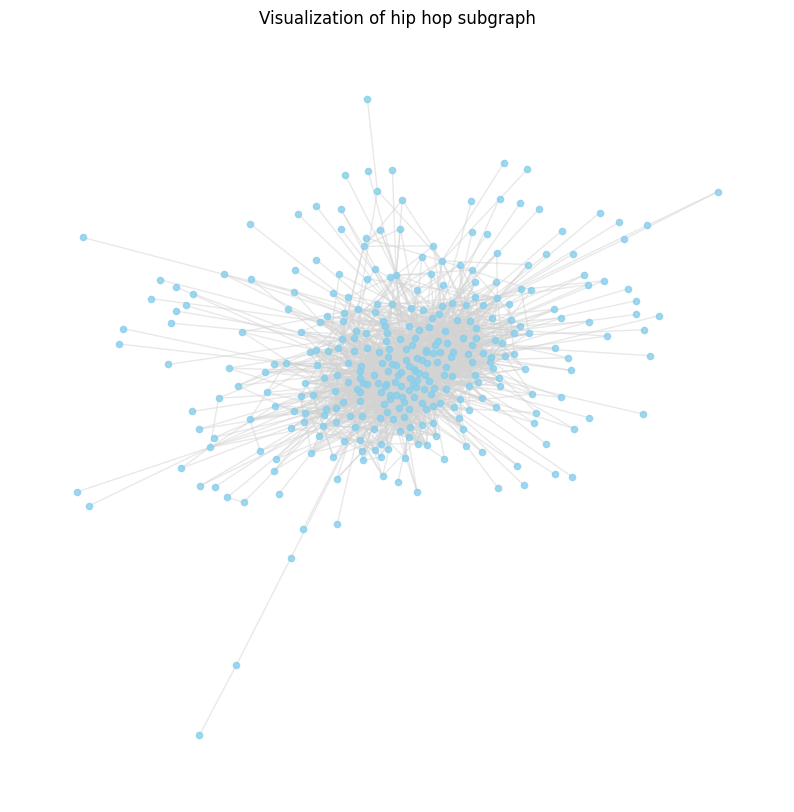

rap - Total nodes: 448, Isolated nodes: 28, Isolated percentage: 6.25%

20 most connected artist(s) in rap by number of connections:
Artist: Gucci Mane, Connections: 130
Artist: Lil Wayne, Connections: 101
Artist: Future, Connections: 100
Artist: French Montana, Connections: 100
Artist: 2 Chainz, Connections: 99
Artist: Young Thug, Connections: 94
Artist: The Game, Connections: 93
Artist: T.I., Connections: 91
Artist: Snoop Dogg, Connections: 89
Artist: DJ Khaled, Connections: 88
Artist: Rick Ross, Connections: 85
Artist: DJ Drama, Connections: 85
Artist: Wiz Khalifa, Connections: 82
Artist: Yo Gotti, Connections: 80
Artist: Juicy J, Connections: 79
Artist: Meek Mill, Connections: 77
Artist: Jeezy, Connections: 76
Artist: Lil Durk, Connections: 76
Artist: YG, Connections: 72
Artist: Big Sean, Connections: 69

Diameter for rap: 6
Global clustering for rap: 0.34055141677639184
Density for rap: 0.04635906659287954

Comparable random graph diameter: 4
Comparable random graph global cluster

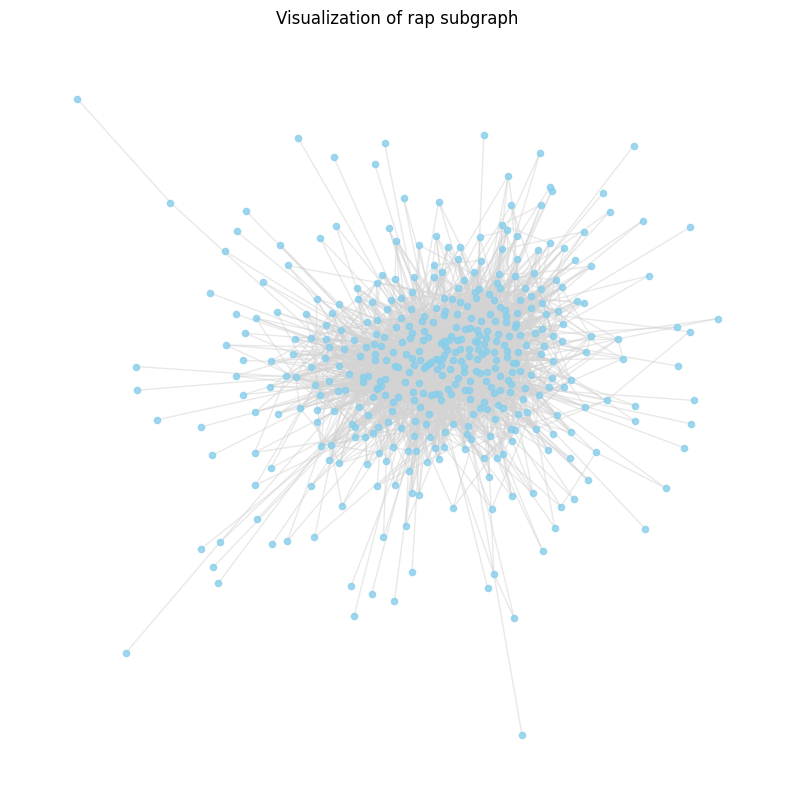

electro house - Total nodes: 512, Isolated nodes: 48, Isolated percentage: 9.38%

20 most connected artist(s) in electro house by number of connections:
Artist: Steve Aoki, Connections: 102
Artist: Hardwell, Connections: 63
Artist: Diplo, Connections: 59
Artist: R3HAB, Connections: 55
Artist: Dimitri Vegas & Like Mike, Connections: 54
Artist: Afrojack, Connections: 53
Artist: Martin Garrix, Connections: 50
Artist: Nicky Romero, Connections: 49
Artist: Galantis, Connections: 49
Artist: Dillon Francis, Connections: 48
Artist: NERVO, Connections: 45
Artist: MOTi, Connections: 43
Artist: Tchami, Connections: 39
Artist: Zeds Dead, Connections: 39
Artist: Kaskade, Connections: 38
Artist: Good Times Ahead, Connections: 35
Artist: A-Trak, Connections: 34
Artist: Timmy Trumpet, Connections: 34
Artist: Quintino, Connections: 34
Artist: Krewella, Connections: 34

Diameter for electro house: 7
Global clustering for electro house: 0.1782269055821512
Density for electro house: 0.019997020927980932



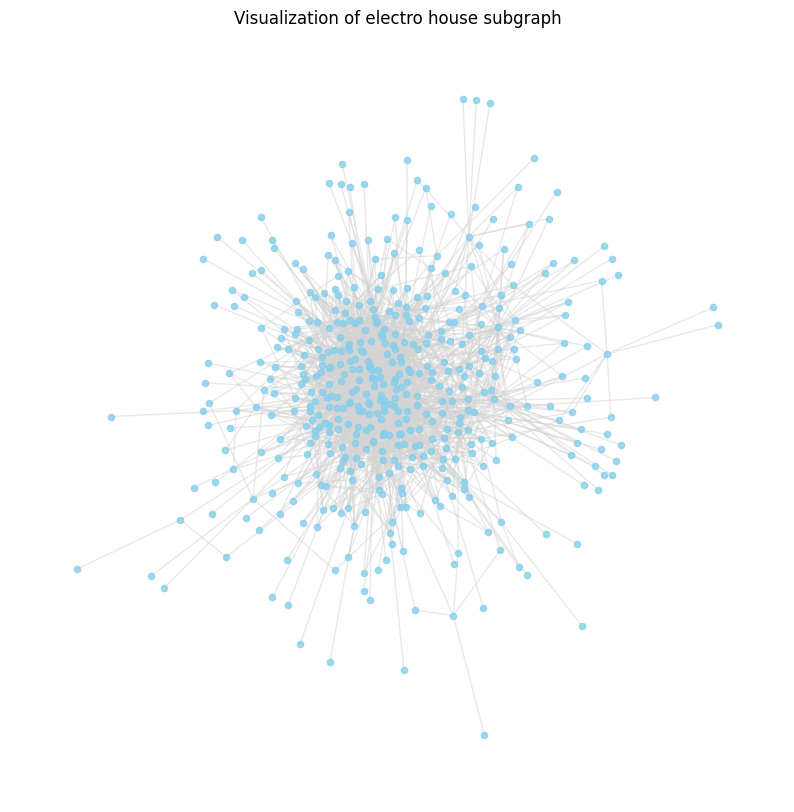

r&b - Total nodes: 299, Isolated nodes: 77, Isolated percentage: 25.75%

20 most connected artist(s) in r&b by number of connections:
Artist: Wale, Connections: 42
Artist: Ty Dolla $ign, Connections: 41
Artist: Chris Brown, Connections: 41
Artist: Fabolous, Connections: 33
Artist: Diddy, Connections: 27
Artist: Mariah Carey, Connections: 27
Artist: Missy Elliott, Connections: 26
Artist: Eric Bellinger, Connections: 25
Artist: 6LACK, Connections: 23
Artist: T-Pain, Connections: 22
Artist: Trey Songz, Connections: 20
Artist: Mary J. Blige, Connections: 20
Artist: Lucky Daye, Connections: 20
Artist: Big Sean, Connections: 19
Artist: Kehlani, Connections: 19
Artist: Tory Lanez, Connections: 19
Artist: Jhené Aiko, Connections: 18
Artist: K CAMP, Connections: 17
Artist: Jacquees, Connections: 17
Artist: Jeremih, Connections: 17

Diameter for r&b: 6
Global clustering for r&b: 0.2017240581787275
Density for r&b: 0.02885443583118002

Comparable random graph diameter: 6
Comparable random graph g

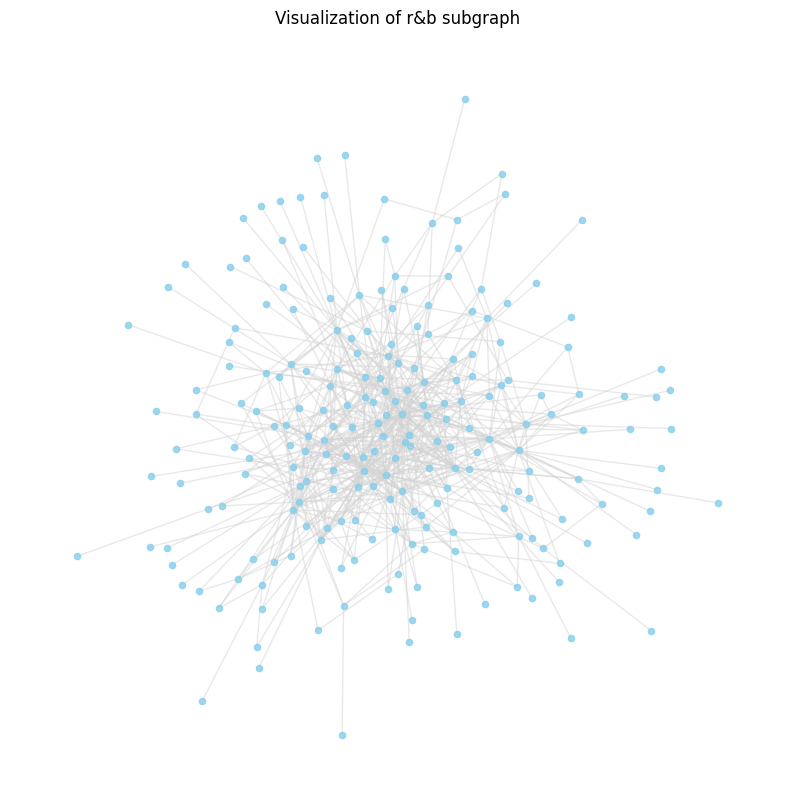

tropical house - Total nodes: 355, Isolated nodes: 29, Isolated percentage: 8.17%

20 most connected artist(s) in tropical house by number of connections:
Artist: Tiësto, Connections: 56
Artist: R3HAB, Connections: 47
Artist: MOTi, Connections: 43
Artist: Sam Feldt, Connections: 40
Artist: Robin Schulz, Connections: 39
Artist: Steve Aoki, Connections: 38
Artist: Clean Bandit, Connections: 36
Artist: Alle Farben, Connections: 34
Artist: Dimitri Vegas & Like Mike, Connections: 33
Artist: Diplo, Connections: 33
Artist: Rudimental, Connections: 32
Artist: Afrojack, Connections: 32
Artist: HUGEL, Connections: 31
Artist: Lost Frequencies, Connections: 31
Artist: Nicky Romero, Connections: 30
Artist: Galantis, Connections: 30
Artist: Cheat Codes, Connections: 30
Artist: Becky Hill, Connections: 28
Artist: Jonas Blue, Connections: 27
Artist: Joel Corry, Connections: 27

Diameter for tropical house: 8
Global clustering for tropical house: 0.14357584845929872
Density for tropical house: 0.030825

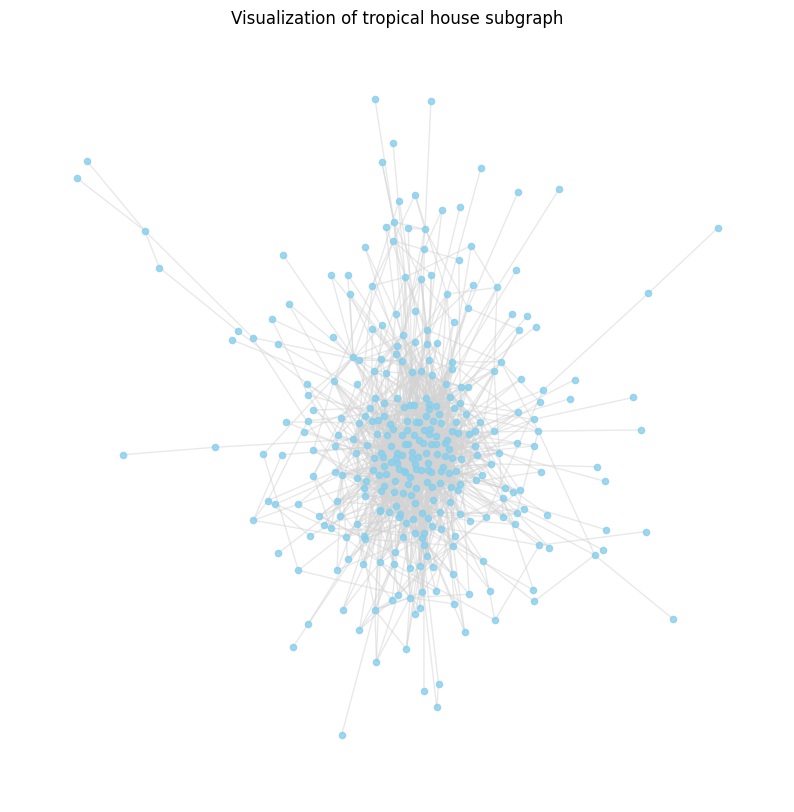

french hip hop - Total nodes: 382, Isolated nodes: 31, Isolated percentage: 8.12%

20 most connected artist(s) in french hip hop by number of connections:
Artist: Le classico organisé, Connections: 75
Artist: Leto, Connections: 65
Artist: Alonzo, Connections: 65
Artist: Alkpote, Connections: 59
Artist: Koba LaD, Connections: 50
Artist: DJ Kayz, Connections: 50
Artist: Naps, Connections: 47
Artist: Rim'K, Connections: 47
Artist: Sadek, Connections: 46
Artist: DA Uzi, Connections: 46
Artist: Naza, Connections: 45
Artist: Lacrim, Connections: 45
Artist: Sofiane, Connections: 44
Artist: Soprano, Connections: 41
Artist: Ninho, Connections: 41
Artist: SCH, Connections: 39
Artist: PLK, Connections: 36
Artist: Niska, Connections: 36
Artist: RK, Connections: 34
Artist: Jok'air, Connections: 34

Diameter for french hip hop: 7
Global clustering for french hip hop: 0.23540070642300626
Density for french hip hop: 0.03333277806466659

Comparable random graph diameter: 4
Comparable random graph globa

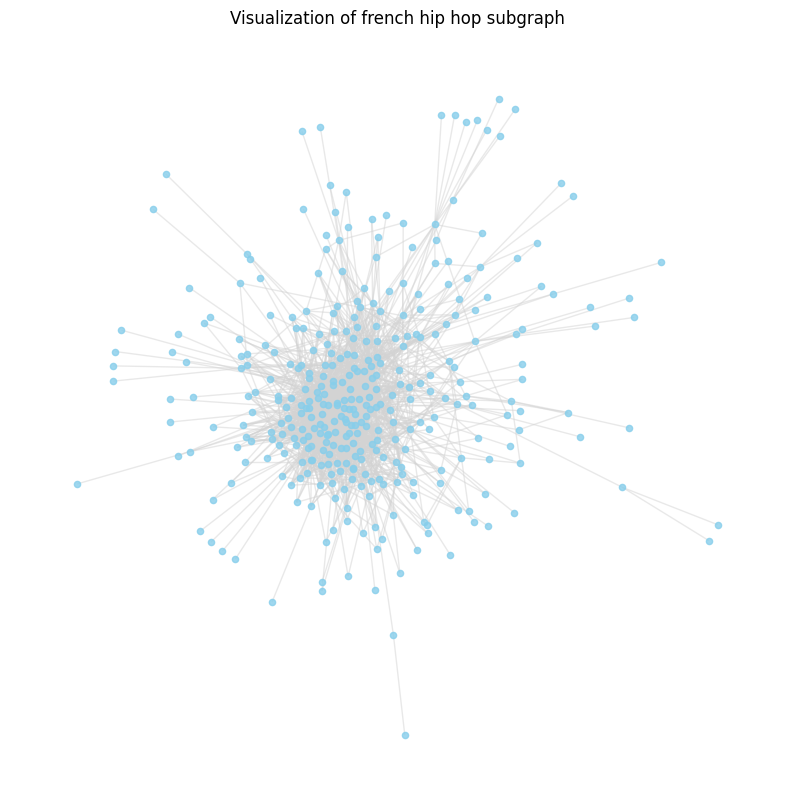

edm - Total nodes: 452, Isolated nodes: 16, Isolated percentage: 3.54%

20 most connected artist(s) in edm by number of connections:
Artist: Tiësto, Connections: 93
Artist: Steve Aoki, Connections: 89
Artist: R3HAB, Connections: 71
Artist: David Guetta, Connections: 68
Artist: Armin van Buuren, Connections: 65
Artist: Diplo, Connections: 58
Artist: Dimitri Vegas & Like Mike, Connections: 57
Artist: MOTi, Connections: 57
Artist: Afrojack, Connections: 53
Artist: Hardwell, Connections: 53
Artist: ILLENIUM, Connections: 52
Artist: Dillon Francis, Connections: 51
Artist: Nicky Romero, Connections: 47
Artist: Galantis, Connections: 47
Artist: Martin Garrix, Connections: 45
Artist: The Chainsmokers, Connections: 45
Artist: Sam Feldt, Connections: 43
Artist: Tritonal, Connections: 42
Artist: Kaskade, Connections: 41
Artist: Clean Bandit, Connections: 40

Diameter for edm: 7
Global clustering for edm: 0.21343003396405225
Density for edm: 0.02953706632922071

Comparable random graph diameter: 4

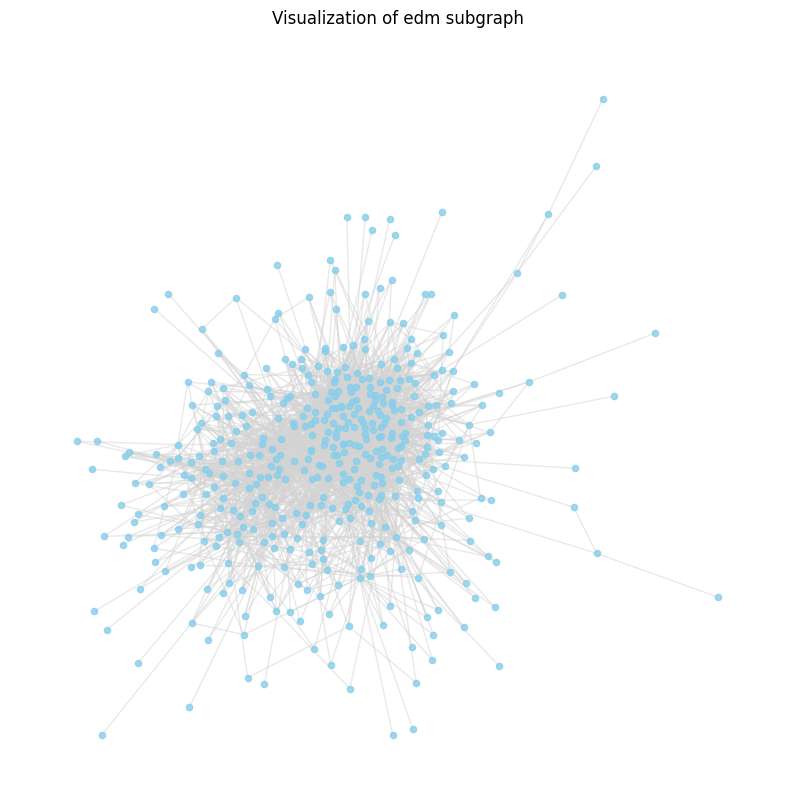

pop dance - Total nodes: 378, Isolated nodes: 11, Isolated percentage: 2.91%

20 most connected artist(s) in pop dance by number of connections:
Artist: Tiësto, Connections: 88
Artist: David Guetta, Connections: 72
Artist: R3HAB, Connections: 71
Artist: Steve Aoki, Connections: 70
Artist: Armin van Buuren, Connections: 62
Artist: MOTi, Connections: 58
Artist: Dimitri Vegas & Like Mike, Connections: 57
Artist: Diplo, Connections: 51
Artist: Afrojack, Connections: 50
Artist: Hardwell, Connections: 48
Artist: Galantis, Connections: 47
Artist: Nicky Romero, Connections: 46
Artist: Sam Feldt, Connections: 44
Artist: Robin Schulz, Connections: 41
Artist: Becky Hill, Connections: 39
Artist: Clean Bandit, Connections: 39
Artist: Joel Corry, Connections: 39
Artist: Dillon Francis, Connections: 37
Artist: Martin Garrix, Connections: 37
Artist: NERVO, Connections: 37

Diameter for pop dance: 7
Global clustering for pop dance: 0.21238263110721203
Density for pop dance: 0.03837048286952249

Compara

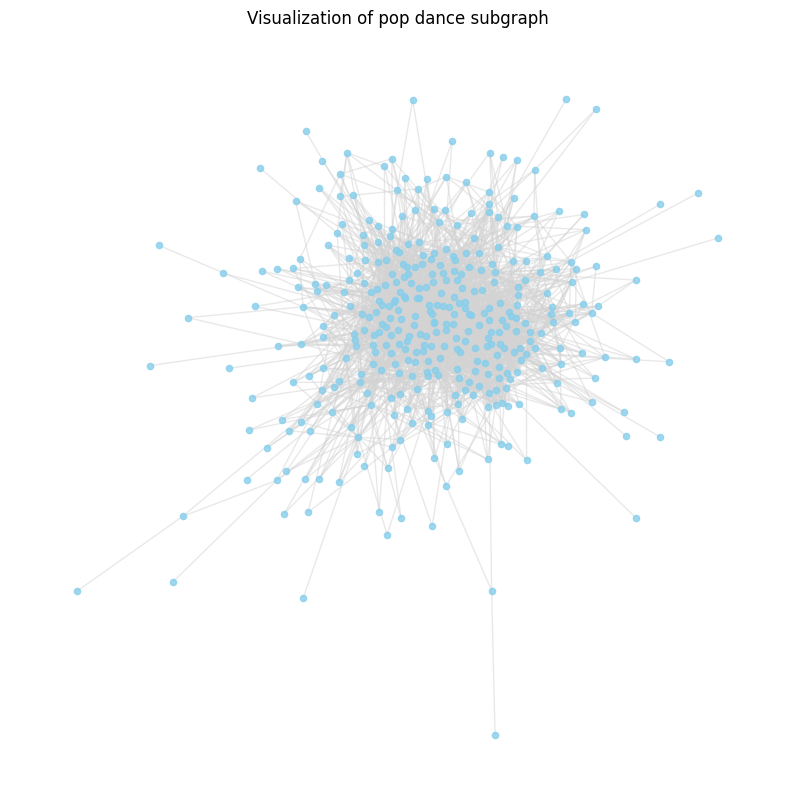

pop edm - Total nodes: 368, Isolated nodes: 94, Isolated percentage: 25.54%

20 most connected artist(s) in pop edm by number of connections:
Artist: Tritonal, Connections: 43
Artist: Cash Cash, Connections: 32
Artist: Sam Feldt, Connections: 32
Artist: Nicky Romero, Connections: 23
Artist: NERVO, Connections: 23
Artist: MOTi, Connections: 22
Artist: Matoma, Connections: 18
Artist: TELYKast, Connections: 16
Artist: GATTÜSO, Connections: 15
Artist: The Him, Connections: 14
Artist: Borgeous, Connections: 14
Artist: Jay Hardway, Connections: 13
Artist: Shaun Frank, Connections: 13
Artist: San Holo, Connections: 13
Artist: Thomas Gold, Connections: 13
Artist: Mike Williams, Connections: 13
Artist: Lucas & Steve, Connections: 13
Artist: Lost Kings, Connections: 12
Artist: Martin Jensen, Connections: 12
Artist: Vicetone, Connections: 12

Diameter for pop edm: 10
Global clustering for pop edm: 0.11298989371313631
Density for pop edm: 0.016229512579877543

Comparable random graph diameter: 7
C

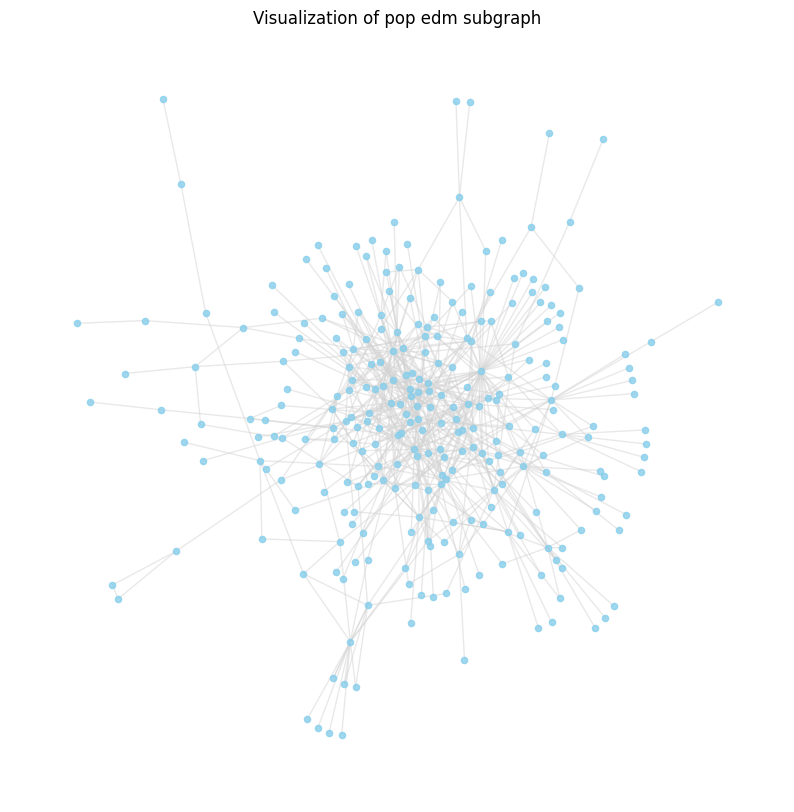

filmi - Total nodes: 351, Isolated nodes: 13, Isolated percentage: 3.70%

20 most connected artist(s) in filmi by number of connections:
Artist: A.R. Rahman, Connections: 115
Artist: Pritam, Connections: 111
Artist: Yuvan Shankar Raja, Connections: 92
Artist: Shankar Mahadevan, Connections: 76
Artist: Shankar-Ehsaan-Loy, Connections: 73
Artist: G. V. Prakash, Connections: 73
Artist: Shreya Ghoshal, Connections: 72
Artist: Hariharan, Connections: 68
Artist: Devi Sri Prasad, Connections: 66
Artist: Sukhwinder Singh, Connections: 65
Artist: Vishal-Shekhar, Connections: 64
Artist: Himesh Reshammiya, Connections: 62
Artist: Arijit Singh, Connections: 59
Artist: Amit Trivedi, Connections: 59
Artist: Mika Singh, Connections: 55
Artist: Sunidhi Chauhan, Connections: 53
Artist: Benny Dayal, Connections: 53
Artist: Alka Yagnik, Connections: 51
Artist: Udit Narayan, Connections: 51
Artist: Neeti Mohan, Connections: 50

Diameter for filmi: 5
Global clustering for filmi: 0.3990999018972658
Density 

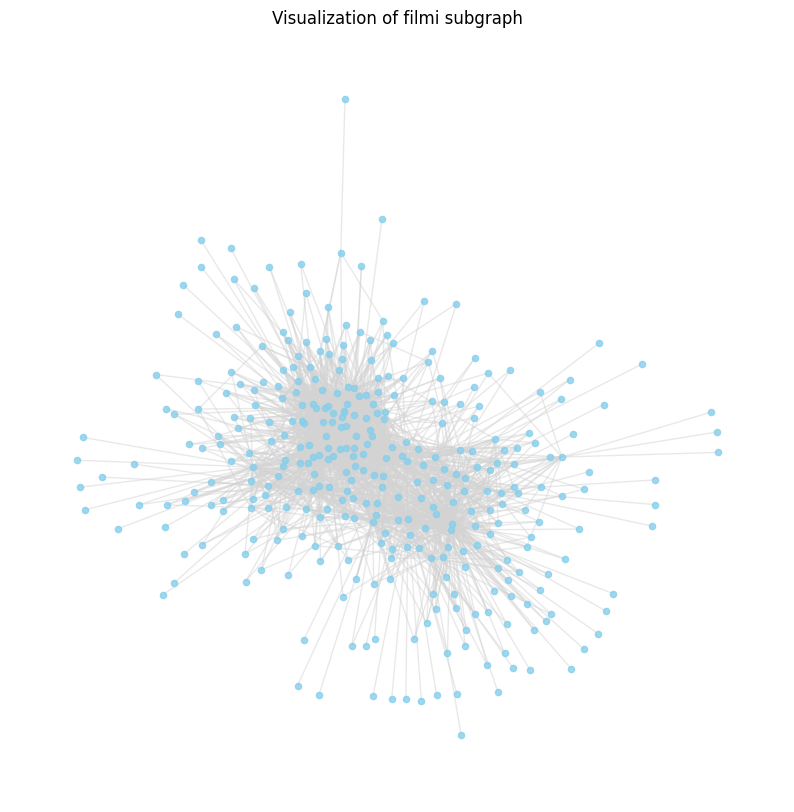

country - Total nodes: 194, Isolated nodes: 48, Isolated percentage: 24.74%

20 most connected artist(s) in country by number of connections:
Artist: Blake Shelton, Connections: 21
Artist: Dolly Parton, Connections: 18
Artist: Thomas Rhett, Connections: 16
Artist: Brad Paisley, Connections: 16
Artist: Miranda Lambert, Connections: 13
Artist: Kenny Chesney, Connections: 12
Artist: Dierks Bentley, Connections: 11
Artist: Tim McGraw, Connections: 11
Artist: Keith Urban, Connections: 10
Artist: HARDY, Connections: 10
Artist: Jason Aldean, Connections: 10
Artist: Chris Young, Connections: 9
Artist: Zac Brown Band, Connections: 9
Artist: Josh Turner, Connections: 9
Artist: Lady A, Connections: 8
Artist: Little Big Town, Connections: 8
Artist: Florida Georgia Line, Connections: 8
Artist: BRELAND, Connections: 8
Artist: Brantley Gilbert, Connections: 8
Artist: Kenny Rogers, Connections: 8

Diameter for country: 8
Global clustering for country: 0.11736055565712428
Density for country: 0.0253496

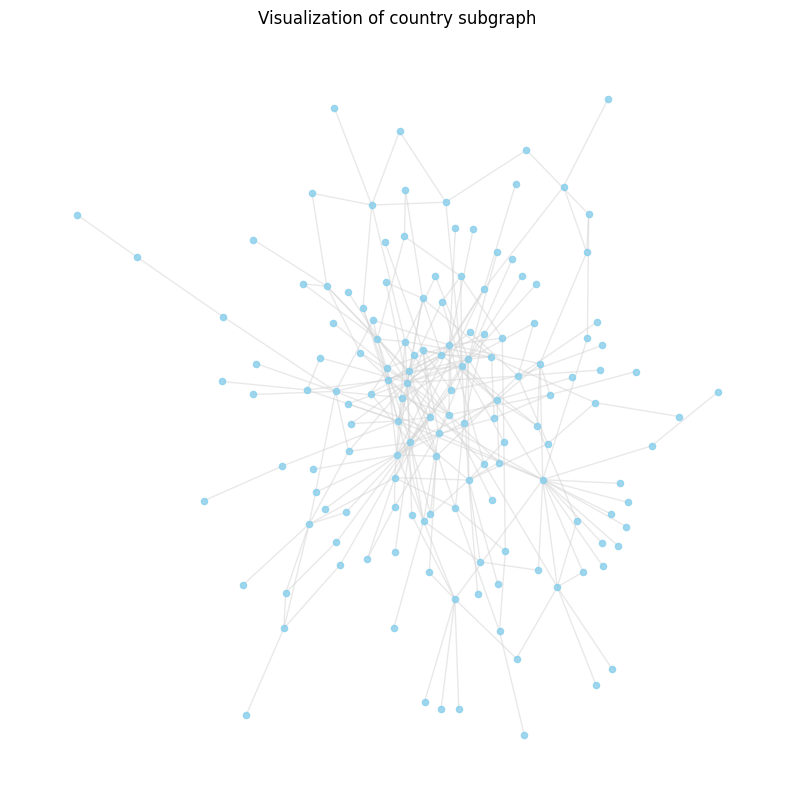

funk carioca - Total nodes: 349, Isolated nodes: 20, Isolated percentage: 5.73%

20 most connected artist(s) in funk carioca by number of connections:
Artist: MC Ryan SP, Connections: 72
Artist: Mc Gw, Connections: 68
Artist: Mc Don Juan, Connections: 63
Artist: DENNIS, Connections: 61
Artist: Mc Lele JP, Connections: 55
Artist: MC Marks, Connections: 54
Artist: Mc Davi, Connections: 52
Artist: MC Kevin o Chris, Connections: 52
Artist: MC Hariel, Connections: 50
Artist: MC Joãozinho VT, Connections: 49
Artist: Dj Batata, Connections: 48
Artist: Mc Kevin, Connections: 47
Artist: MC Menor da VG, Connections: 45
Artist: WC no Beat, Connections: 41
Artist: Mc IG, Connections: 41
Artist: Gaab, Connections: 40
Artist: MC Lan, Connections: 39
Artist: Mc Dricka, Connections: 38
Artist: Pk, Connections: 37
Artist: MC Kekel, Connections: 34

Diameter for funk carioca: 6
Global clustering for funk carioca: 0.2833120931035262
Density for funk carioca: 0.04092223293053599

Comparable random graph d

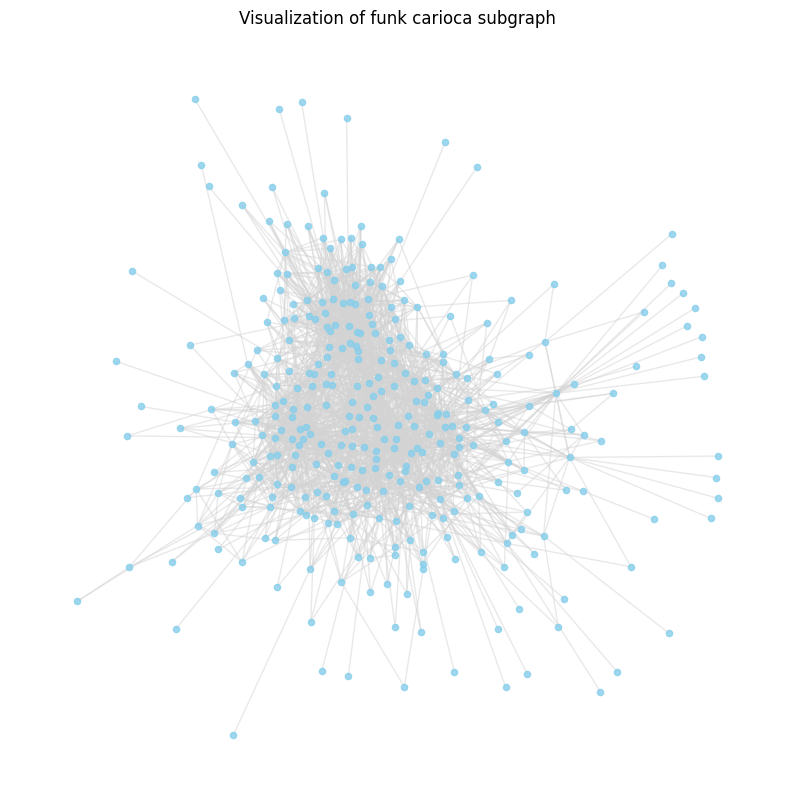

jazz - Total nodes: 74, Isolated nodes: 64, Isolated percentage: 86.49%

20 most connected artist(s) in jazz by number of connections:
Artist: Pat Metheny, Connections: 5

Diameter for jazz: 2
Global clustering for jazz: 0.0
Density for jazz: 0.3333333333333333

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.6

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.3333333333333333

Edge count: 8
Node count: 10
k = 2
Comparable regular lattice diameter: 3
Comparable regular lattice global clustering: 0.0


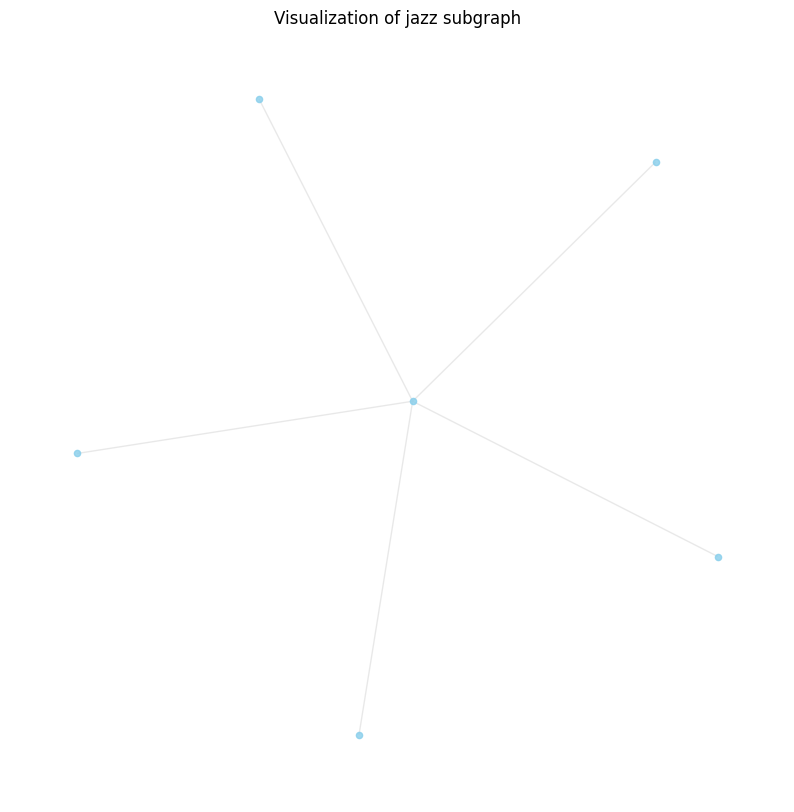

In [667]:
# define the genres to analyze:
selected_genres = ['pop', 'electro house', 'dance pop', 'pop dance', 'edm', 'pop edm', 'rap', 'r&b', 'hip hop', 'german hip hop', 
                   'uk pop', 'french hip hop', 'funk carioca', 'filmi', 'country', 'jazz', 'tropical house']

# build genre subgraphs for selected genres:
genre_subgraphs = {}
for node, data in G.nodes(data=True):
    if 'genres' in data:
        for genre in data['genres']:
            if genre in selected_genres:
                if genre not in genre_subgraphs:
                    genre_subgraphs[genre] = []
                genre_subgraphs[genre].append(node)

# calculate isolated nodes & create subgraphs for each selected genre:
for genre, nodes in genre_subgraphs.items():
    subgraph = G.subgraph(nodes).copy()

    # calculate isolated nodes and percentage:
    isolated_nodes = list(nx.isolates(subgraph))
    num_isolated = len(isolated_nodes)
    total_nodes = subgraph.number_of_nodes()
    isolated_percentage = (num_isolated / total_nodes) * 100 if total_nodes > 0 else 0
    print(f"{genre} - Total nodes: {total_nodes}, Isolated nodes: {num_isolated}, Isolated percentage: {isolated_percentage:.2f}%")

    # remove isolated nodes:
    subgraph.remove_nodes_from(isolated_nodes)
    if subgraph.number_of_nodes() == 0:
        print(f"Skipping {genre}: No nodes remain after removing isolated nodes.")
        continue

    # ensure largest_cc is always a Graph:
    if nx.is_connected(subgraph):
        largest_cc = subgraph
    else:
        # get largest connected component as a set of nodes:
        largest_cc_nodes = max(nx.connected_components(subgraph), key=len)
        # convert node set into a subgraph:
        largest_cc = subgraph.subgraph(largest_cc_nodes).copy()

    # verify largest_cc is a Graph & not empty:
    if not isinstance(largest_cc, nx.Graph) or largest_cc.number_of_nodes() == 0:
        print(f"Skipping {genre}: largest_cc is not a valid graph or is empty.")
        continue

    # find top 20 artists by degree in largest connected component:
    top_20_artists = sorted(largest_cc.degree, key=lambda x: x[1], reverse=True)[:20]
    print(f"\n20 most connected artist(s) in {genre} by number of connections:")
    for artist, degree in top_20_artists:
        # don't include "top artists" w/ no collaborations:
        if degree > 1:
            artist_name = G.nodes[artist].get('name', 'Unknown')
            print(f"Artist: {artist_name}, Connections: {degree}")

    # find diameter & global clustering for each genre's largest cluster:
    subgraph_diameter = nx.diameter(largest_cc)
    print(f"\nDiameter for {genre}: {subgraph_diameter}")
    subgraph_clustering = nx.average_clustering(largest_cc)
    print(f"Global clustering for {genre}: {subgraph_clustering}")
    subgraph_density = nx.density(largest_cc)
    print(f"Density for {genre}: {subgraph_density}\n")


    # COMPARABLE RANDOM GRAPHS:
    n = largest_cc.number_of_nodes()
    p = subgraph_density

    # generate & draw 3 samples:
    random_graphs = generate_graphs(n, p, 3)

    # analyze each:
    for random_G in random_graphs:
    # check if random graph sample is connected:
        if not nx.is_connected(random_G):
            # get largest component as a set:
            random_largest_cc_nodes = max(nx.connected_components(random_G), key=len)
            # convert to subgraph:
            random_G = random_G.subgraph(random_largest_cc_nodes).copy()

        # approximate diameter calculation using largest connected component:
        randomG_diameter = nx.diameter(random_G)
        print(f"Comparable random graph diameter: {randomG_diameter}")

        # calculate global clustering coefficient:
        randomG_clustering = nx.average_clustering(random_G)
        print(f"Comparable random graph global clustering: {randomG_clustering}")
        print('')



    # COMPARABLE REGULAR LATTICE:
    # count nodes and edges:    
    edge_count = subgraph.number_of_edges()
    print("Edge count:", edge_count)

    node_count = subgraph.number_of_nodes()
    print("Node count:", node_count)

    # decide k:
    k = (2 * edge_count) / len(subgraph)
    k = int(k)
    if k % 2 != 0:
        k += 1  # make k even
    print(f"k = {k}")

    if n > k:
        # generate regular lattice:
        reg_lat = nx.watts_strogatz_graph(n, k, 0)

        # diameter calculation:
        reg_lat_diameter = ceil(n / k)
        print(f"Comparable regular lattice diameter: {reg_lat_diameter}")
                
        # calculate global clustering coefficient:
        reg_lat_clustering = nx.average_clustering(reg_lat)
        print(f"Comparable regular lattice global clustering: {reg_lat_clustering}")
    else:
        print(f"Skipping regular lattice for {genre} because n < k.\n")
        print
        continue

    # visualize only the largest connected component if it has more than one node:
    if len(largest_cc) > 1:
        visualize_genre_subgraph(largest_cc, genre)

A closer look at jazz, uk pop, and r&b:

Number of artists in uk pop: 406


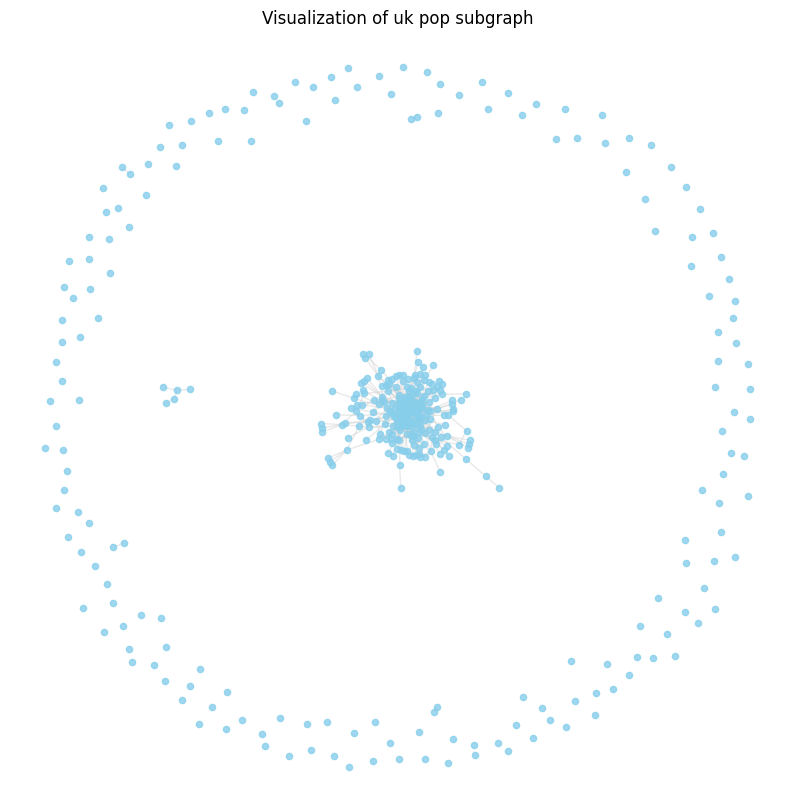

Number of artists in r&b: 299


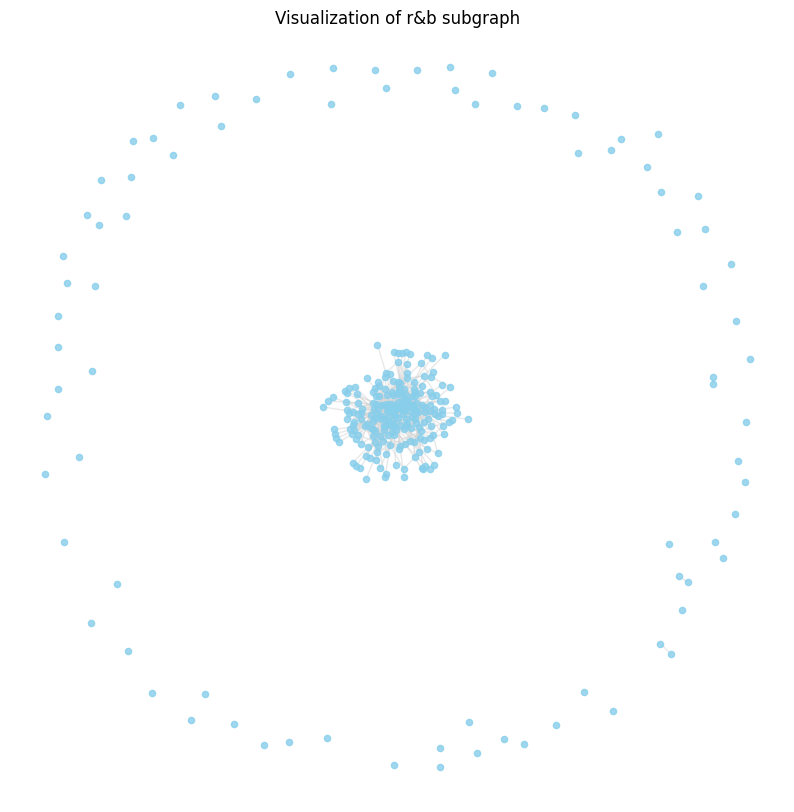

Number of artists in jazz: 74


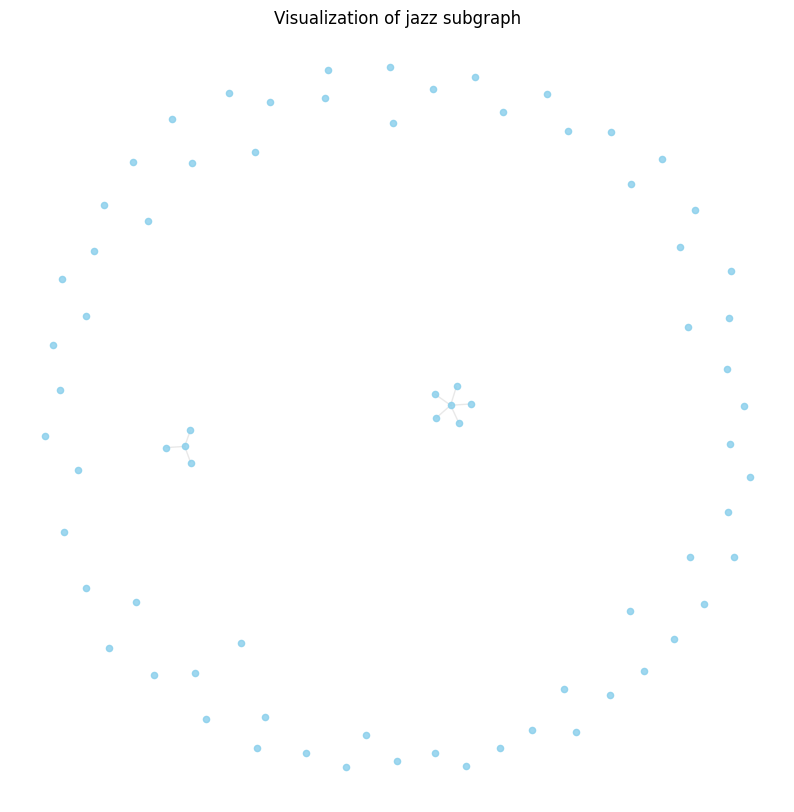


Those two most connected artists in jazz:
Artist: Pat Metheny, Connections: 5
Pat Metheny collaborated with: Charlie Haden, Ornette Coleman, John Scofield, Dave Liebman, Brad Mehldau

Artist: Kurt Elling, Connections: 3
Kurt Elling collaborated with: Marquis Hill, Branford Marsalis, Miguel Zenón



In [668]:
# runtime 0s

selected_genres = ['r&b', 'uk pop', 'jazz']

genre_subgraphs2 = {}
for node, data in G.nodes(data=True):
    if 'genres' in data:
        for genre in data['genres']:
            if genre in selected_genres:
                if genre not in genre_subgraphs2:
                    genre_subgraphs2[genre] = []
                genre_subgraphs2[genre].append(node)

# create entire subgraphs for each selected genre:
for genre, nodes in genre_subgraphs2.items():
    subgraph = G.subgraph(nodes).copy()
    print(f"Number of artists in {genre}: {subgraph.number_of_nodes()}")
    visualize_genre_subgraph(subgraph, genre)

    if genre == 'jazz':
        top_5_artists = sorted(subgraph.degree, key=lambda x: x[1], reverse=True)[:3]
        print(f"\nThose two most connected artists in {genre}:")
        for artist, degree in top_5_artists:
            if degree > 1:
                artist_name = subgraph.nodes[artist].get('name', 'Unknown')
                print(f"Artist: {artist_name}, Connections: {degree}")
                collaborators = [subgraph.nodes[neighbor].get('name', 'Unknown') for neighbor in subgraph.neighbors(artist)]
                print(f"{artist_name} collaborated with: {', '.join(collaborators)}\n")

**We're going to shift to analyzing the Spotify artists who have made it onto Weekly charts now (the seed artists):**

In [670]:
# reload data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes_df = pd.read_csv(nodes_path)
edges_df = pd.read_csv(edges_path)

# parse columns:
nodes_df['genres'] = nodes_df['genres'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])

# recreate graph:
G = nx.Graph()

# add nodes to the graph w/ attributes:
for _, row in nodes_df.iterrows():
    G.add_node(row['spotify_id'], **row.to_dict())

# add edges to graph:
for _, row in edges_df.iterrows():
    G.add_edge(row['id_0'], row['id_1'])

# group nodes by genre:
genre_subgraphs = {}
for _, row in nodes_df.iterrows():
    for genre in row['genres']:
        if genre not in genre_subgraphs:
            genre_subgraphs[genre] = []
        genre_subgraphs[genre].append(row['spotify_id'])

# filter chart-topping artists:
chart_topper_nodes = nodes_df[nodes_df['chart_hits'].apply(lambda x: len(x) > 0)].spotify_id.tolist()

Let's look at a few genre graphs including (and highlight their top artists):

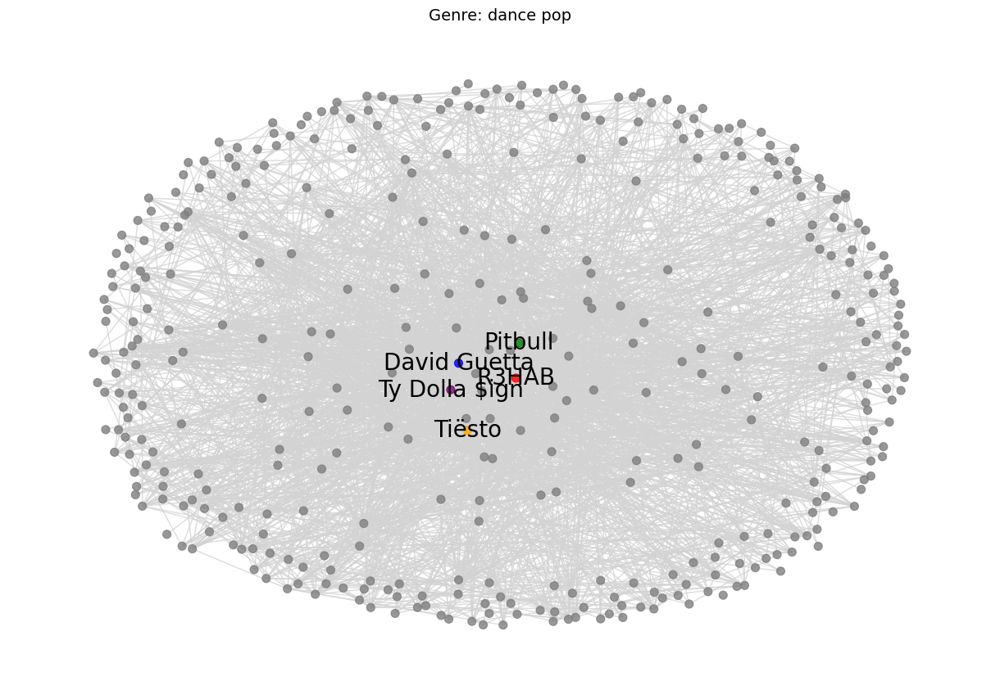


20 most connected artist(s) in dance pop by number of connections:
Artist: R3HAB, Connections: 88
Artist: David Guetta, Connections: 83
Artist: Tiësto, Connections: 59
Artist: Pitbull, Connections: 53
Artist: Ty Dolla $ign, Connections: 53
Artist: Steve Aoki, Connections: 51
Artist: Nicki Minaj, Connections: 48
Artist: MOTi, Connections: 44
Artist: Afrojack, Connections: 44
Artist: Chris Brown, Connections: 43
Artist: Sean Paul, Connections: 42
Artist: Clean Bandit, Connections: 41
Artist: Major Lazer, Connections: 40
Artist: Flo Rida, Connections: 39
Artist: Don Diablo, Connections: 38
Artist: Cheat Codes, Connections: 38
Artist: Dimitri Vegas & Like Mike, Connections: 37
Artist: Ludacris, Connections: 37
Artist: Sam Feldt, Connections: 36
Artist: Missy Elliott, Connections: 34

Diameter for dance pop: 6
Global clustering for dance pop: 0.19247642436806972
Density for dance pop: 0.03611044799872683

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.0367

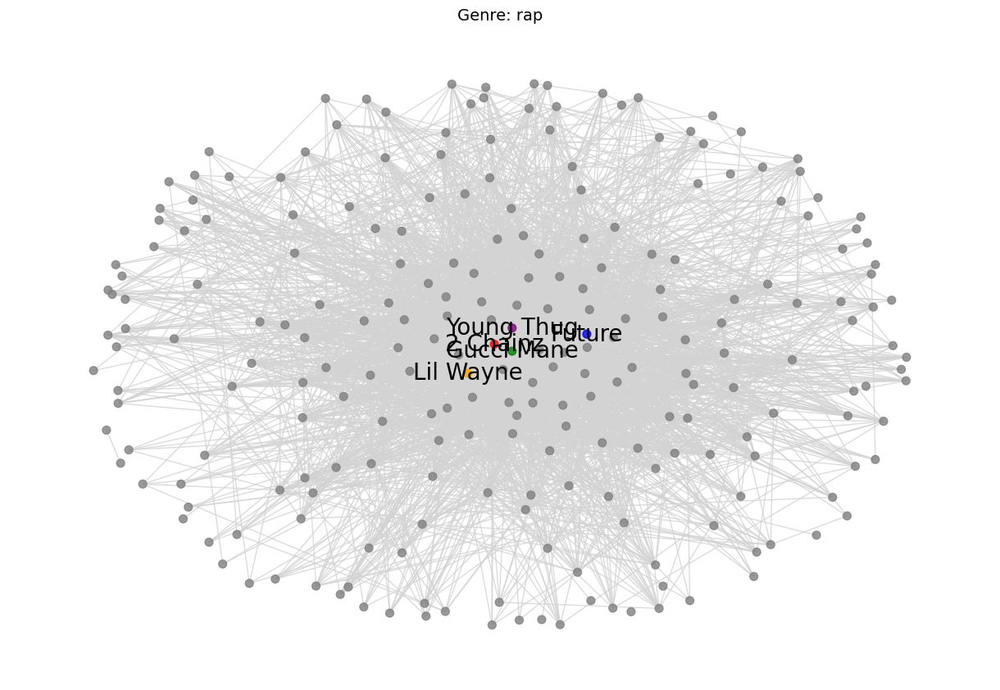


20 most connected artist(s) in rap by number of connections:
Artist: Gucci Mane, Connections: 87
Artist: Young Thug, Connections: 86
Artist: 2 Chainz, Connections: 86
Artist: Future, Connections: 86
Artist: Lil Wayne, Connections: 84
Artist: French Montana, Connections: 78
Artist: Wiz Khalifa, Connections: 73
Artist: Lil Durk, Connections: 73
Artist: DJ Khaled, Connections: 68
Artist: Meek Mill, Connections: 68
Artist: The Game, Connections: 67
Artist: Quavo, Connections: 66
Artist: Juicy J, Connections: 66
Artist: Rick Ross, Connections: 65
Artist: Big Sean, Connections: 64
Artist: Lil Baby, Connections: 64
Artist: YG, Connections: 64
Artist: T.I., Connections: 63
Artist: Tyga, Connections: 62
Artist: Gunna, Connections: 61

Diameter for rap: 5
Global clustering for rap: 0.3774703447815073
Density for rap: 0.10615898169546238

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.10820443120481368

Comparable random graph diameter: 3
Comparable random graph

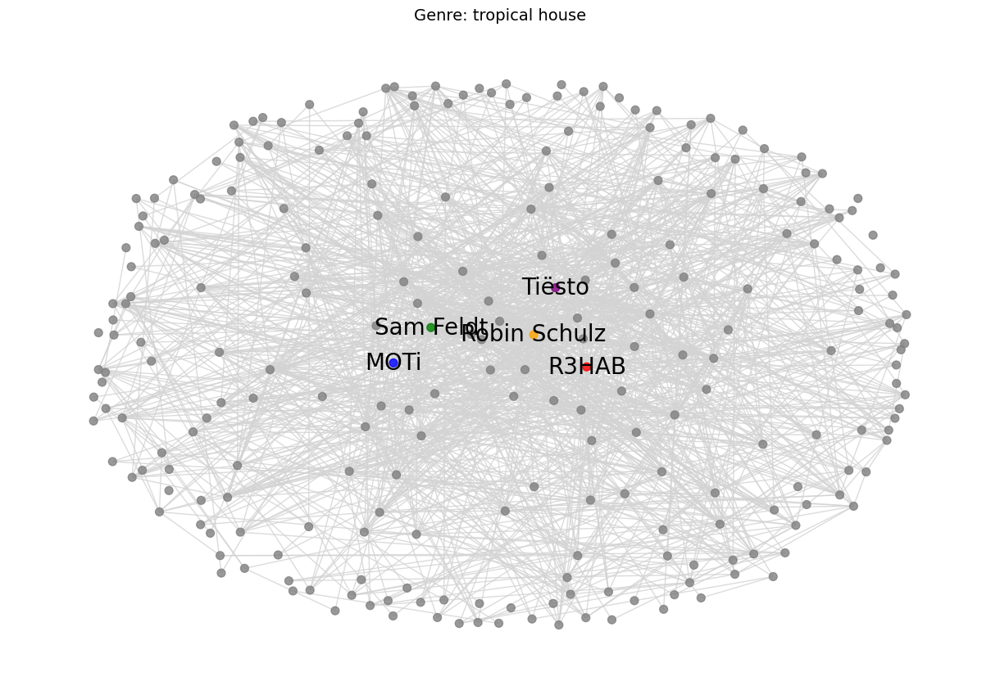


20 most connected artist(s) in tropical house by number of connections:
Artist: Tiësto, Connections: 51
Artist: R3HAB, Connections: 46
Artist: MOTi, Connections: 41
Artist: Sam Feldt, Connections: 36
Artist: Robin Schulz, Connections: 35
Artist: Steve Aoki, Connections: 34
Artist: Dimitri Vegas & Like Mike, Connections: 32
Artist: Clean Bandit, Connections: 32
Artist: Alle Farben, Connections: 30
Artist: HUGEL, Connections: 30
Artist: Galantis, Connections: 29
Artist: Afrojack, Connections: 28
Artist: Nicky Romero, Connections: 28
Artist: Cheat Codes, Connections: 28
Artist: Rudimental, Connections: 28
Artist: Lost Frequencies, Connections: 27
Artist: Joel Corry, Connections: 26
Artist: Don Diablo, Connections: 26
Artist: The Chainsmokers, Connections: 25
Artist: Diplo, Connections: 25

Diameter for tropical house: 7
Global clustering for tropical house: 0.15530822503106614
Density for tropical house: 0.04608110565557374

Comparable random graph diameter: 4
Comparable random graph glo

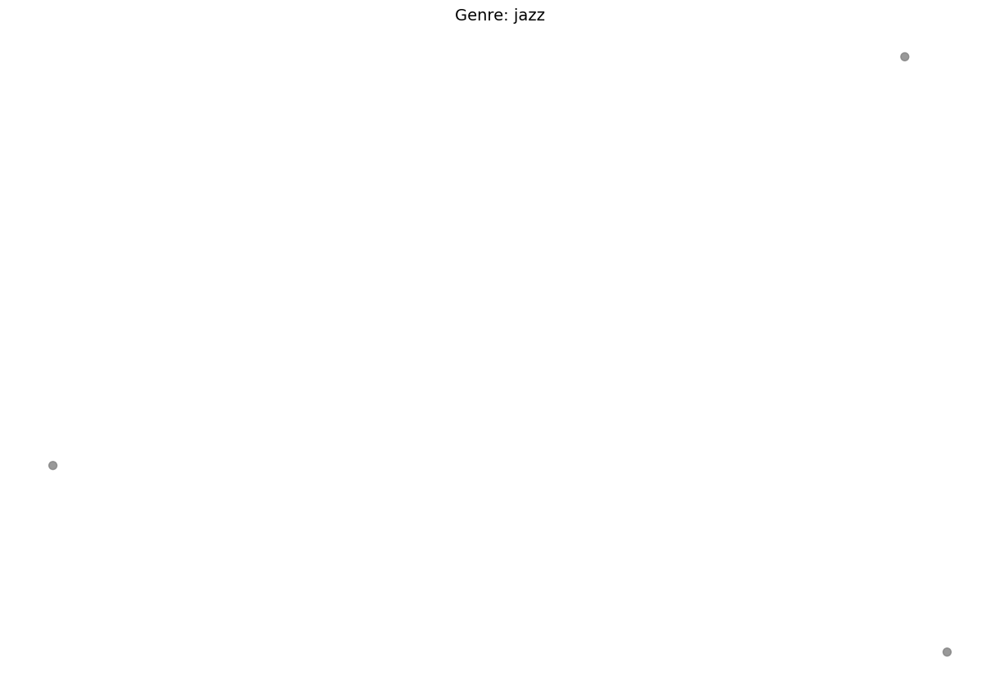


20 most connected artist(s) in jazz by number of connections:

Diameter for jazz: 0
Global clustering for jazz: 0.0
Density for jazz: 0

Comparable random graph diameter: 0
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 0
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 0
Comparable random graph global clustering: 0.0

Edge count: 0
Node count: 1
k = 0
Skipping regular lattice for jazz because n < k.



In [672]:
# define artist highlights for each genre (top 5):
highlight_artists = {
    'dance pop': {'R3HAB': 'red', 'David Guetta': 'blue', 'Tiësto': 'orange', 'Pitbull': 'green', 'Ty Dolla $ign': 'purple'},
    'rap': {'Gucci Mane': 'green', 'Lil Wayne': 'orange', 'Future': 'blue', 'Young Thug': 'purple', '2 Chainz': 'red'},
    'tropical house': {'Tiësto': 'purple', 'R3HAB': 'red', 'MOTi': 'blue', 'Sam Feldt': 'green', 'Robin Schulz': 'orange'},
    'jazz': {}
}

# to visualize subgraphs w/ highlighted nodes:
def visualize_highlighted_subgraph(subgraph, genre, highlights):
    pos = nx.spring_layout(subgraph, k=1.3, iterations=50)
    plt.figure(figsize=(12, 8))
    
    colors = []
    labels = {}
    
    for node in subgraph.nodes():
        node_color = 'gray'  # default color
        node_name = G.nodes[node].get('name', 'Unknown')
        if node_name in highlights:
            node_color = highlights[node_name]  # highlight color
            labels[node] = node_name  # label for highlighted nodes
        colors.append(node_color)

    # draw nodes & edges:
    nx.draw(subgraph, pos, node_color=colors, with_labels=False, node_size=50, alpha=0.8, edge_color='lightgray')
    nx.draw_networkx_labels(subgraph, pos, labels=labels, font_size=20, font_color='black')

    plt.title(f"Genre: {genre}", fontsize=14)
    plt.show()

# build, visualize, & analyze specific genre subgraphs:
for genre, highlights in highlight_artists.items():
    if genre in highlight_artists:
        # filter nodes in the genre to include only chart-toppers:
        subgraph_nodes = [node for node in genre_subgraphs[genre] if node in chart_topper_nodes]
        subgraph = G.subgraph(subgraph_nodes).copy()
        
        # skip isolated nodes:
        # subgraph.remove_nodes_from(list(nx.isolates(subgraph)))

        if subgraph.number_of_nodes() > 0:
            visualize_highlighted_subgraph(subgraph, genre, highlights)
        else:
            print(f"No nodes to visualize for genre: {genre}")

        
        if nx.is_connected(subgraph):
            largest_cc = subgraph
        else:
            # get largest connected component as a set of nodes:
            largest_cc_nodes = max(nx.connected_components(subgraph), key=len)
            # convert node set into a subgraph:
            largest_cc = subgraph.subgraph(largest_cc_nodes).copy()

        # verify largest_cc is a Graph & not empty:
        if not isinstance(largest_cc, nx.Graph) or largest_cc.number_of_nodes() == 0:
            print(f"Skipping {genre}: largest_cc is not a valid graph or is empty.")
            continue
        
        # find top 20 artists by degree in largest connected component:
        top_20_artists = sorted(largest_cc.degree, key=lambda x: x[1], reverse=True)[:20]
        print(f"\n20 most connected artist(s) in {genre} by number of connections:")
        for artist, degree in top_20_artists:
            # don't include "top artists" w/ no collaborations:
            if degree > 1:
                artist_name = G.nodes[artist].get('name', 'Unknown')
                print(f"Artist: {artist_name}, Connections: {degree}")

        # find diameter & global clustering for each genre's largest cluster:
        subgraph_diameter = nx.diameter(largest_cc)
        print(f"\nDiameter for {genre}: {subgraph_diameter}")
        subgraph_clustering = nx.average_clustering(largest_cc)
        print(f"Global clustering for {genre}: {subgraph_clustering}")
        subgraph_density = nx.density(largest_cc)
        print(f"Density for {genre}: {subgraph_density}\n")


        # COMPARABLE RANDOM GRAPHS:
        n = largest_cc.number_of_nodes()
        p = subgraph_density

        # generate & draw 3 samples:
        random_graphs = generate_graphs(n, p, 3)

        # analyze each:
        for random_G in random_graphs:
        # check if random graph sample is connected:
            if not nx.is_connected(random_G):
                # get largest component as a set:
                random_largest_cc_nodes = max(nx.connected_components(random_G), key=len)
                # convert to subgraph:
                random_G = random_G.subgraph(random_largest_cc_nodes).copy()

            # approximate diameter calculation using largest connected component:
            randomG_diameter = nx.diameter(random_G)
            print(f"Comparable random graph diameter: {randomG_diameter}")

            # calculate global clustering coefficient:
            randomG_clustering = nx.average_clustering(random_G)
            print(f"Comparable random graph global clustering: {randomG_clustering}")
            print('')


        subgraph = largest_cc

        # COMPARABLE REGULAR LATTICE:
        # count nodes and edges:    
        edge_count = subgraph.number_of_edges()
        print("Edge count:", edge_count)

        node_count = subgraph.number_of_nodes()
        print("Node count:", node_count)

        # decide k:
        k = (2 * edge_count) / len(subgraph)
        k = int(k)
        if k % 2 != 0:
            k += 1  # make k even
        print(f"k = {k}")

        if n > k and k != 0:
            # generate regular lattice:
            reg_lat = nx.watts_strogatz_graph(n, k, 0)

            # diameter calculation:
            reg_lat_diameter = ceil(n / k)
            print(f"Comparable regular lattice diameter: {reg_lat_diameter}")
                    
            # calculate global clustering coefficient:
            reg_lat_clustering = nx.average_clustering(reg_lat)
            print(f"Comparable regular lattice global clustering: {reg_lat_clustering}")
        else:
            print(f"Skipping regular lattice for {genre} because n < k.\n")
            print
            continue

Whoa, what happened to jazz? All of the chart-topper artists are disconnected, and there's only 3 of them..

Let's look at some popularity range subgraphs now (as defined by the dataset):

In [ ]:
# runtime ~130min

# set popularity threshold:
popularity_max = 30

# filter nodes based on popularity:
less_popular_artists = [node for node, data in G.nodes(data=True) if data.get('popularity', 0) < popularity_max]
less_popular_subgraph = G.subgraph(less_popular_artists).copy()

# visualize or analyze the popular subgraph as needed:
print(f"Number of nodes in less popular artists subgraph: {less_popular_subgraph.number_of_nodes()}")
print(f"Number of edges in less popular artists subgraph: {less_popular_subgraph.number_of_edges()}")

visualize_genre_subgraph(less_popular_subgraph, 'popularity score < 30')

Number of nodes in popular artists subgraph: 933
Number of edges in popular artists subgraph: 7282


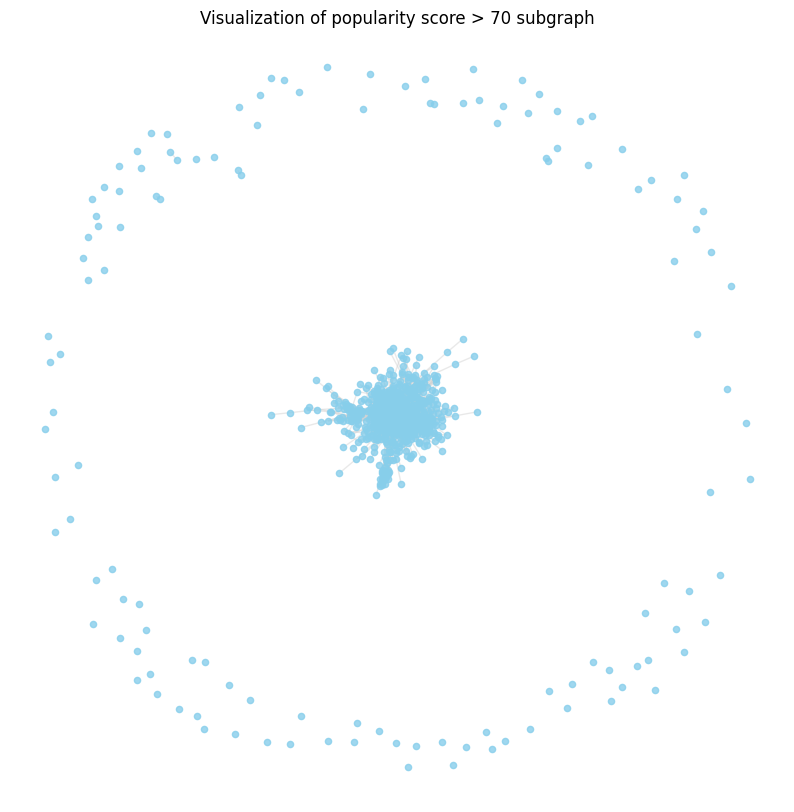

In [673]:
# runtime 3s

# set popularity threshold:
popularity_threshold = 70

# filter nodes based on popularity:
popular_artists = [node for node, data in G.nodes(data=True) if data.get('popularity', 0) > popularity_threshold]
popular70_subgraph = G.subgraph(popular_artists).copy()

# visualize or analyze the popular subgraph as needed:
print(f"Number of nodes in popular artists subgraph: {popular70_subgraph.number_of_nodes()}")
print(f"Number of edges in popular artists subgraph: {popular70_subgraph.number_of_edges()}")

visualize_genre_subgraph(popular70_subgraph, 'popularity score > 70')

Number of nodes in popular artists subgraph: 403
Number of edges in popular artists subgraph: 3123


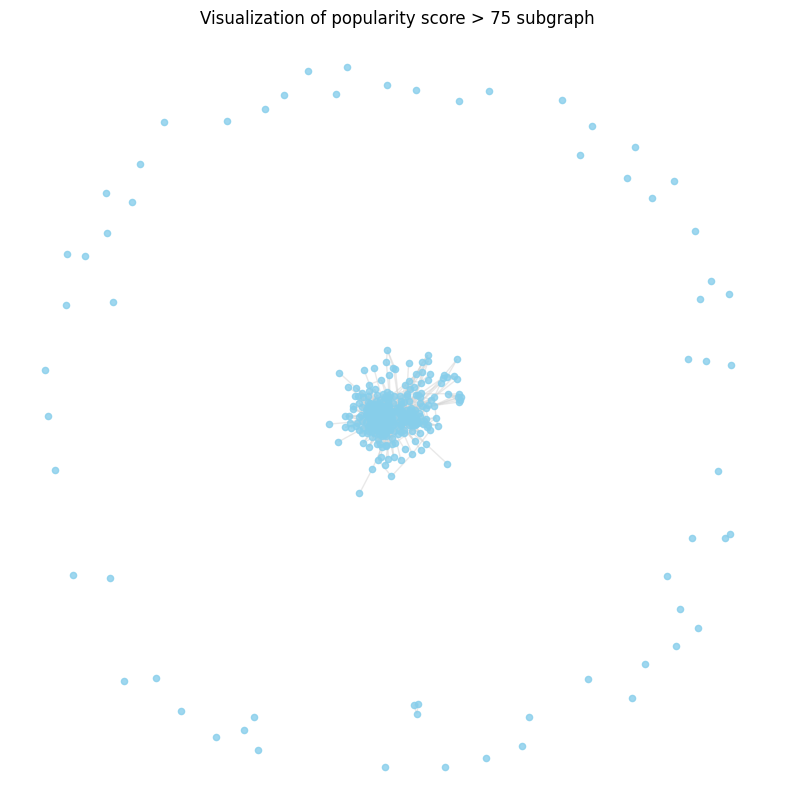

In [674]:
# set popularity threshold:
popularity_threshold = 75

# filter nodes based on popularity:
popular_artists = [node for node, data in G.nodes(data=True) if data.get('popularity', 0) > popularity_threshold]
popular75_subgraph = G.subgraph(popular_artists).copy()

# visualize or analyze the popular subgraph as needed:
print(f"Number of nodes in popular artists subgraph: {popular75_subgraph.number_of_nodes()}")
print(f"Number of edges in popular artists subgraph: {popular75_subgraph.number_of_edges()}")

visualize_genre_subgraph(popular75_subgraph, 'popularity score > 75')

In [675]:
# calculate degree threshold (top 5%):
degrees = [degree for node, degree in G.degree()]
degree_threshold = np.percentile(degrees, 95)  # 95th percentile

# select nodes w/ degree above threshold:
high_degree_nodes = [node for node, degree in G.degree() if degree > degree_threshold]

# create subgraph w/ only high-degree nodes:
high_degree_subgraph = G.subgraph(high_degree_nodes).copy()

# output # of nodes/edges:
print(f"Number of nodes in high-degree subgraph: {high_degree_subgraph.number_of_nodes()}")
print(f"Number of edges in high-degree subgraph: {high_degree_subgraph.number_of_edges()}")


Number of nodes in high-degree subgraph: 7533
Number of edges in high-degree subgraph: 67160


***Applying the Louvain algorithm for community detection:***

This method is great for detecting meaningful communities within large networks very efficiently.

In [678]:
# reload data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes_df = pd.read_csv(nodes_path)
edges_df = pd.read_csv(edges_path)

print(nodes_df.head())
print(edges_df.head())

nodes_df['genres'] = nodes_df['genres'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else [])


# filter out nodes w/ empty 'chart_hits':
chart_topping_nodes = nodes_df[nodes_df['chart_hits'].apply(lambda x: len(x) > 0)]['spotify_id'].tolist()

print(f"\nNumber of chart-topping nodes: {len(chart_topping_nodes)}")

G = nx.Graph()

# add nodes:
for _, row in nodes_df.iterrows():
    G.add_node(row['spotify_id'], **row.to_dict())

# add edges:
for _, row in edges_df.iterrows():
    G.add_edge(row['id_0'], row['id_1'])

# create subgraph of chart-topping artists:
subgraph = G.subgraph(chart_topping_nodes).copy()

# count:
subgraph_node_count = subgraph.number_of_nodes()
subgraph_edge_count = subgraph.number_of_edges()

print(f"Node count: {subgraph_node_count}")
print(f"Edge count: {subgraph_edge_count}")

# Louvain method for community detection:
if subgraph_node_count > 0:
    partition = community_louvain.best_partition(subgraph)
    num_communities = len(set(partition.values()))
    print(f"\nNumber of communities detected: {num_communities}")

    # group nodes by community:
    community_groups = defaultdict(list)
    for node, community_id in partition.items():
        community_groups[community_id].append(node)

    # display sample community groups:
    print("\nSample community groups:")
    sample_communities = dict(list(community_groups.items())[:5])
    print(sample_communities)

               spotify_id                name  followers  popularity  \
0  48WvrUGoijadXXCsGocwM4           Byklubben     1738.0          24   
1  4lDiJcOJ2GLCK6p9q5BgfK            Kontra K  1999676.0          72   
2  652XIvIBNGg3C0KIGEJWit               Maxim    34596.0          36   
3  3dXC1YPbnQPsfHPVkm1ipj  Christopher Martin   249233.0          52   
4  74terC9ol9zMo8rfzhSOiG       Jakob Hellman    21193.0          39   

                                              genres  \
0                     ['nordic house', 'russelater']   
1             ['christlicher rap', 'german hip hop']   
2                                                 []   
3  ['dancehall', 'lovers rock', 'modern reggae', ...   
4  ['classic swedish pop', 'norrbotten indie', 's...   

                                          chart_hits  
0                                         ['no (3)']  
1  ['at (44)', 'de (111)', 'lu (22)', 'ch (31)', ...  
2                                         ['de (1)']  
3         

Let's visualize the top 10 communities color-coded:

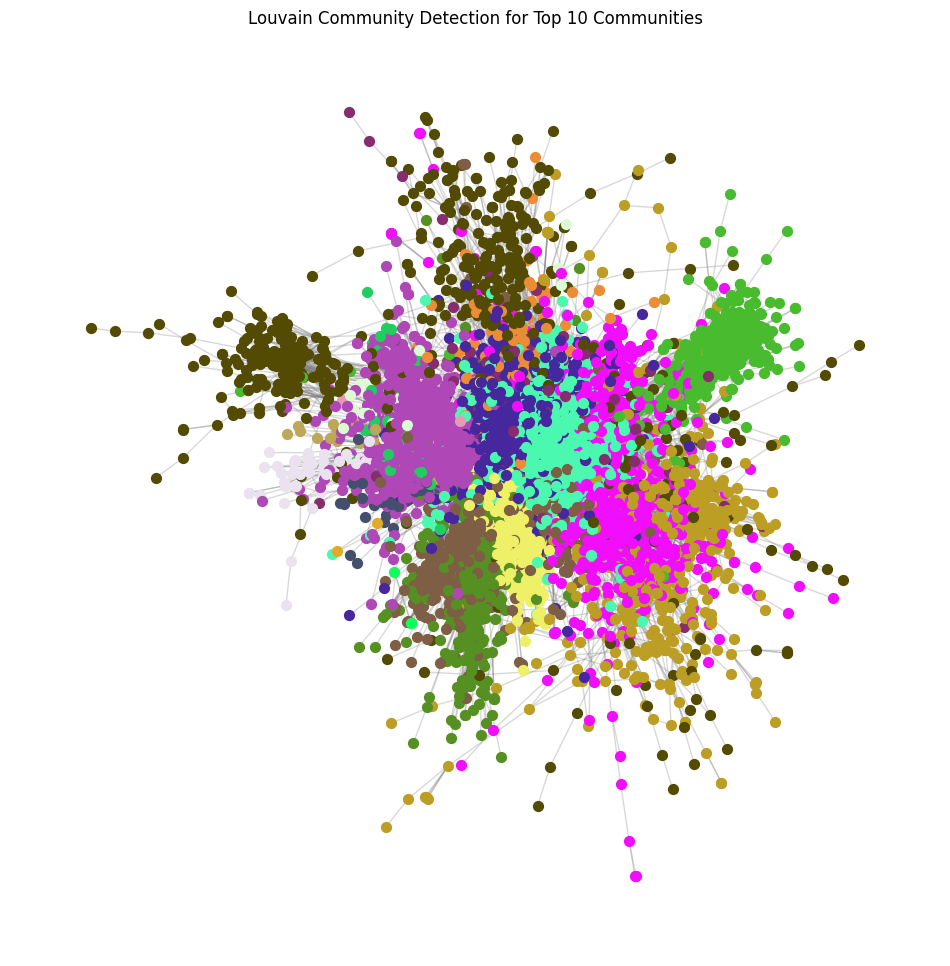

In [679]:
# choose top 10 communities based on size:
top_10_communities = sorted(community_groups.items(), key=lambda x: len(x[1]), reverse=True)[:10]

# create graph w/ only nodes from top 10 communities:
top_10_nodes = [node for community_id, members in top_10_communities for node in members]
top_10_subgraph = G.subgraph(top_10_nodes).copy()

# apply Louvain partitioning on top 10 subgraph:
top_10_partition = community_louvain.best_partition(top_10_subgraph)

# generate colors for each community:
unique_communities = list(set(top_10_partition.values()))
community_colors = {community_id: (random.random(), random.random(), random.random()) for community_id in unique_communities}

# positioning:
pos = nx.spring_layout(top_10_subgraph, seed=42)

# plot graph w/ communities colored:
plt.figure(figsize=(12, 12))
for node, community_id in top_10_partition.items():
    nx.draw_networkx_nodes(top_10_subgraph, pos, nodelist=[node], node_size=50, node_color=[community_colors[community_id]])

nx.draw_networkx_edges(top_10_subgraph, pos, alpha=0.3, edge_color="gray")
plt.title("Louvain Community Detection for Top 10 Communities")
plt.axis("off")
plt.show()

Now let's analyze the communities. Who's in them? What genres are they characterized by? Do they hold small-world properties? We'll have to compare them to the random G(n, p) graphs and regular lattices of the same sizes and densities.

Artists in Community 0:
- Robert Falcon
- Tyron Hapi
- Lisa Ajax
- Olivia O'Brien
- Sam Martin
- ItaloBrothers
- Van Echelpoel
- Hudson Thames
- HUGEL
- MØ
- Argy
- morgxn
- Brenda Lee
- Gotye
- Matrix & Futurebound
- The Boxer Rebellion
- Don Diablo
- Boye & Sigvardt
- Katy Perry
- Rizzle Kicks
- Alison Wonderland
- Lars Winnerbäck
- Wingtip
- Wilkinson
- Emilie Adams
- Kleerup
- Guru Josh
- waterbaby
- Mark Mothersbaugh
- Macklemore
- Björk
- Grimes
- The Doobie Brothers
- BANNERS
- Kiiara
- Rak-Su
- MEMBA
- De Danske Hyrder
- The Wanted
- NCT U
- Plan B
- Avicii
- Calum Scott
- Coucheron
- Curtis Waters
- A Great Big World
- Alex Schulz
- Leslie Odom Jr.
- Morandi
- MATTN
- Ruel
- GATTÜSO
- Vario Volinski
- Purple Disco Machine
- LCAW
- Reem
- Sval
- Maisie Peters
- Carmouflage Rose
- Thelma Plum
- Rowen Reecks
- Faruk Sabanci
- Sebastien
- Billie
- M-22
- Phillip Phillips
- Billie Eilish
- Jens Hult
- Lily & Madeleine
- Lexie Liu
- Krezip
- Faul & Wad
- Shouse
- Pulsedriver
- The N

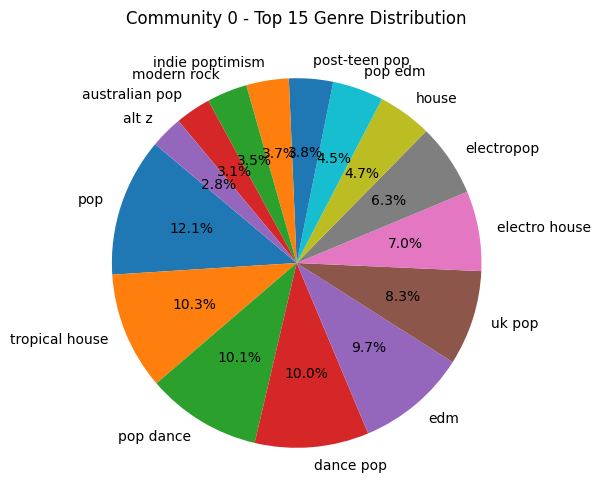

Global clustering coefficient for Community 0: 0.11096234836398332
Diameter for Community 0: 10
Density for Community 0: 0.004800634284793477

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.004544709084459745

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.004005269781664047

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.004916407624484443

Edge count: 9712
Node count: 2012
k = 10
Comparable regular lattice diameter: 202
Comparable regular lattice global clustering: 0.6666666666666666


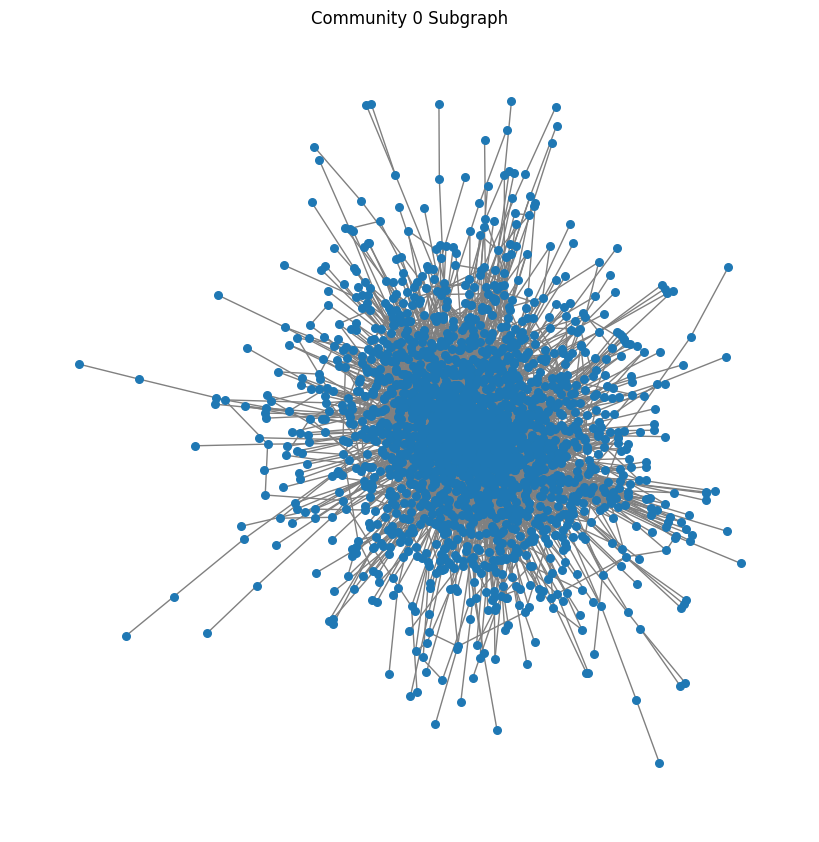

Artists in Community 24:
- Anaju
- Gigolo
- Los Teke Teke
- Rocío Dúrcal
- Wise "the Gold Pen"
- Agoney
- Santa RM
- Lary Over
- Biigo
- Sebastián Cortés
- Yuri
- Lara91k
- David Bisbal
- De La Ghetto
- Foreign Teck
- Jon Z
- Angela Leiva
- WOS
- Alejandra Guzman
- Gotay "El Autentiko"
- Duki
- vf7
- Clasifica2
- Pinkfong
- La Arrolladora Banda El Limón De Rene Camacho
- Jesse & Joy
- Danny Yash
- Sonido Caracol
- Gatillero 23
- Omar Montes
- Don Patricio
- Aventura
- Marbelle
- Jorge Villamizar
- Dímelo Flow
- Mozart La Para
- Aitana
- Nobeat
- Jaycob Duque
- Paris Boy
- Vetusta Morla
- Héctor Lavoe
- Pepe : Vizio
- Zahara
- Ximena Sariñana
- Juan Magán
- Raulin Rodriguez
- Alex Badilla
- Numa
- Sayian Jimmy
- Polo Gonzalez
- Gente De Zona
- Alfredo Olivas
- Yung Beef
- AX 13
- Samantha
- La Ross Maria
- Edurne
- Eddy Herrera
- Juanes
- Yago Roche
- Cali Y El Dandee
- Ryan Castro
- KAVVO
- Ghetto
- La La Love You
- Akim
- Luis R Conriquez
- Guaynaa
- Auryn
- Damion Frost
- Yulien Ovie

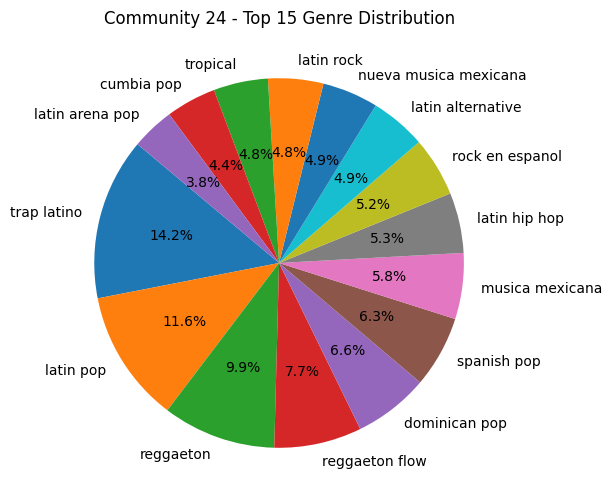

Global clustering coefficient for Community 24: 0.23204026949440953
Diameter for Community 24: 10
Density for Community 24: 0.008881599186294735

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.010286436750654007

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.00888942769077436

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.008779757108489739

Edge count: 11404
Node count: 1603
k = 14
Comparable regular lattice diameter: 115
Comparable regular lattice global clustering: 0.6923076923076923


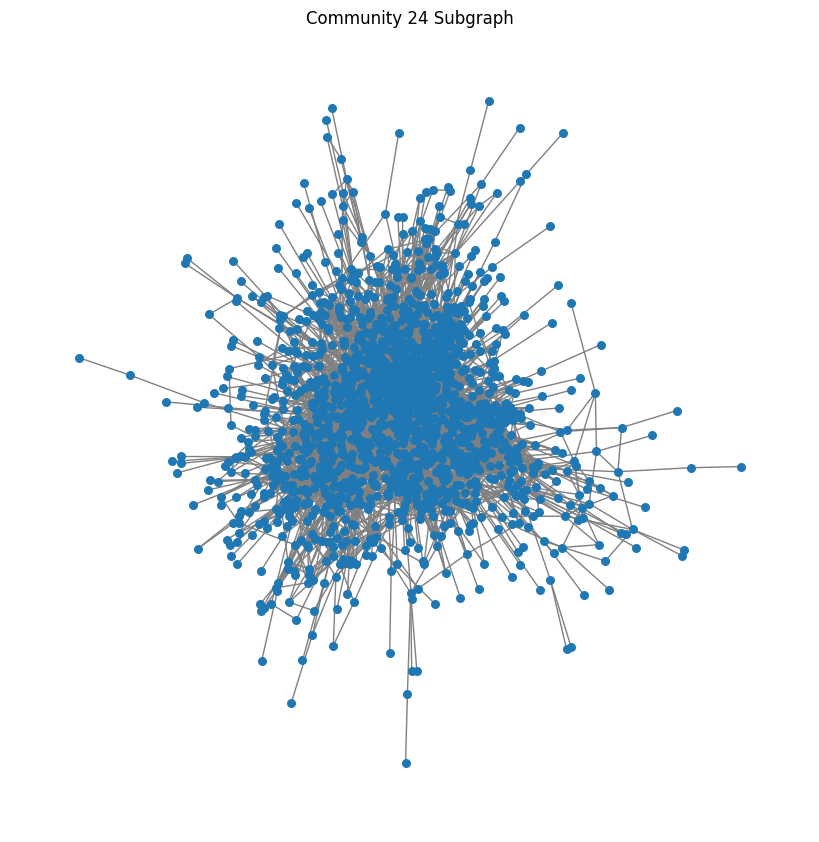

Artists in Community 10:
- Baby Keem
- Smokepurpp
- Kaash Paige
- G.R.L.
- Meek Mill
- Hollywood Undead
- King Von
- Famous Dex
- El Profesor
- Juicy J
- Good Gas
- Young Thug
- BLEU
- TWENTY88
- Kaio Kane
- Pardison Fontaine
- CeeLo Green
- CORPSE
- Prince
- CoCo Lee
- Chris Burton
- Fetty Wap
- Fousheé
- JAY-Z
- Dom Kennedy
- J Boog
- Tropical Florida
- Jesy Nelson
- Trey Songz
- The xx
- Nas
- Genie High
- Chance the Rapper
- Davido
- Ben DJ
- Johnny Cash
- Gloria Estefan
- Redfoo
- Sam Bailey
- Bruno Mars
- Justin Timberlake
- Sheff G
- Internet Money
- Tim McGraw
- Michael Bublé
- The Pussycat Dolls
- Paul Rey
- Big Boi
- CHAI
- Cochise
- BONES
- Mohombi
- Protoje
- 42 Dugg
- Prince Bopp
- Ansel Elgort
- The Smashing Pumpkins
- KATIE
- Bee Gees
- Paul Anka
- Ugly God
- Taylor Swift
- VIC MENSA
- YoungBoy Never Broke Again
- Stevie Nicks
- Chris Brown
- 50 Cent
- Mötley Crüe
- Urban Zakapa
- Pia Mia
- Flipp Dinero
- Jack Johnson
- Rihanna
- Daryl Hall
- Paul Simon
- Mustard
- Frida

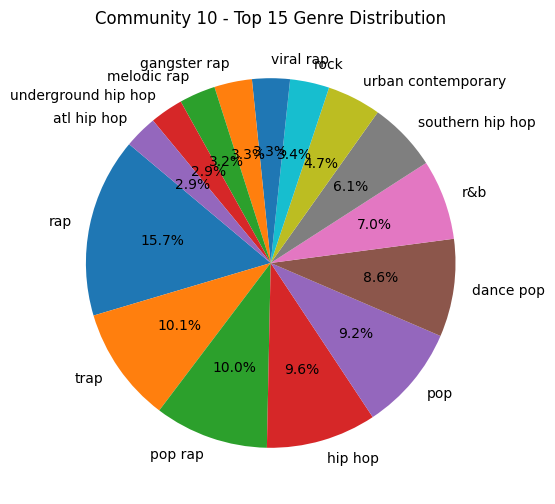

Global clustering coefficient for Community 10: 0.21367105008142862
Diameter for Community 10: 10
Density for Community 10: 0.01395044751370117

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.01285818709679845

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.0134904175002319

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.014028282390801146

Edge count: 7639
Node count: 1047
k = 14
Comparable regular lattice diameter: 75
Comparable regular lattice global clustering: 0.6923076923076923


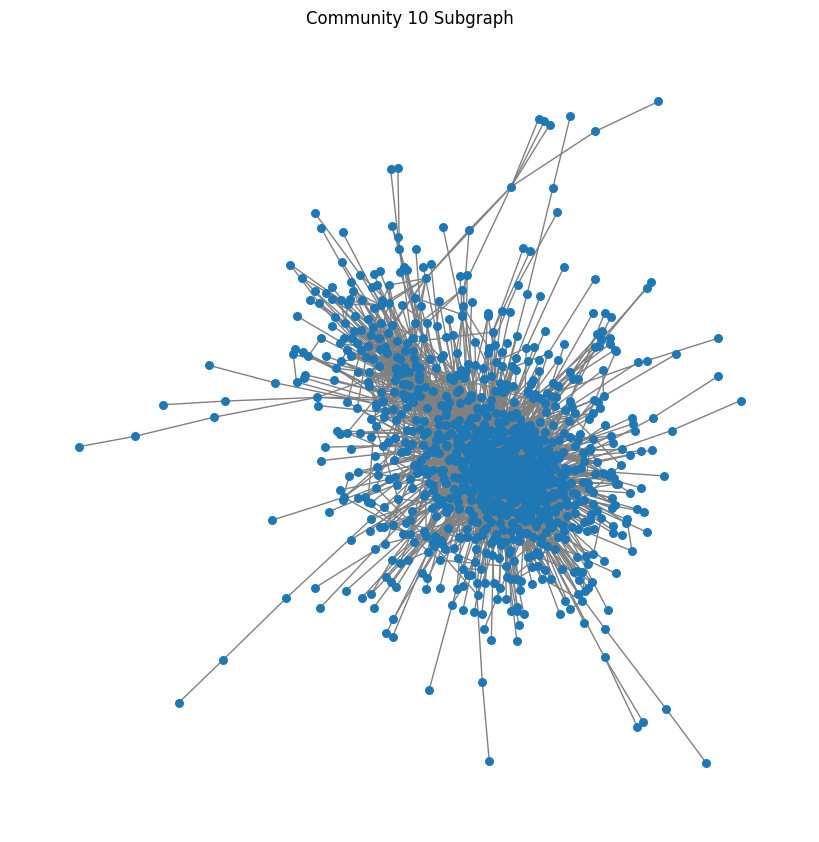

Artists in Community 9:
- Svante Thuresson
- B.Baby
- Lars Vaular
- Emilie Nicolas
- MellemFingaMuzik
- Dúné
- Lamix
- Emil Stabil
- G1ocatore
- Den BB
- Milbo
- Frej Larsson
- Heux
- Sandra Lyng
- ARY
- Håkan Hellström
- Linnea Henriksson
- Maurice
- Rymdpojken
- Sivas
- SamBoii
- HAVAL
- Mad.S 
- L.A.B.
- LBSB
- Leslie Tay
- Meland x Hauken
- Dr. Disco
- Sevz
- Adel
- Beachbraaten
- Stig Brenner
- Oskar Westerlin
- WAHL
- 24SJU
- Blak
- STOR
- AMRO
- Tommy Körberg
- Arif
- Mapei
- LYSA
- Kim Larsen
- Christer Sjögren
- Larsiveli
- Sofia Karlsson
- Søs Fenger
- Malin Christin
- Josef Og Elias
- Ankerstjerne
- Mowgli
- Tobias Rahim
- HON
- Clueless Swede
- Scarlet Pleasure
- Mikael Rickfors
- Moonica Mac
- Aleks
- Movits!
- Daniel Adams-Ray
- Kapten Röd
- Magnus Carlsson
- Benjamin Hav
- Ravi
- September
- Ovall
- Pernilla Andersson
- Lotta Engberg
- Junie
- Lucy Rose
- Bendik
- Nijo
- Fresh-I
- Victor Leksell
- BEK & Moberg
- ADAAM
- Hov1
- Joakim Berg
- ADL
- Fouli
- Karl William
- S

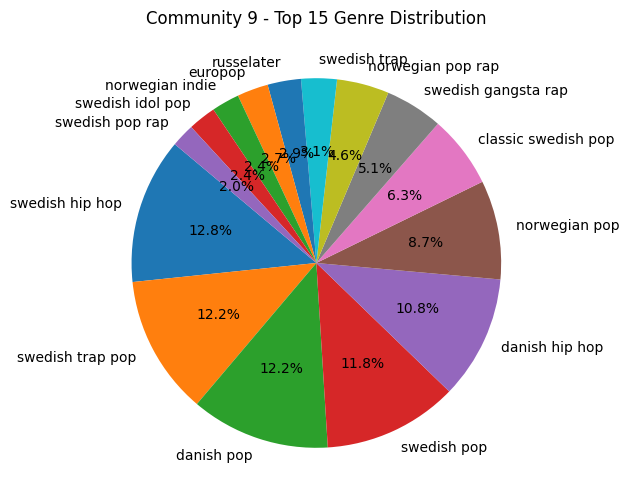

Global clustering coefficient for Community 9: 0.1564295885702657
Diameter for Community 9: 13
Density for Community 9: 0.0065645705494659186

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.007970110330885148

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.0030363953162505634

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.005597402328637195

Edge count: 2253
Node count: 829
k = 6
Comparable regular lattice diameter: 139
Comparable regular lattice global clustering: 0.6


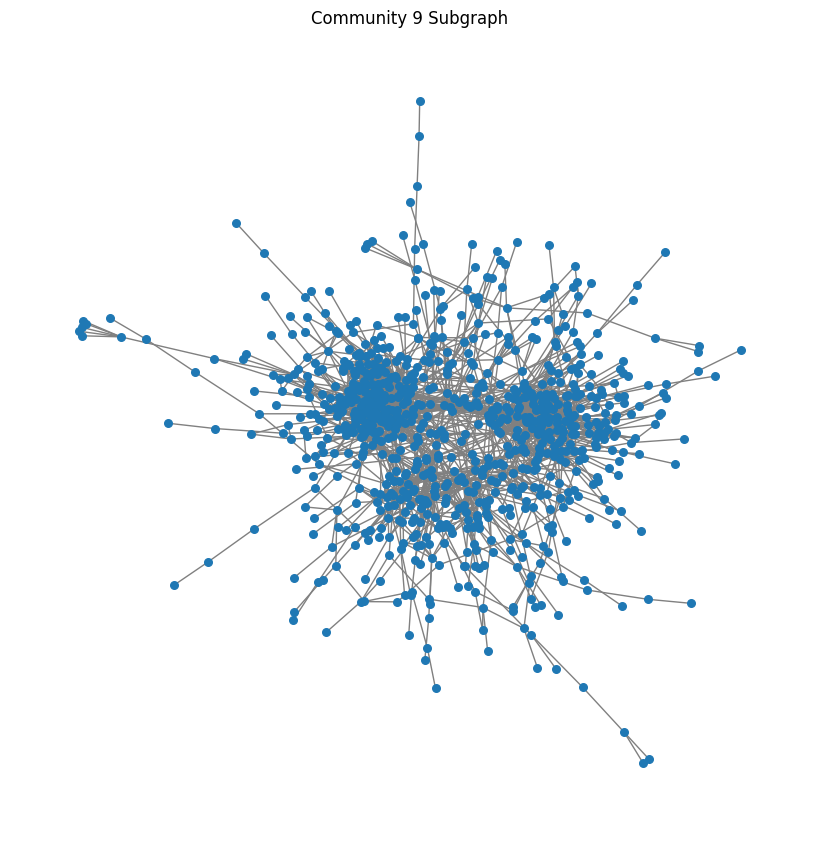

Artists in Community 13:
- DJ Zigão
- Mike11
- Dengaz
- Mariza
- UM44K
- MC Guime
- Vitor e Luan
- ÁTOA
- Camila e Haniel
- Roberta Campos
- MC Ysa
- Papillon
- Thaeme & Thiago
- MC Ingryd
- Mc Jajau
- MC Menor Mr
- Zé Ottávio
- Rashid
- Karol Conká
- Lisandro Cuxi
- Samy y Sandra Sandoval
- Matuê
- Felipe Amorim
- Jota Quest
- Thiaguinho
- WC no Beat
- Bárbara Labres
- Bruno & Barretto
- Recayd Mob
- Xand Avião
- Renno
- Camila Loures
- DreNaz
- Max e Luan
- Mike El Nite
- Bonde R300
- Enzo Rabelo
- Delano
- MC Mari
- Dillaz
- GSON
- Neo Beats
- Mc Pocahontas
- Paula Fernandes
- Zara G
- Dj Dadda
- A Banca Records
- Djonga
- Far From Alaska
- Dj Chris No Beat
- MC Lya
- Ivandro
- Sandy
- Criolo
- Xamã
- Matheus Fernandes
- MD Chefe
- Selminho DJ
- Anderson Neiff
- Yasmine
- Greg Ferreira
- Tribo da Periferia
- Talis e Welinton
- Anderson Rodrigues
- Dj JL O Único
- Day e Lara
- MOBBERS
- DJ TOPO
- Onze:20
- Psirico
- Gusttavo Lima
- Skank
- Denis Graça
- Calema
- Edgar Domingos
- Mc D

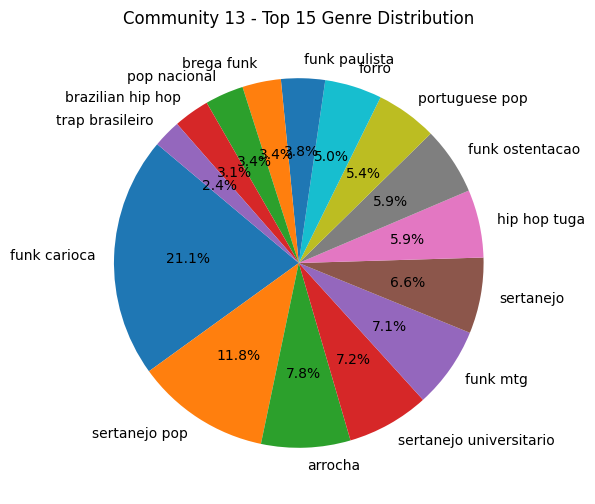

Global clustering coefficient for Community 13: 0.23271125496832928
Diameter for Community 13: 10
Density for Community 13: 0.01990343322515232

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.017594317612094464

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.020361572232926867

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.019253097087141124

Edge count: 4250
Node count: 654
k = 12
Comparable regular lattice diameter: 55
Comparable regular lattice global clustering: 0.6818181818181818


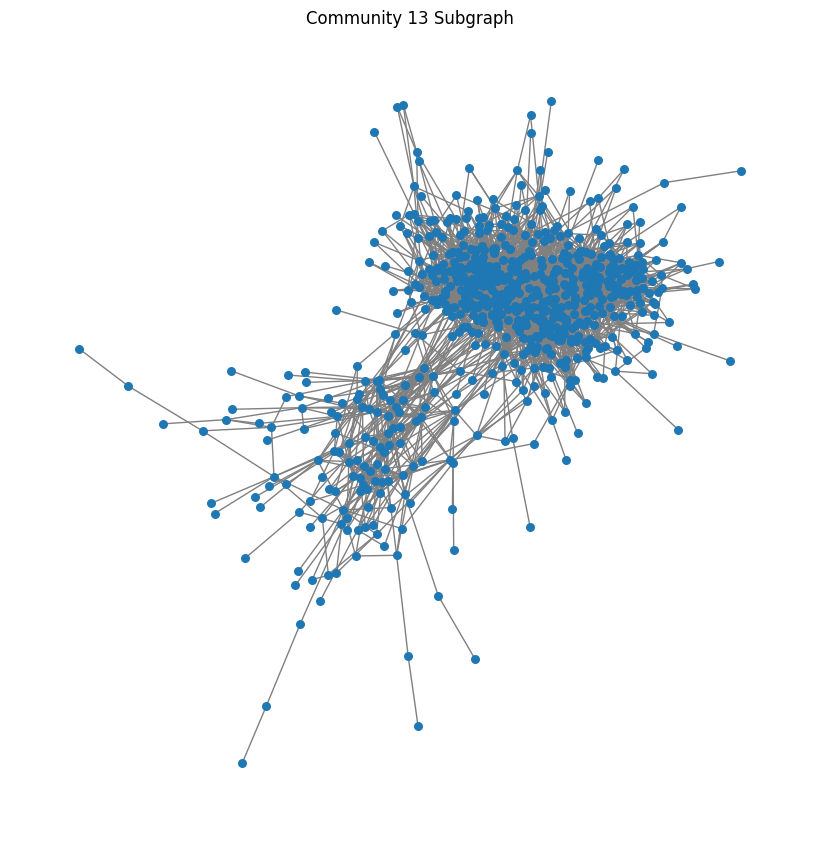

Artists in Community 87:
- Aeh Syndrome
- Rose Sirintip
- Alexa
- Bunga Citra Lestari
- CYANIDE
- Atmosfera
- Moira Dela Torre
- KOB FLAT BOY
- Tanatat Chaiyaat
- Lola Amour
- Tiara Andini
- Thyro Alfaro
- Better Weather
- Juicy Luicy
- Hafiz Hamidun
- Lula
- Ayda Jebat
- Maruli Tampubolon
- Ben Chalatit
- Ismail Izzani
- Talitha.
- Adira Suhaimi
- Dane Amar
- Juan Caoile
- SAMBLACK
- Awesome City Club
- Rendy Pandugo
- 60Miles
- NaNa
- Adera
- Pondering
- WANYAi
- Jaz
- Grady Guan
- ROOFTOP
- Judika
- Heyo
- Leanne & Naara
- Usop
- Boy Peacemaker
- Ariff Bahran
- theBOYKOR
- Pee Wee Gaskins
- Mahalini
- Sheryl Sheinafia
- Kemal Palevi
- Potato
- ETC.
- Soulvibe
- Jona
- Nik Makino
- MAJA
- Haqiem Rusli
- Peck Palitchoke
- Shakira Jasmine
- Rinni Wulandari
- Ello
- Valentina Ploy
- Yes'sir Days
- Iwa K
- Lorenzo Licitra
- Mirrr
- Soulstice
- Parokya Ni Edgar
- Fymme Bongkot
- Jom
- Nanasheme
- Silly Fools
- MC Einstein
- Musketeers
- Dato' Sri Siti Nurhaliza
- VKL
- Michael Pangilinan


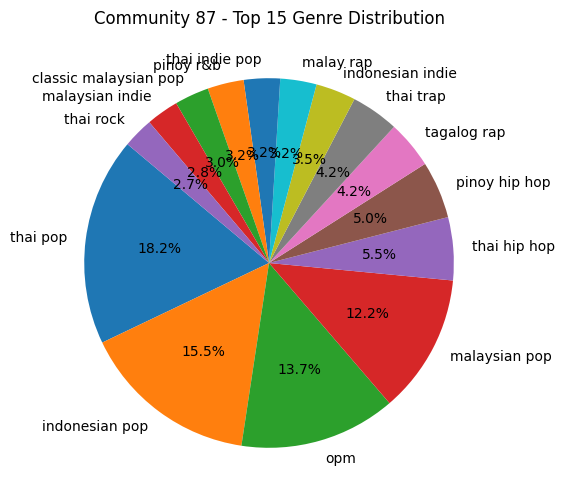

Global clustering coefficient for Community 87: 0.15620449661410798
Diameter for Community 87: 18
Density for Community 87: 0.006534327256298794

Comparable random graph diameter: 10
Comparable random graph global clustering: 0.0027635327635327635

Comparable random graph diameter: 11
Comparable random graph global clustering: 0.0034728970953460747

Comparable random graph diameter: 11
Comparable random graph global clustering: 0.0035373002489359996

Edge count: 1186
Node count: 603
k = 4
Comparable regular lattice diameter: 151
Comparable regular lattice global clustering: 0.5


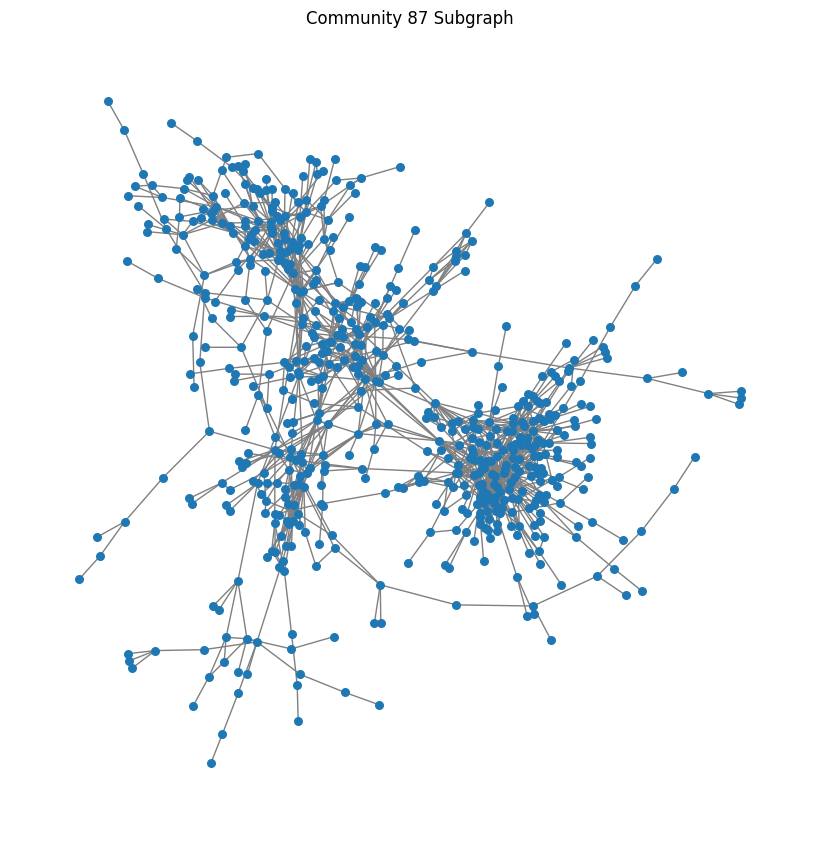

Artists in Community 3:
- Nakor
- Tom Twers
- BRADO
- ELIF
- Ilse DeLange
- Chakuza
- SDP
- Mark Forster
- Lennon & Maisy
- Kraftklub
- Salim Montari
- Favorite
- GRMV
- L'aupaire
- Josi
- INAS
- Nora Istrefi
- WIER
- Canbay & Wolker
- Beginner
- LCone
- Casar
- Haze
- Samy Deluxe
- OG Keemo
- Namika
- Mois
- Gustav
- L Loko
- Kida
- Bilderbuch
- Paula Dalla Corte
- DCS
- Philipp Dittberner
- Bosse
- ARY
- Yvonne Catterfeld
- MC Bilal
- Kaizers Orchestra
- Cap Gold
- Tarek K.I.Z
- MoTrip
- ApoRed
- Die Fantastischen Vier
- GENT
- Will Ferrell
- WILDBWOYS
- Esther Graf
- Ansu
- YONII
- Play69
- Tokio Hotel
- DILOMAN
- t-low
- Stefanie Heinzmann
- Maestro
- Payy
- Romeo Veshaj
- badmómzjay
- C ARMA
- FGUN $HAKI
- Peter Fox
- Montez
- Kasalla
- Tayna
- Rainhard Fendrich
- JORIS
- Nutcase22
- Nizi19
- Maaf
- The Kingdom Choir
- Kollegah
- SXTN
- SANTOS
- Adel Tawil
- Baschi
- GRiNGO
- BHZ
- Electric Callboy
- Dabu Fantastic
- Asche
- Airon
- 187 Strassenbande
- Eagles Of Death Metal
- Sero

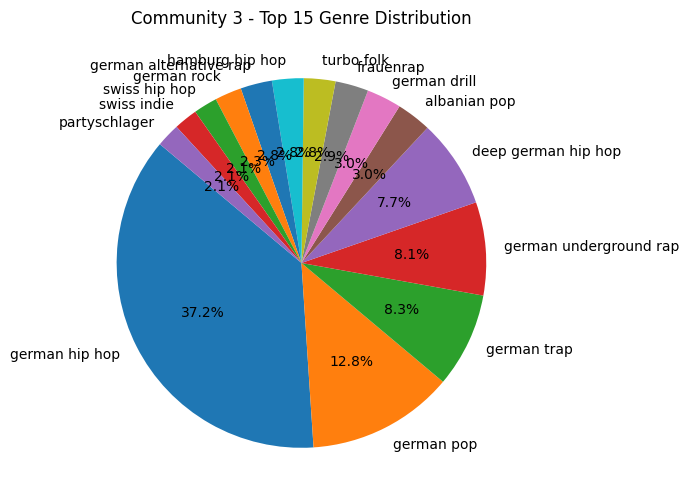

Global clustering coefficient for Community 3: 0.23623479848608625
Diameter for Community 3: 11
Density for Community 3: 0.01647073856376182

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.01569903577919942

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.015924992374572206

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.016969468823598635

Edge count: 2578
Node count: 560
k = 10
Comparable regular lattice diameter: 56
Comparable regular lattice global clustering: 0.6666666666666666


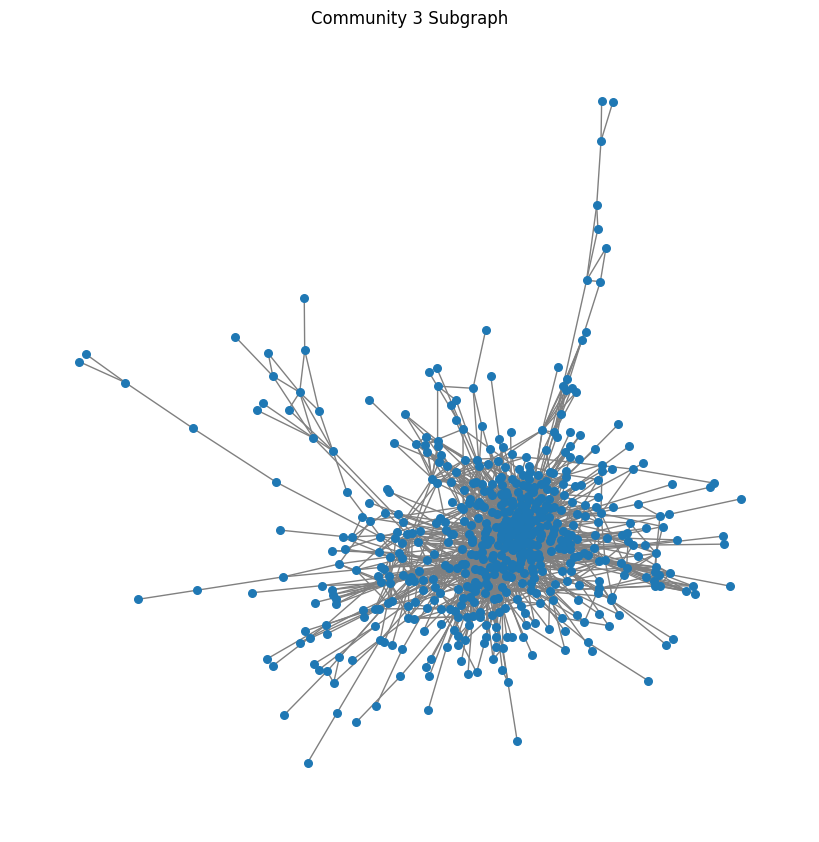

Artists in Community 42:
- DJ Babs
- Suikon Blaz AD
- Marouane
- L.E.J
- Dollypran
- Ziak
- GIMS
- Stormy
- Carmen Soliman
- La Zarra
- Squidji
- JOYCA
- Boulevard des Airs
- Doks
- Benash
- IAM
- Ali Ssamid
- Sadek
- Youness
- Soolking
- SKG
- Mons
- Shotas
- Youssoupha
- Chilla
- Raid
- Bramsito
- Nassi
- Columbine
- Gros Mo
- Mister V
- Mac Tyer
- Selah Sue
- Were-vana
- OBOY
- Hamza
- Joyce Jonathan
- Sasso
- Yanso
- Wejdene
- Idrissi
- Lojay
- L'Algérino
- Josman
- HMZ
- Tibz
- Shy'm
- Abdul Majeed Abdullah
- joysad
- Madame Monsieur
- Black M
- Kery James
- Fnaire
- Souf
- Nahir
- Alkpote
- A2h
- Twinky
- The King's Son
- Vegedream
- 1PLIKÉ140
- Mentissa
- Eljoee
- Mohammad Assaf
- 4Keus
- Sifax
- Sicario
- Niska
- The Dø
- Dadju
- L'Allemand
- N'seven7
- Jeanne Added
- Seven Binks
- Dosseh
- 91 All Stars
- Cheb Djalil
- Klass-A
- Kalash Criminel
- Zikxo
- YG Pablo
- Kanoé
- Adrien Gallo
- Balti
- Mastu
- Kafon
- Qaayel
- L'morphine
- D33pSoul
- Lorenzo
- M. Pokora
- ISSAM
- 7liw

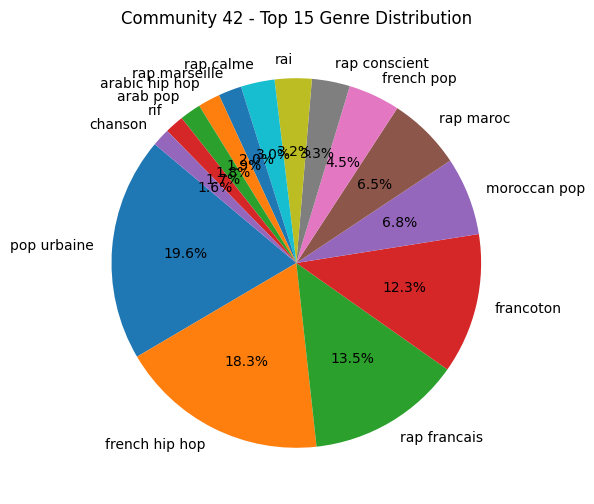

Global clustering coefficient for Community 42: 0.2493366911877355
Diameter for Community 42: 10
Density for Community 42: 0.01993994377715308

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.01977566529751019

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.019517619514801167

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.017692023196891907

Edge count: 3121
Node count: 560
k = 12
Comparable regular lattice diameter: 47
Comparable regular lattice global clustering: 0.6818181818181818


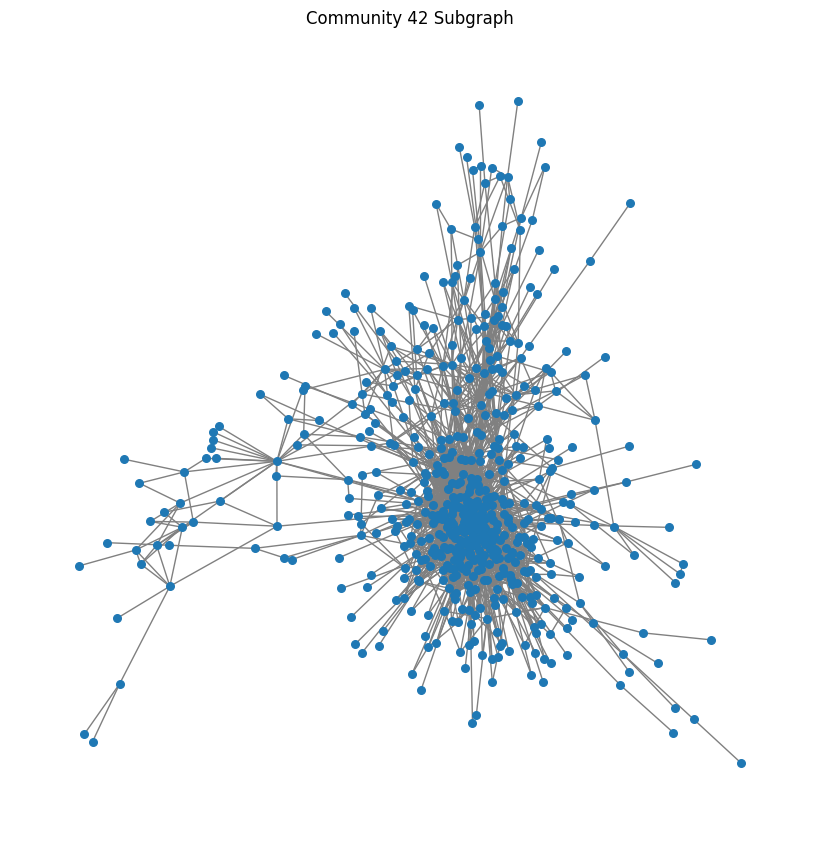

Artists in Community 35:
- Edu Kehäkettunen
- Mikko Pohjola
- Aitoarttu
- Ollie
- Marilii
- Portion Boys
- Jami Faltin
- DJ Kridlokk
- LEHTISET
- Erin
- DJ Oku Luukkainen
- Annika Eklund
- william
- Paleface
- DISCO
- Tuuli
- JVG
- Robin Packalen
- Adi L Hasla
- HM Kongens Gardes Musikkorps
- Sebastian Noto
- Reino Nordin
- Miri
- Raappana
- Hotelli Vantaa
- Mikael Gabriel
- Juulia
- Anssi Kela
- pins.ku
- KOI
- Caater
- Anna Eriksson
- MIRO KANTH
- Avionin Prinssi
- Profeetat
- Antti Ketonen
- Emma Gun
- Haloo Helsinki!
- Kaija Koo
- Paula Koivuniemi
- Knipi
- BYU Vocal Point
- Averagekidluke
- LILBRO
- Nelli Milan
- Ruudolf
- DJ Massimo
- Frederik
- Nelli Matula
- Hätä-Miikka
- Dj Sweedy
- Sara Siipola
- Altis
- JORI SJÖROOS
- Stam1na
- Jemme
- Elize Ryd
- Heviteemu
- Tarja
- Karri Koira
- Eevil Stöö
- Titta
- Teresa Brewer
- Huge L
- Raaka-Aine
- Timo Pieni Huijaus
- Ida Paul
- Jontte Valosaari
- Pepe Willberg
- Pete Parkkonen
- Lord Est
- 65uge
- Cheek
- Pesso
- Costi
- Sana
- ADIV

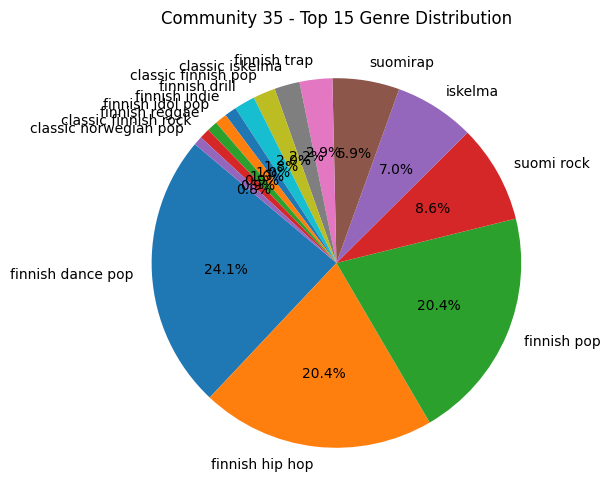

Global clustering coefficient for Community 35: 0.14313027139067525
Diameter for Community 35: 16
Density for Community 35: 0.011987198137910968

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.017448345305488163

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.011419249684555807

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.008480067989270442

Edge count: 1442
Node count: 491
k = 6
Comparable regular lattice diameter: 82
Comparable regular lattice global clustering: 0.6


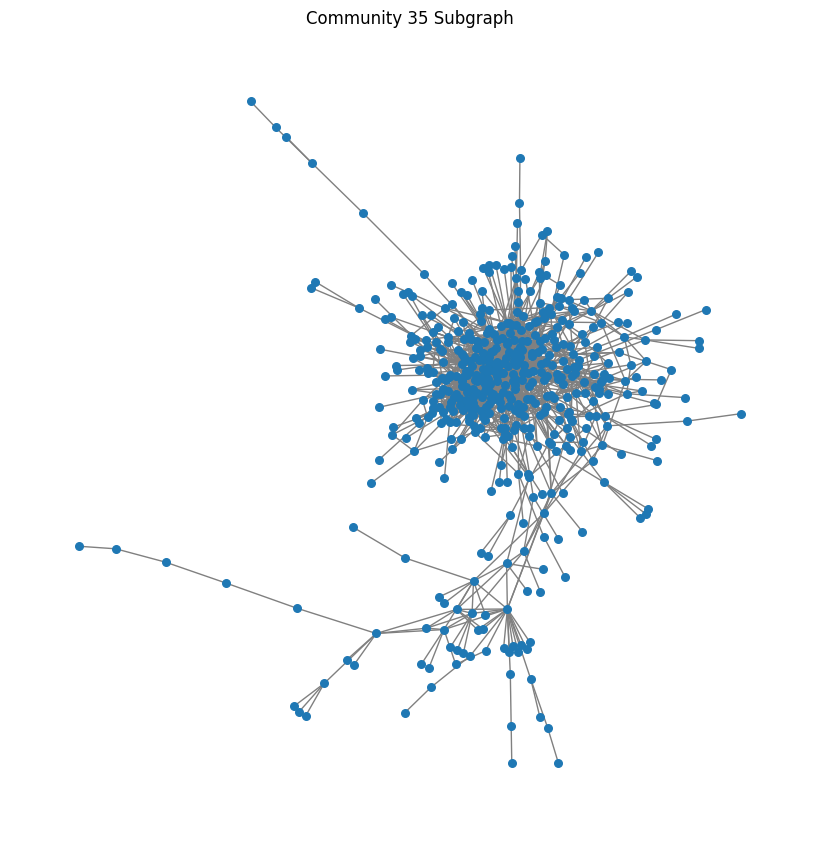

Artists in Community 7:
- Victor Wong
- Masiwei
- Charlene Choi
- Eric Chou
- 黃浩琳
- Phil Chang
- Fish Leong
- 老王樂隊
- Juice Boy
- BOXING樂團
- Beyond
- 玖壹壹
- 魏嘉瑩 Arrow Wei
- G22
- Patrick Brasca
- Anni Hung
- 婁峻碩
- Sandy Lam
- Deserts Chang
- Mixer
- Zhang Zhen Yue
- JUDE
- Christine Fan
- 石山街
- Jess Lee
- Dear Jane
- Subyub Lee
- TRASH
- Rainie Yang
- Novel Core
- Vicky Chen
- Aaron Yan
- Berry Goodman
- 蕭秉治
- 告五人
- 脫拉庫
- Tracy Wang
- CHEHON
- Barry Chen
- Ruco Chan
- Yanki Din
- Ronald Cheng
- Rake
- Gordon
- Yan Ting
- Will Pan
- Joyce Cheng
- Rude-α
- S.H.E
- Valen Hsu
- Supper Moment
- EggPlantEgg
- Ann Bai
- HUSH
- Angela Hui
- Vivian Hsu
- SOPHY
- Ivana Wong
- 黃小琥
- Naiwen Yang
- Bolly
- 瘦子E.SO
- Crispy脆樂團
- Cosmos People
- Cheer Chen
- 193
- Yoga Lin
- SG
- Terence Lam
- Tiger Hu
- Gin Lee
- 劉學甫
- RPG
- Joanna Wang
- Kenny Kwan
- Robynn & Kendy
- 李浩瑋 Howard Lee
- 187INC
- Hello Nico
- ERIKA
- Lulu Huang Lu Zi Yin
- 張粹方
- Kenji Wu
- 吳青峰
- Jocelyn 9.4.0
- 思衛
- Mr.
- Hu Xia
- 張語噥
- S

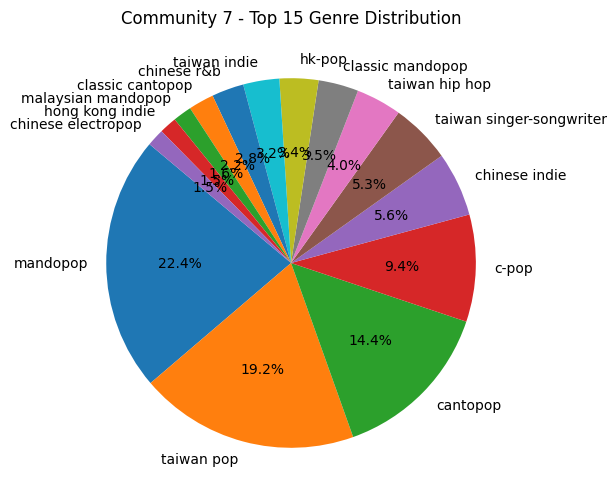

Global clustering coefficient for Community 7: 0.09634387385141532
Diameter for Community 7: 18
Density for Community 7: 0.00808945990958839

Comparable random graph diameter: 10
Comparable random graph global clustering: 0.005839377693682329

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.013237377228700439

Comparable random graph diameter: 11
Comparable random graph global clustering: 0.009047970220536591

Edge count: 884
Node count: 468
k = 4
Comparable regular lattice diameter: 117
Comparable regular lattice global clustering: 0.5


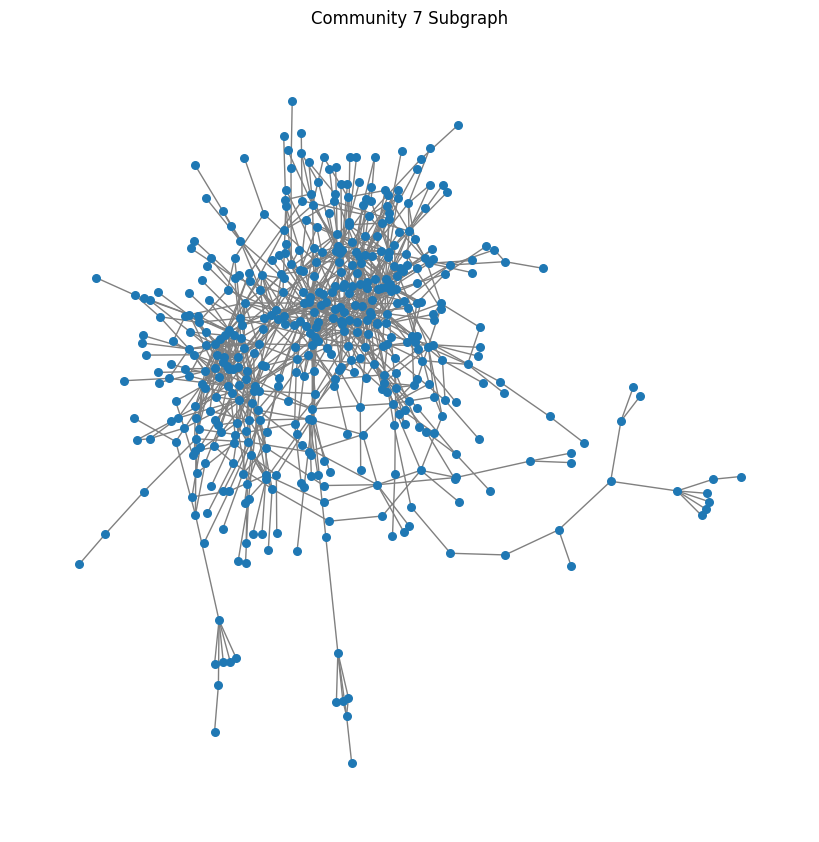

Artists in Community 6:
- Bokke8
- NAVI
- Miss Montreal
- Yes-R
- Blondie
- MEROL
- Djaga Djaga
- Jinho 9
- Waylon
- Hadise
- Team Rush Hour
- Andie Case
- Brent
- Rotjoch United
- BKO
- Zoë-Jadha
- Nielson
- Yung Internet
- De Kraaien
- Bollebof
- I am Aisha
- Boef
- Winne
- Clouseau
- Zack Ink
- $hirak
- The Subs
- Kleine John
- André Hazes Jr.
- The Flexican
- Natte Visstick
- Raynor Bruges
- Dyna
- FeestDJRuud
- Froukje
- Eefje de Visser
- Jonna Fraser
- Zefanio
- Feis
- NAZAAR
- IliassOpDeBeat
- Antoon
- PUBLIC
- Gerson Main
- SBMG
- Metejoor
- LA$$A
- Idaly
- Justice Toch
- Broederliefde
- Giocatori
- Qucee
- Marc Floor
- Maan
- Kevin
- Outsiders
- Spanker
- LouiVos
- MEAU
- Rockywhereyoubeen
- B-Brave
- Narco Polo
- Blow
- Renato S
- Boyce Avenue
- Cameron Bedell
- Tony Tony
- Lange Frans & Baas B
- Jeroen Van Der Boom
- JoeyAK
- Tabitha
- KILATE TESLA
- Karen Damen
- Geechi
- Tur-G
- Nass
- Afro Bros
- KNALLER
- Iliass
- Woody
- Pjotr
- DJ D-Train
- Avedon
- Megan Davies
- Koen

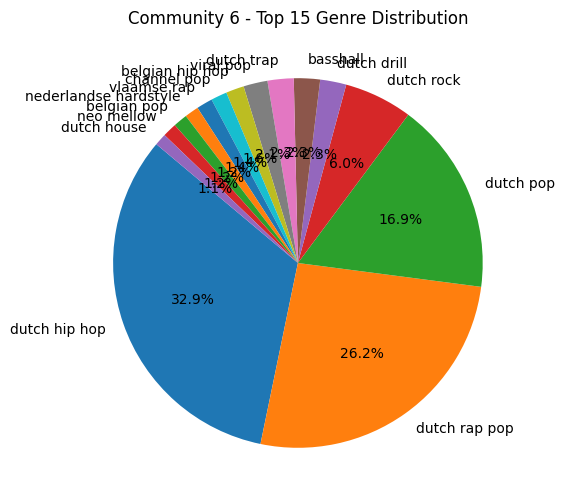

Global clustering coefficient for Community 6: 0.28337267596277765
Diameter for Community 6: 12
Density for Community 6: 0.03437683811515587

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.034075983893777265

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.032740425399368285

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.031077653461945038

Edge count: 3156
Node count: 429
k = 14
Comparable regular lattice diameter: 31
Comparable regular lattice global clustering: 0.6923076923076923


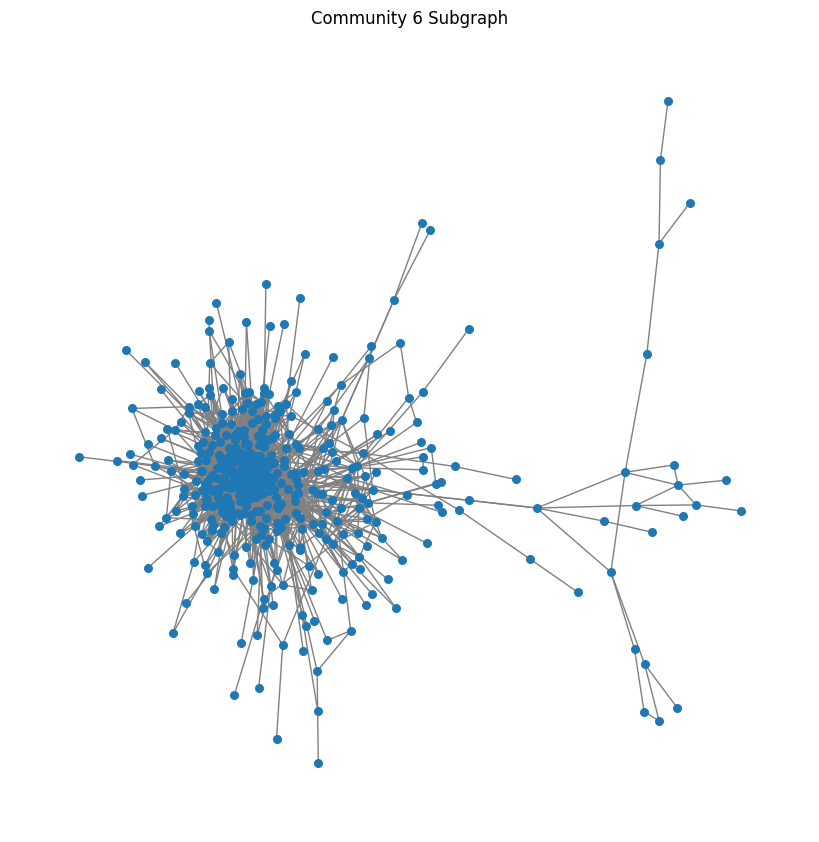

Artists in Community 40:
- Boro Boro
- Giusy & Elettra
- Izi
- Clementino
- Raf
- Trenches Baby
- Alberto Urso
- Nerone
- Giulia Molino
- Mango
- I Cani
- Dat Boi Dee
- Gli Autogol
- Nuove Strade
- Leon Faun
- Rkomi
- Side Baby
- Mecna
- Kasabian
- Dark Polo Gang
- Alfa
- Ivan Granatino
- Domiziana
- Gianni Morandi
- Olly
- Diodato
- Luca Carboni
- J-AX
- Arisa
- Tancredi
- Giovanni Truppi
- PSICOLOGI
- Federico Rossi
- Fiorella Mannoia
- Nek
- Cancun
- ANNA
- Mahmood
- Gemitaiz
- Seiler und Speer
- TY1
- BowLand
- Eugenio In Via Di Gioia
- Lele Blade
- Natalia
- Amedeo Preziosi
- SLF
- Ornella Vanoni
- Motta
- Pyrex
- Tedua
- Willie Peyote
- Cristina D'Avena
- Elio e le Storie Tese
- Thegiornalisti
- Gaia
- Emma Muscat
- MIKA
- Mara Sattei
- Cher
- Shablo
- Baby K
- Vegas Jones
- Negramaro
- La rappresentante di lista
- Two Fingerz
- Mida
- CanovA
- Mondo Marcio
- FSK SATELLITE
- Raige
- Dear Jack
- Biondo
- Giò Sada
- Dani Faiv
- Sapobully
- Livio Cori
- yungest Moonstar
- Samurai Ja

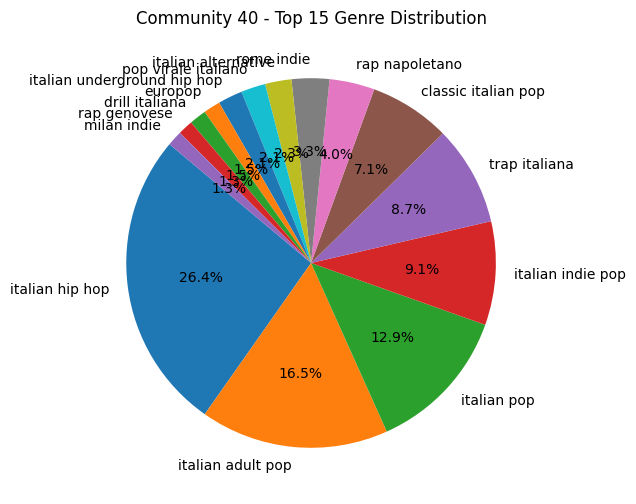

Global clustering coefficient for Community 40: 0.2335602642586319
Diameter for Community 40: 7
Density for Community 40: 0.02784084564707634

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.026358548527569487

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.027742900207781685

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.026012702604588375

Edge count: 2244
Node count: 402
k = 12
Comparable regular lattice diameter: 34
Comparable regular lattice global clustering: 0.6818181818181818


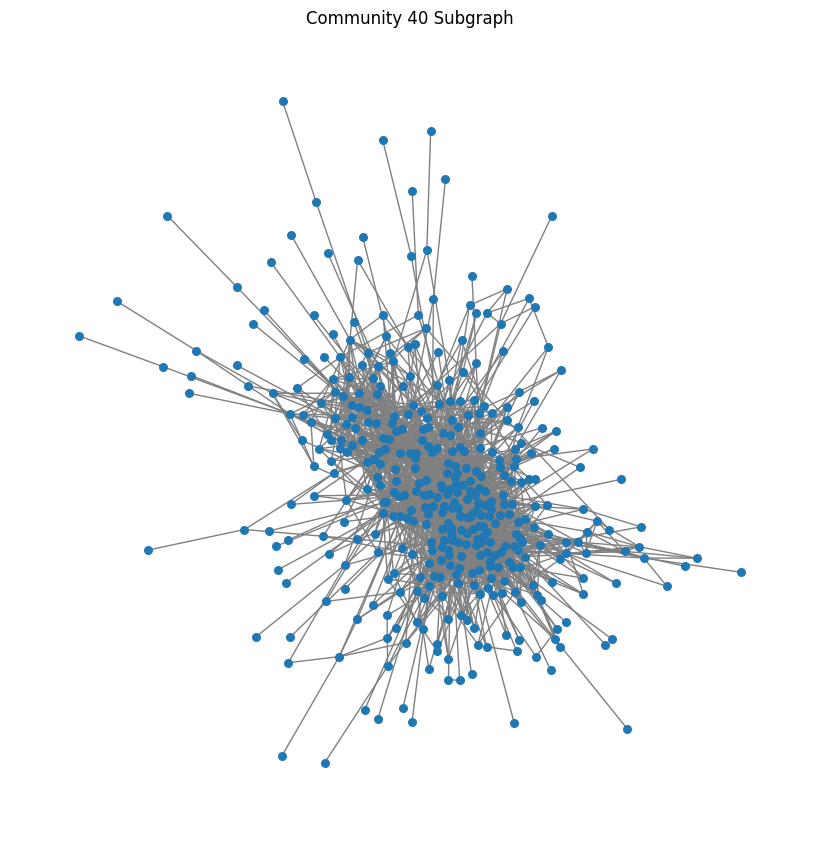

Artists in Community 69:
- Mehdi Mozayine
- İbrahim Tatlıses
- Volga Tamöz
- Ahmet Aslan
- Cem Solo
- TEMPZ72
- Mabel Matiz
- Arem Ozguc
- Simge
- Reckol
- Batuflex
- Güven Yüreyi
- Kamufle
- Ragga Oktay
- Metth
- Ece Ronay
- Aydilge
- Sufle
- Etki
- The Secret Trio
- Monoman
- Madrigal
- İntizar
- Behzat Gerçeker
- Ayla Çelik
- Berksan
- Ozan Doğulu
- Nilüfer
- Diyar Pala
- Yüzyüzeyken Konuşuruz
- Aksan
- Elçin Orçun
- Kezzo
- Aydın Kurtoğlu
- Rope
- Pinhani
- Ozan Çolakoğlu
- Deeperise
- Tuğba Yurt
- Merve Özbey
- Lil Zey
- Musa Eroğlu
- Eftalya Yağcı
- Haluk Levent
- Ebru Yaşar
- Revart
- Murat Dalkılıç
- Serkan Kaya
- Suat Ateşdağlı
- Hande Ünsal
- Ayça Özefe
- Bossy
- Erol Evgin
- Turac Berkay
- Nil Karaibrahimgil
- Ceg
- Selami Şahin
- cakal
- Elanur
- Kenan Doğulu
- Arda Gezer
- Bekom
- Yung Ouzo
- Rota
- Aylin Coşkun
- Burak Bulut
- Massaka
- KADR
- Hakan Peker
- Misha
- Hande Yener
- Merdiven Crew
- Aynur Aydın
- Bilge Nihan
- Sertab Erener
- Sıla
- Cihan Mürtezaoğlu
- Tarkan


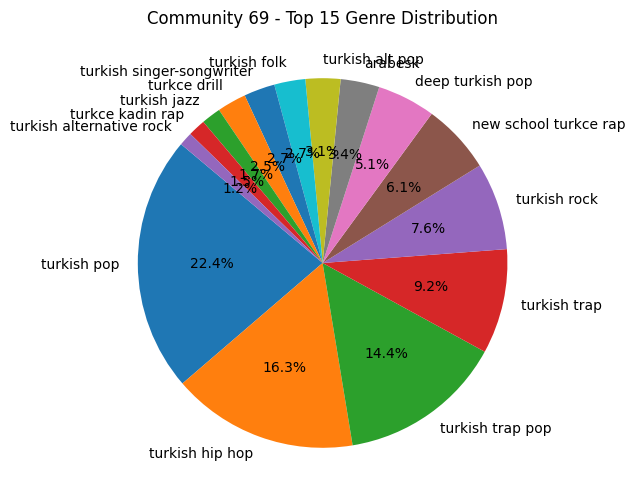

Global clustering coefficient for Community 69: 0.18804802762358125
Diameter for Community 69: 10
Density for Community 69: 0.01701563293639596

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.016858399484394177

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.01911265031265031

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.010725481415136587

Edge count: 1206
Node count: 377
k = 6
Comparable regular lattice diameter: 63
Comparable regular lattice global clustering: 0.6


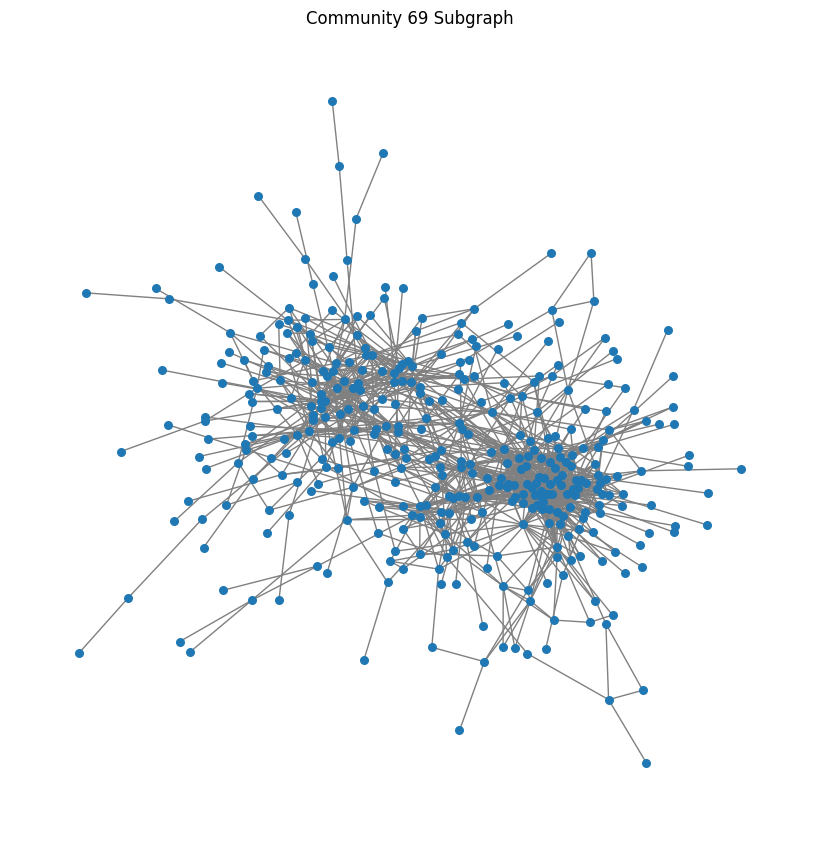

Artists in Community 25:
- northfacegawd
- WOODZ
- PARK JI HOON
- WINNER
- Taichi Mukai
- あれくん
- Mika Nakashima
- KOBUKURO
- SINCE
- Crush
- Sunset Rollercoaster
- Samuray
- WILYWNKA
- G-DRAGON
- TAEYANG
- THE RAMPAGE from EXILE TRIBE
- Chang Kiha
- UVERworld
- Paul Blanco
- MINO
- JOY
- Phum Viphurit
- TK from Ling tosite sigure
- Kumi Koda
- millennium parade
- Thelma Aoyama
- Yiruma
- Ylona Garcia
- Lilas Ikuta
- LEX
- EXO-SC
- BIG Naughty
- ACAね
- MELOH
- m-flo
- Sung Si Kyung
- Yang Da Il
- Gen Hoshino
- Ai Otsuka
- Eito
- KEY
- RIRI
- Vaundy
- Seori
- Jimin
- Nariaki Obukuro
- Mad Clown
- Hwa Sa
- Leellamarz
- AKB48
- milet
- Beast
- DOKYEOM
- YUMDDA
- Jung Dong Ha
- JENNIE
- SOYOU
- Sondia
- HYUKOH
- Jessi
- ayaka
- ROSÉ
- Ayase
- Jeff Bernat
- NAYEON
- Girls' Generation
- Rad Museum
- eAeon
- YUJU
- Yoo Jae Seok
- Geegooin
- Jackson Wang
- BEN
- meenoi
- ONEW
- Tiffany Young
- KIMMUSEUM
- Hyolyn
- Rain
- Sheena Ringo
- Daoko
- PATEKO
- Ohashi Trio
- Creep Hyp
- KANGDANIEL
- STU

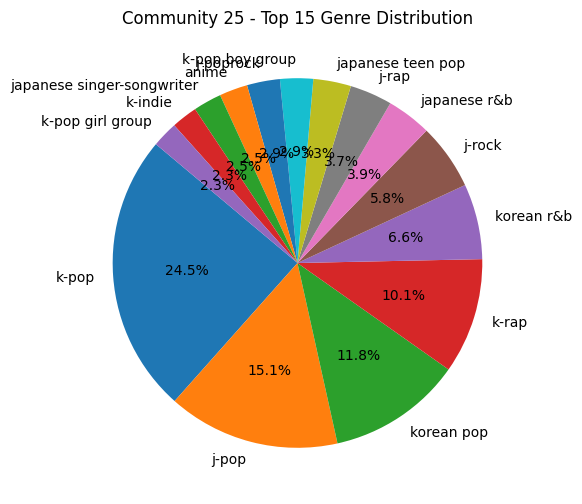

Global clustering coefficient for Community 25: 0.11967826150817394
Diameter for Community 25: 16
Density for Community 25: 0.013261458617080758

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.017790684906587872

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.015099148163664294

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.012431711618703488

Edge count: 925
Node count: 374
k = 4
Comparable regular lattice diameter: 94
Comparable regular lattice global clustering: 0.5


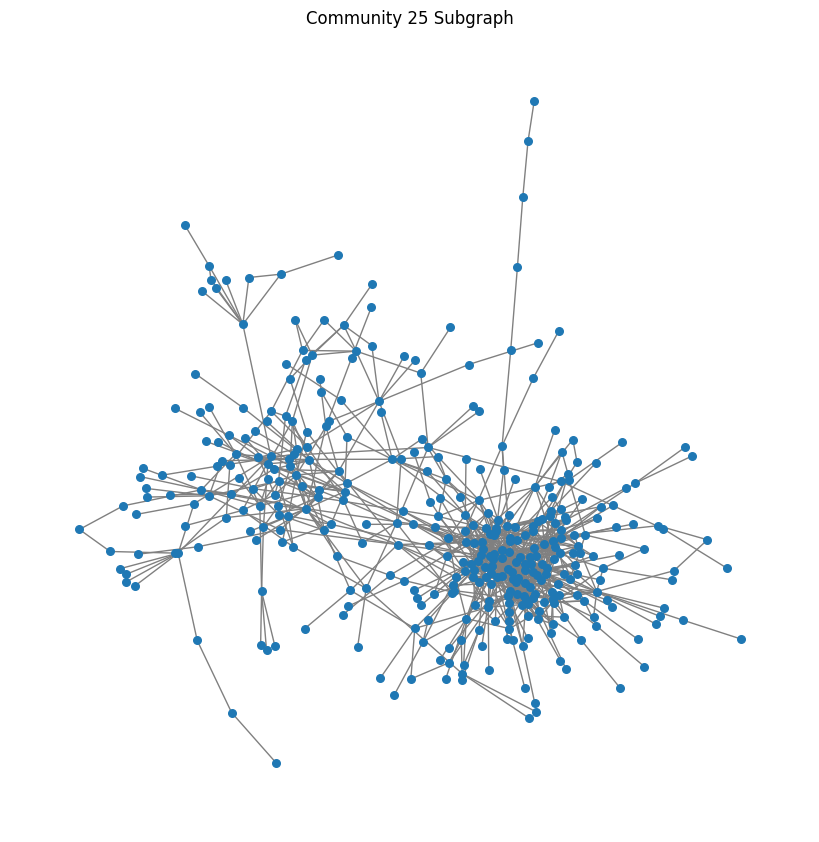

Artists in Community 49:
- Tanishk Bagchi
- Haricharan
- Shortie
- Rangrez Sidhu
- Shaan Rahman
- Rishi Rich
- Shreya Ghoshal
- Jatin-Lalit
- Ninja
- Himesh Reshammiya
- Varinder Brar
- Tony Kakkar
- Amit Trivedi
- Kaam Bhaari
- Javed Ali
- Asim Azhar
- Ikka
- Ammy Virk
- R Nait
- Tanzeel Khan
- Tanveer Evan
- Arko
- Rahul Sipligunj
- Shabab Sabri
- Prem Dhillon
- Lijo George
- Sickflip
- Nitin Mukesh
- Nikhita Gandhi
- Amrita Singh
- Ronja Mariela
- QARAN
- Antara Mitra
- Chandana Dixit
- KK
- Happy Raikoti
- Anirudh Ravichander
- Atif Aslam
- Alka Yagnik
- Vicky
- Sukhwinder Singh
- Romy
- Ved Sharma
- Jakes Bejoy
- Bloodline
- Tarsem Jassar
- Kaka
- Gubbi
- Amruta Fadnavis
- Jassa Dhillon
- Sandesh Datta Naik
- Hesham Abdul Wahab
- Nora Fatehi
- Inder Chahal
- Renuka Panwar
- Sarath Santosh
- Azaan Sami Khan
- Kamal Khaira
- Karan Sehmbi
- Lisa Mishra
- Priya Saraiya
- Javed-Mohsin
- Hemachandra Vedala
- Karan Aujla
- Harrdy Sandhu
- Sunidhi Chauhan
- Sunil Kamath
- Ash King
- Sache

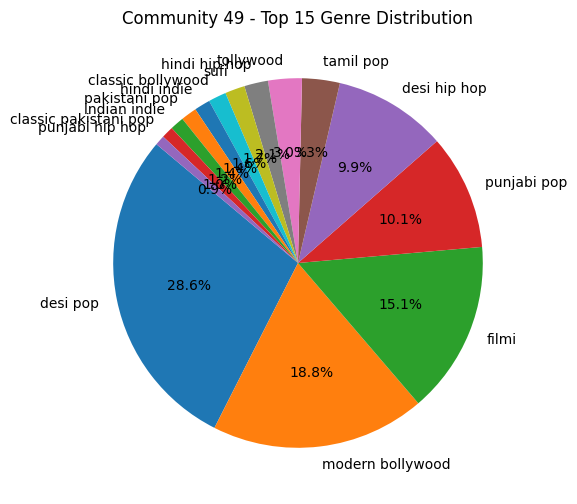

Global clustering coefficient for Community 49: 0.2695454302031239
Diameter for Community 49: 8
Density for Community 49: 0.042336021681638365

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.04517478902881839

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.04498865491171533

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.04374156983282447

Edge count: 1937
Node count: 303
k = 12
Comparable regular lattice diameter: 26
Comparable regular lattice global clustering: 0.6818181818181818


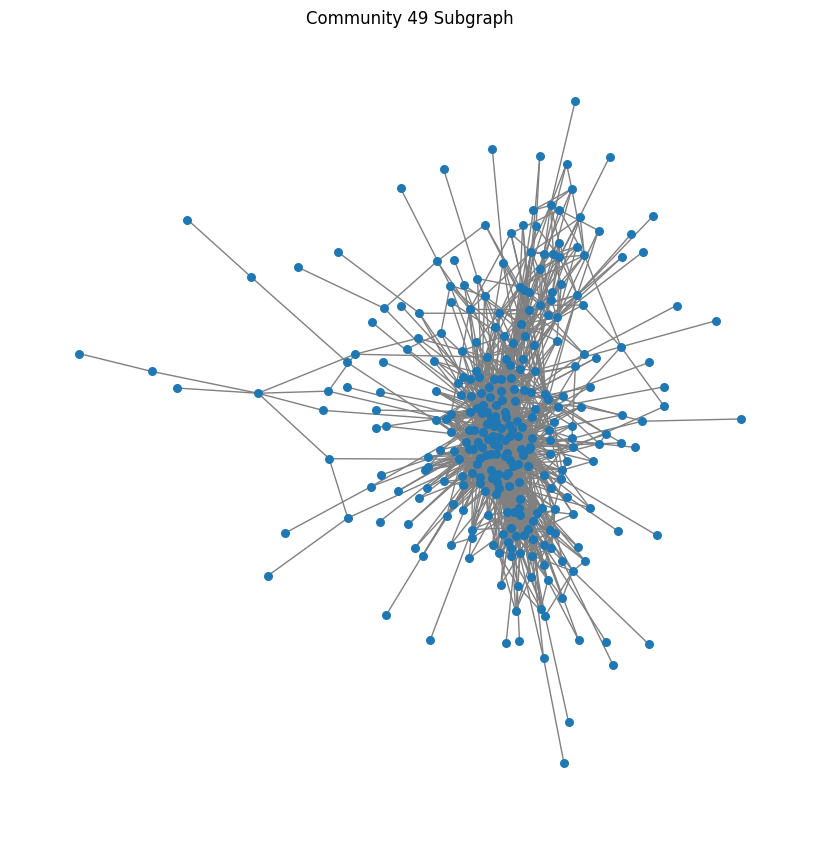

Artists in Community 26:
- Kubi Producent
- Organek
- Ochman
- Bibič
- Лилу45
- Kronkel Dom
- Pezet
- Ralph Kaminski
- Urszula
- KOLA
- MOZGI
- PRO8L3M
- Julia Pośnik
- Męskie Granie Orkiestra
- Kukon
- Major SPZ
- Maciej Musiałowski
- Krzysztof Krawczyk
- Favst
- Lady Pank
- ONUKA
- Deys
- Kuki
- Michał Szczygieł
- Margaret
- Kartky
- Flirtini
- Sobel
- HEAVYWEIGHT
- Julia Rocka
- Mlodyskiny
- Kali
- Kaen
- MamaRika
- Szymi Szyms
- Szczyl
- alyona alyona
- PROBASS ∆ HARDI
- Borixon
- Sarsa
- Fresh N Dope
- SKUTE BOBO
- Popek
- Chivas
- Sobota
- Białas
- WIP Bros
- Igo
- Słoń
- Kamil Bednarek
- esceh
- Dawid Podsiadło
- Young Leosia
- Wiatr
- Artur Rojek
- Pusher
- Łona I Webber
- Kacperczyk
- Buka / Rahim
- Bitamina
- Shellerini
- ZetHa
- CatchUp
- Męskie Granie Orkiestra 2022
- Siles
- Dawid Kwiatkowski
- Fukaj
- TGD
- Sarius
- Jacek Stachursky
- Stanisław Soyka
- Wellboy
- Daria Zawiałow
- DZIARMA
- Solar
- Taco Hemingway
- Remo
- Anna Wyszkoni
- Reto
- Bonus RPK
- Josef Bratan
- Ho

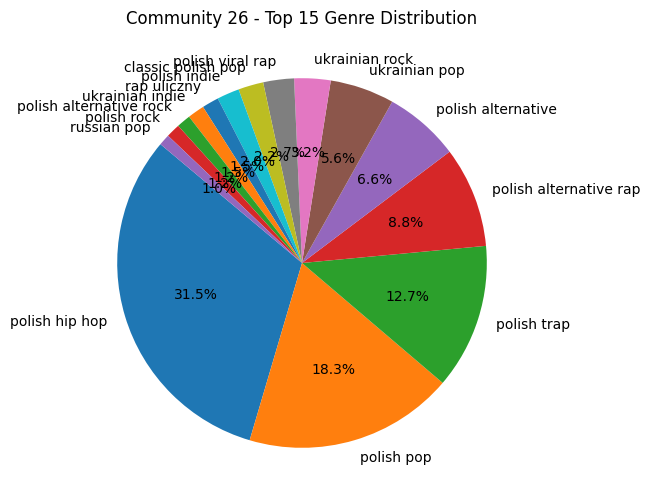

Global clustering coefficient for Community 26: 0.21274459134623813
Diameter for Community 26: 11
Density for Community 26: 0.032229965156794424

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.030605780140577615

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03251114013981661

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.030922692443912776

Edge count: 1332
Node count: 288
k = 10
Comparable regular lattice diameter: 29
Comparable regular lattice global clustering: 0.6666666666666666


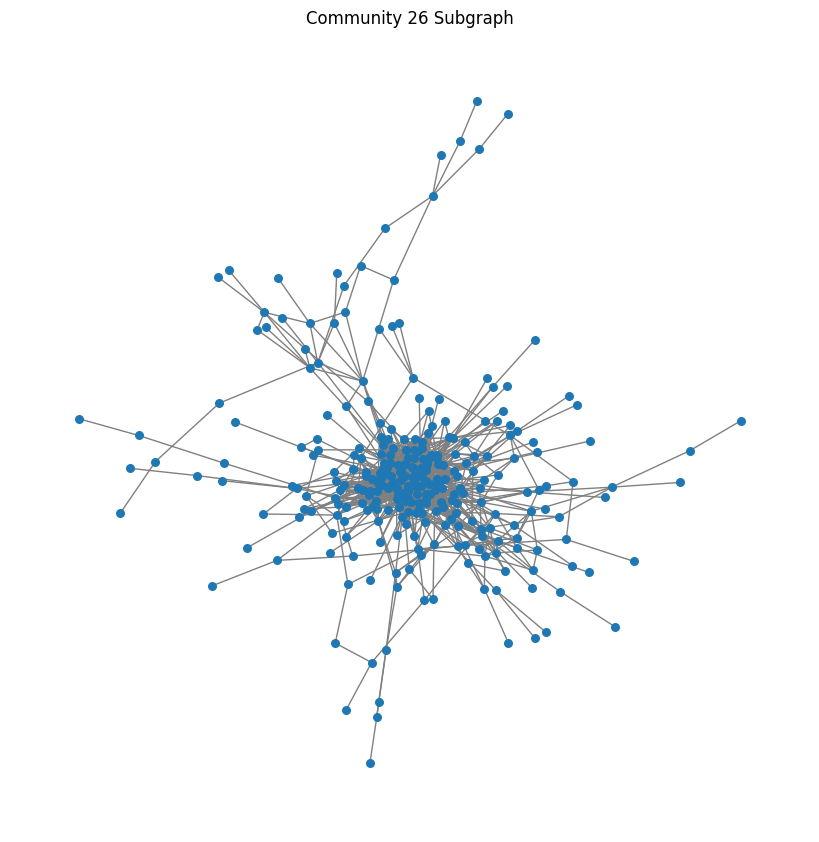

Artists in Community 2:
- Rumen Borilov
- Faydee
- F.O.
- Mario Fresh
- Costel Biju
- Desi Slava
- AlbertNbn
- Kate Linn
- Desanto
- Sofi Marinova
- Ester Peony
- Ahzee
- Florin Salam
- Lino Golden
- Paloma
- SICKOTOY
- Ilian
- Serena
- VenZy
- Dara Ekimova
- Spike
- Rayna
- Bogdan De La Ploiesti
- Gringod
- Plamen & Ivo
- Aria
- Iuliana Beregoi
- Connect-R
- Preslava
- Holy Molly
- Delia
- B.U.G. Mafia
- Emilian
- Pascal Junior
- OG Eastbull
- Tzanca Uraganu
- AMI
- Florian Rus
- Matteo
- DENIS TEOFIKOV
- Andia
- Görkem Sala
- Azteca
- Niku
- DHARIA
- El Nino
- Timebelle
- Tedi Aleksandrova
- Arkanian
- Magi Djanavarova
- PAX Paradise Auxiliary
- Tsvetelina Yaneva
- Raus
- Lorena
- Sasha Lopez
- Alex Botea
- Azis
- Gabriella
- Keen' V
- Maximilian
- Deliric
- SkandaU
- Marko Glass
- Alberto Grasu
- Mihaela Fileva
- Brianna
- Tita
- Angeles
- PAMELA
- LilCagula
- VUNK
- Amuly
- David Ciente
- Pavell & Venci Venc'
- Abi
- Medi
- Berechet
- Emilia
- Speak
- Lidia Buble
- 3 Sud Est
- Boro

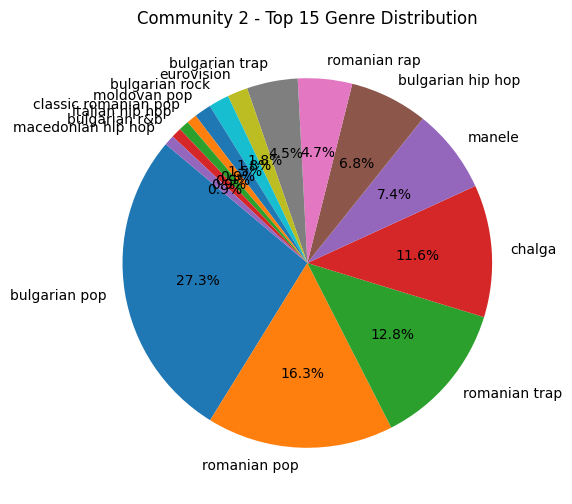

Global clustering coefficient for Community 2: 0.24044156439156222
Diameter for Community 2: 11
Density for Community 2: 0.02287202496067662

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.019417073733620494

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.026632089535315342

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.01943334443334443

Edge count: 887
Node count: 279
k = 6
Comparable regular lattice diameter: 47
Comparable regular lattice global clustering: 0.6


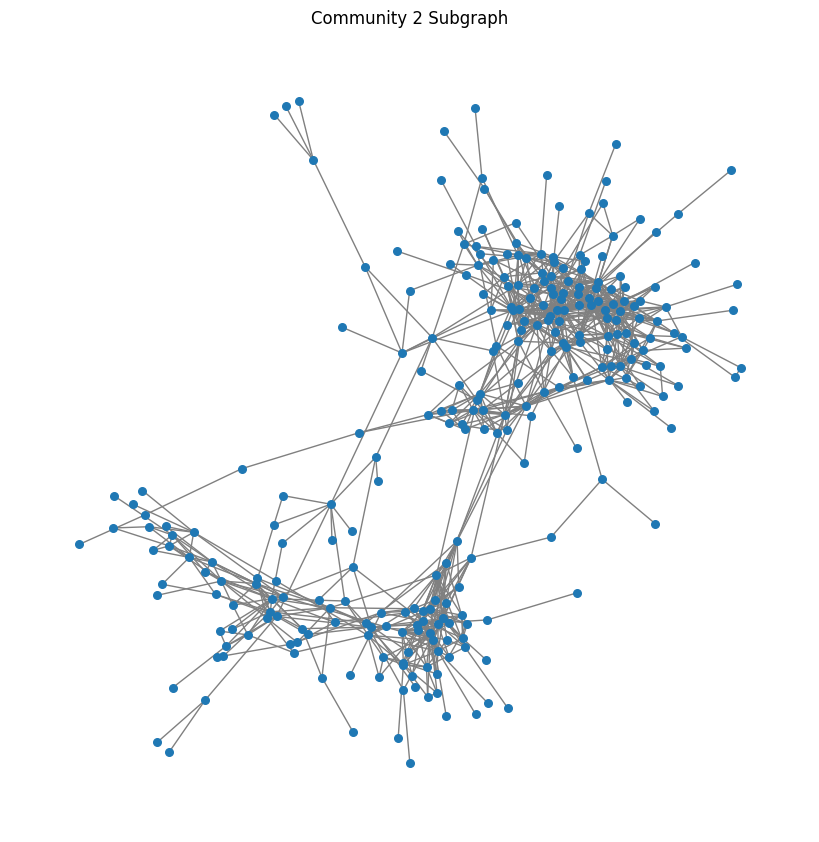

Artists in Community 817:
- Polina Gagarina
- Erika Lundmoen
- Dzharakhov
- Kaito Shoma
- Jah Khalib
- 17 SEVENTEEN
- Сёстры
- просто Лера
- Scally Milano
- S3RL
- The Citizens of Halloween
- Andy Panda
- Lida
- Artik & Asti
- Ivan Dorn
- KURT92
- Zivert
- ATL
- Нервы
- Arthur Pirozhkov
- JONY
- MAX BARSKIH
- PHARAOH
- 10AGE
- ZOLOTO
- Gruppa Skryptonite
- Pharmacist
- Poshlaya Molly
- Timati
- VISXGE
- Telly Grave
- GUMA
- Misha Marvin
- shadowraze
- Милана Хаметова
- MORGENSHTERN
- LOBODA
- Парнишка
- INSTASAMKA
- Kim Dracula
- JILLZAY
- Mari Kraimbrery
- YUNG TRAPPA
- MAYBE BABY
- pyrokinesis
- uglystephan
- Ghostface Playa
- нексюша
- Vitya AK
- КОСМОНАВТОВ НЕТ
- FEDUK
- ELMAN
- Молодой Платон
- quiizzzmeow
- Natan
- Pretty Scream
- MONATIK
- MUKKA
- VELIAL SQUAD
- Grigory Leps
- 25/17
- KSLV Noh
- PALC
- 39
- VisaGangBeatz
- HENSY
- Aarne
- Mumiy Troll
- Tof
- Ghost
- Galibri & Mavik
- Sqwore
- кис-кис
- Kordhell
- Sharlot
- VERBEE
- WEEDMANE
- Gafur
- Boulevard Depo
- Ваня Дмитри

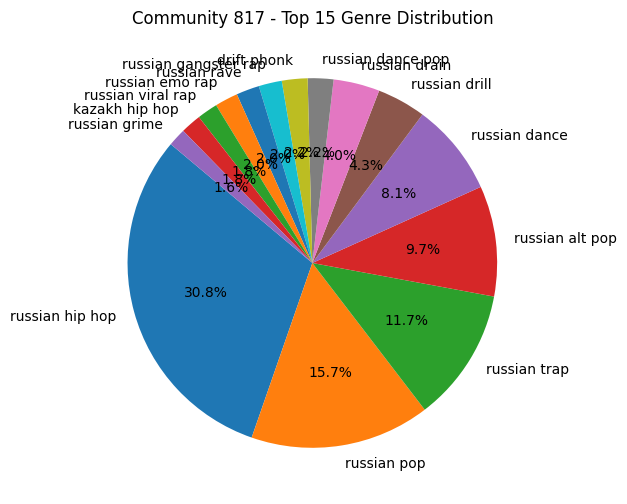

Global clustering coefficient for Community 817: 0.19221098642723747
Diameter for Community 817: 14
Density for Community 817: 0.020864988061645322

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.025558999823705707

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.025676442898665122

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.018832658354717174

Edge count: 769
Node count: 272
k = 6
Comparable regular lattice diameter: 46
Comparable regular lattice global clustering: 0.6


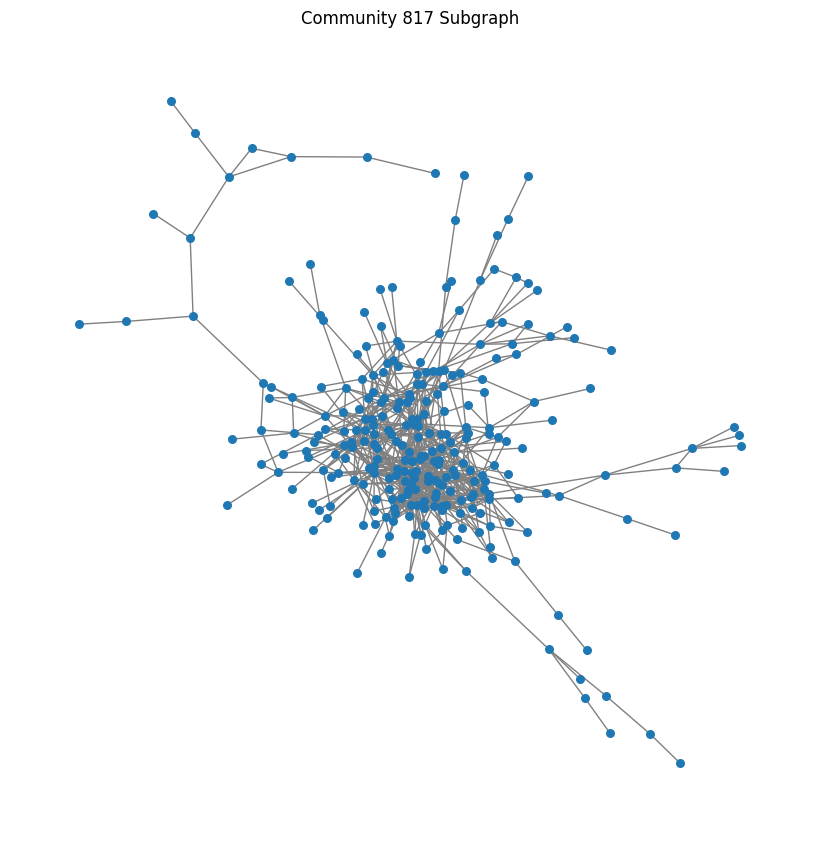

Artists in Community 525:
- Jovani
- IGO
- Mark Les
- Beebilõust
- Sander Mölder
- Anett
- Paulina
- Mart Inc.
- Tigran
- 5MIINUST
- WATEVA
- Prāta Vētra
- Urbanstep
- Andrius Mamontovas
- kaw
- Öed
- Eolika
- INGER
- Free Finga
- Kreisais Krasts
- Remix
- Mad Money
- Radvilas RA
- Stig Rästa
- Ariadne
- Edavārdi
- Bi-2
- Ott Lepland
- Aminata
- Arturs Skutelis un Tvērumi
- Gabrielė Vilkickytė
- Kylok
- Samanta Tina
- Púr Múdd
- Gabrielius Vagelis
- Jessica Shy
- Ewert and the Two Dragons
- ZeBrene
- Dzeguzīte
- An-Marlen
- Baltasis Kiras
- marp$
- Urboo
- Apsi
- Marcara
- Põhja-Tallinn
- Antis
- Metsakutsu
- Būū
- Miks Galvanovskis
- Leon Somov
- Aija Andrejeva
- Karl-Kristjan
- Fakts
- säm
- Ieva Zasimauskaitė
- Karolina Meschino
- Justs Sirmais
- Kaspars Dimiters
- Karl-Erik Taukar
- Dzintars Čīča
- NEXUS
- Angeelia
- KOIT TOOME
- Autobuss debesis
- Pitsa
- Elina Nechayeva
- Astro'n'out
- Rūta Loop
- Kõik Boyz
- pluuto
- Elliot Moss
- gameboy tetris
- kostromin
- Manizha
- Siimi
- L

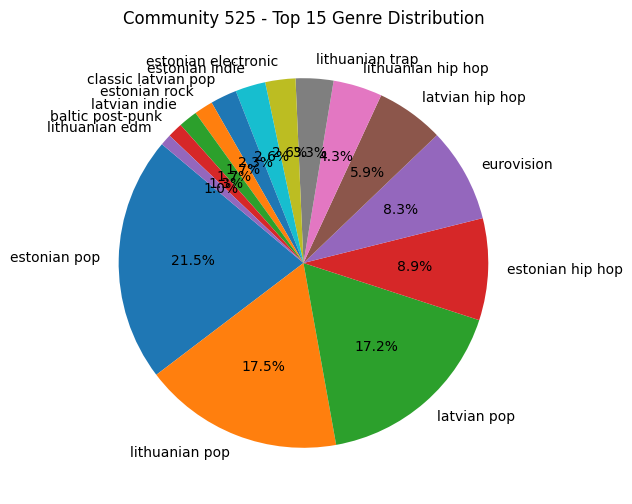

Global clustering coefficient for Community 525: 0.19951232064039212
Diameter for Community 525: 16
Density for Community 525: 0.014160051491096332

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.010546661193212918

Comparable random graph diameter: 10
Comparable random graph global clustering: 0.01567023285084959

Comparable random graph diameter: 11
Comparable random graph global clustering: 0.020903872912801484

Edge count: 396
Node count: 237
k = 4
Comparable regular lattice diameter: 60
Comparable regular lattice global clustering: 0.5


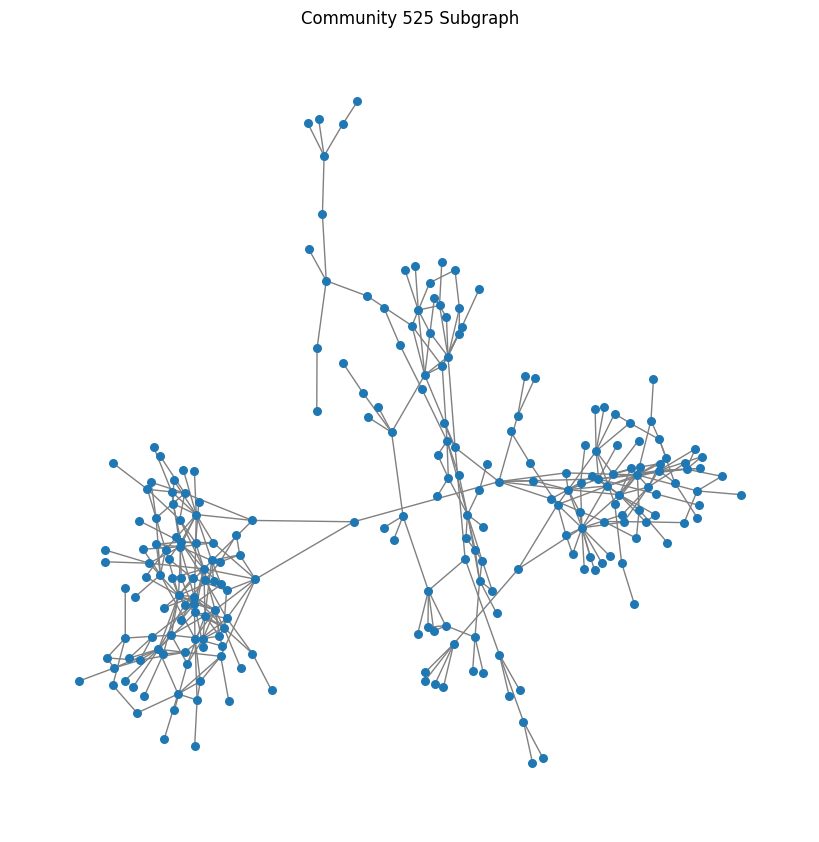

Artists in Community 23:
- Peter Nagy
- Lenny
- Lucie Vondrackova
- Sofian Medjmedj
- Pavol Habera
- Forest Blunt
- Cavalier
- XINDL X
- Mairee
- Hana Zagorová
- Dara Rolins
- Praé
- Michal David
- Saul
- Carter
- Rest
- REDZED
- Ty Nikdy
- P.A.T.
- Yzomandias
- Pil C
- Chinaski
- Abde
- MM
- Amco
- Konex
- Jiří Schelinger
- KHANS
- Igor Kmeto
- H16
- Porsche Boy
- Forgen
- Sergei Barracuda
- Barbora Poláková
- Supa
- DJ Rusty
- Puerto
- Kannabis
- P T K
- Frayer Flexking
- Cocoman
- Kruel
- Totally Nothin
- Boy Wonder
- Luca Brassi10x
- Medial Banana
- Michal Dočolomanský
- Rollsout
- AK
- Desmod
- Jickson
- Nicholas Naison
- Peter Pann
- Paulie Garand
- Gabryell
- DeepThought
- Decky
- Debbi
- Dollar Prync
- Kryštof
- Marpo
- 58G
- Lord D'Andre
- Hard Rico
- Yael
- Taomi
- Majk Spirit
- Koukr
- Hajtkovič
- Richard Muller
- KOJO
- Fallgrapp
- Shimmi
- Monika Absolonova
- Jerry Lee
- Jelen
- Emily & Justice
- Martin Agh
- Horkýže Slíže
- Jana Kirschner
- Kamil Hoffmann
- LIL GRIPPIE
- 

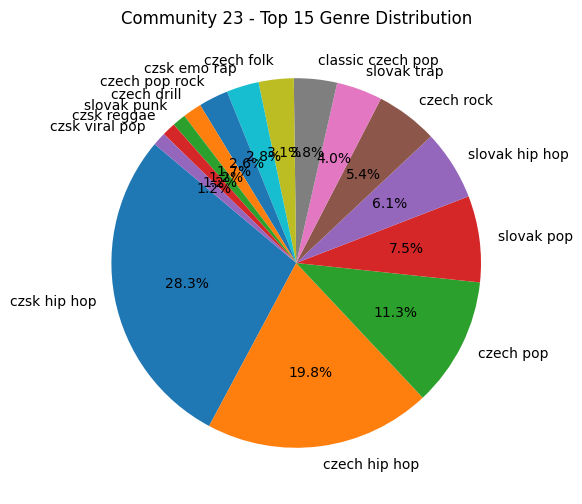

Global clustering coefficient for Community 23: 0.2972247063569773
Diameter for Community 23: 9
Density for Community 23: 0.03654437531287993

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.029735314601286304

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03339071782854359

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03317704330362558

Edge count: 1022
Node count: 237
k = 8
Comparable regular lattice diameter: 30
Comparable regular lattice global clustering: 0.6428571428571429


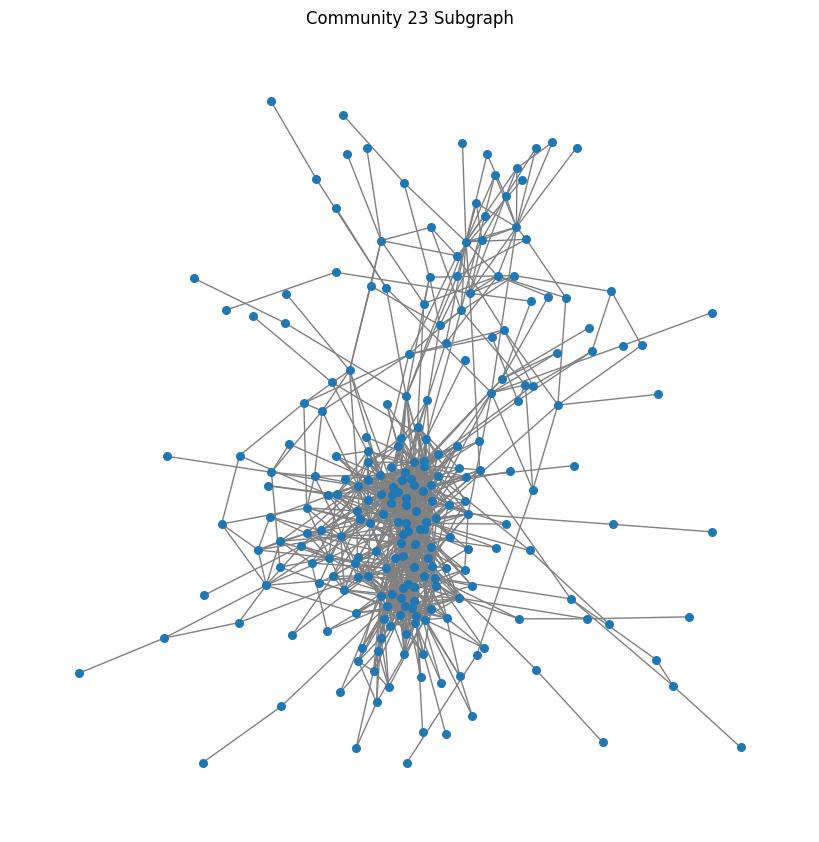

Artists in Community 22:
- Efta
- Spine
- Antonis Remos
- Tony Raw
- Hawk
- Louie Kiddo
- Natasha Kay
- Light
- Lil Koni
- SALVA
- Block 93
- Dennis Green
- Kareem Kalokoh
- Tamta
- YT
- Sophia
- Display
- Immune
- Popayedi
- Sin Boy
- LEX
- Lil PoP
- Ripen
- Demy
- Ivi Adamou
- Anna Vissi
- Christos Mastoras
- Leaderbrain
- Slogan
- Lau Jr
- Dimos Anastasiadis
- Rack
- Mef
- ATC Nico
- Ivan Greko
- DJ Tune
- Th Mark
- Petros Iakovidis
- MG
- Dirty Harry
- Natassa Bofiliou
- Stavento
- Stelios Rokkos
- Feisty
- Panos Kiamos
- Dimitris Mitropanos
- Saske
- Flare
- Khay Be
- Sakis Rouvas
- Sigma
- ATC Toro
- Mariotube Doody
- Marina Satti
- Wang
- BAKV
- Wolf
- Baghdad
- Kings
- Nume
- Yanni Bravo
- JiMBo
- DJ Stephan
- Pepe Frantik
- George Dalaras
- Mikros Kleftis
- EPITHE
- JV
- Novel 729
- Marseaux
- Giorgos Mazonakis
- Negros Tou Moria
- Trouf
- Helena Paparizou
- Melisses
- Vasilis Karras
- Panosdent
- Rina
- Bossikan
- MUNEYLXRD
- Buzz
- Katerina
- TOQUEL
- TSE
- Ν.Ο.Ε.
- ATC Taff

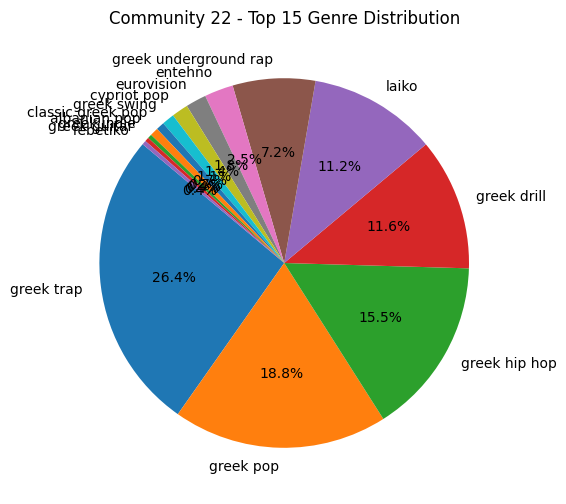

Global clustering coefficient for Community 22: 0.26878222098184545
Diameter for Community 22: 9
Density for Community 22: 0.03679848448969927

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.034282788409002

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03362901930863096

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03346804220590628

Edge count: 777
Node count: 206
k = 8
Comparable regular lattice diameter: 26
Comparable regular lattice global clustering: 0.6428571428571429


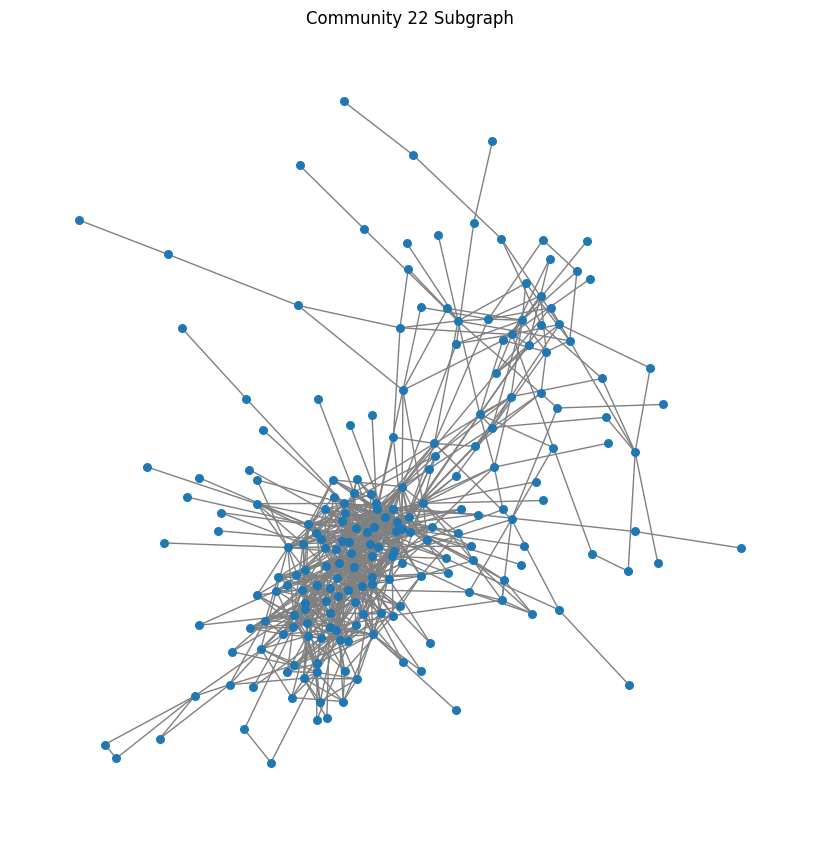

Artists in Community 53:
- RAP VIỆT
- RPT MCK
- Orange
- Hoài Lâm
- Quang Trung
- Anh Phan
- Tuấn Hưng
- Tân Trần
- Wanbi Tuan Anh
- Quang Hùng MasterD
- Hoà Minzy
- TRANG
- Quang Đăng Trần
- Joker Xue
- Đen
- 黃齡
- Chi Pu
- Obito
- Tố My
- Huỳnh Tú
- Huyền Tâm Môn
- Hoang Ton
- Bao Anh
- Hoang Thuy Linh
- Wren Evans
- Chillies
- Phuong Linh
- Hồ Quang Hiếu
- JGKiD (Da LAB)
- Studio Party
- Orinn
- Tien Cookie
- Truc Nhan
- Pháo
- Văn Mai Hương
- Ai Phuong
- Giao Linh
- Khac Viet
- Low G
- Chau Dang Khoa
- Hien Thuc
- Khanh Phuong
- Phan Mạnh Quỳnh
- Nhu Quynh
- Emcee L (Da LAB)
- Juky San
- HuyR
- JSOL
- Kimmese
- Vicky Nhung
- K-ICM
- Tùng Dương
- Rum
- Da LAB
- Rhymastic
- W/N
- SOOBIN
- Đông Nhi
- MIN
- Thiều Bảo Trâm
- Tóc Tiên
- Madihu
- Tiên Tiên
- Phí Phương Anh
- GiGi Hương Giang
- Isaac
- PC
- Quân A.P
- Tăng Duy Tân
- Quoc-Bao
- PhucXP
- Phạm Toàn Thắng
- Suboi
- Hồ Ngọc Hà
- Bằng Kiều
- NSND Bach Tuyet
- Hồ Quỳnh Hương
- Datmaniac
- Rtee
- Vu Trung Quan
- Wxrdie
- Rapital
- 

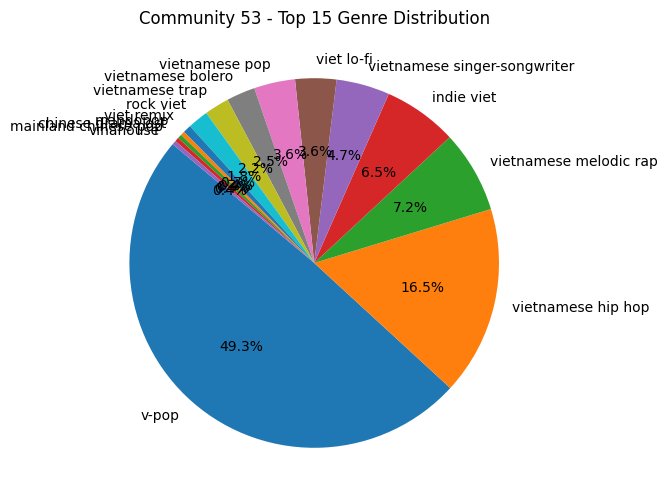

Global clustering coefficient for Community 53: 0.1388254354630711
Diameter for Community 53: 10
Density for Community 53: 0.02240113663272555

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.01678060663209178

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.015324816795405032

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.020393359363947598

Edge count: 473
Node count: 206
k = 4
Comparable regular lattice diameter: 52
Comparable regular lattice global clustering: 0.5


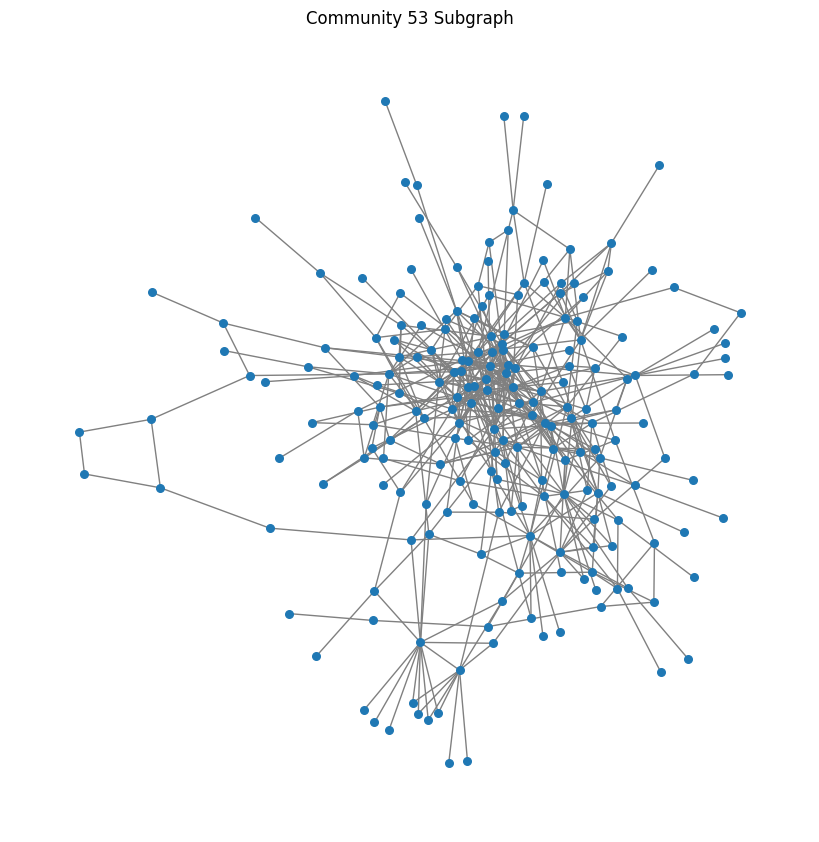

Artists in Community 50:
- Mthunzi
- Spoegwolf
- Nomcebo Zikode
- Njelic
- Shekhinah
- Vetkuk
- Intaba Yase Dubai
- Lloyiso
- Venom
- Musa Keys
- Nissi
- Frenzyoffixial
- Appel
- Nahaze
- Azana
- Nomfundo Moh
- Caltonic SA
- Killer Kau
- 031CHOPPA
- Balcony Mix Africa
- Dladla Mshunqisi
- Mapara A Jazz
- Amanda Black
- Mr JazziQ
- Focalistic
- Pabi Cooper
- Rethabile Khumalo
- Bok Van Blerk
- Dj Karri
- Boohle
- Simmy
- Sam Deep
- William Last KRM
- Shane Eagle
- Kwesta
- Demi Lee Moore
- DJ Big Sky
- Matthew Mole
- KayGee DaKing
- Amu Classic
- Busiswa
- Jub Jub
- A-Reece
- Sayfar
- Mellow & Sleazy
- Luu Nineleven
- AKA
- Alfa Kat
- DJ Zinhle
- 25K
- Miss Pru DJ
- DJ Stokie
- Nicole Elocin
- Master KG
- Jay Music
- Lowsheen
- Soweto's Finest
- DJ Ngwazi
- Early B
- DBN Gogo
- JazziDisciples
- Dj Obza
- Snotkop
- Blxckie
- Kweyama Brothers
- Aubrey Qwana
- The Lowkeys
- Blaqnick & MasterBlaq
- Tumisho
- HENNYBELIT
- Irene-Louise Van Wyk
- Musketeers
- MDU aka TRP
- Deep London
- Young 

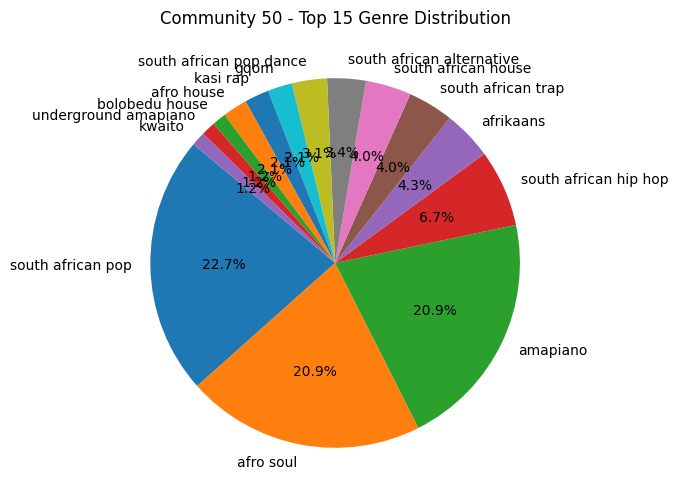

Global clustering coefficient for Community 50: 0.25466702970157984
Diameter for Community 50: 12
Density for Community 50: 0.043567839195979896

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.034934289566642504

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.04417063247210306

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.03671364750660416

Edge count: 867
Node count: 200
k = 8
Comparable regular lattice diameter: 25
Comparable regular lattice global clustering: 0.6428571428571429


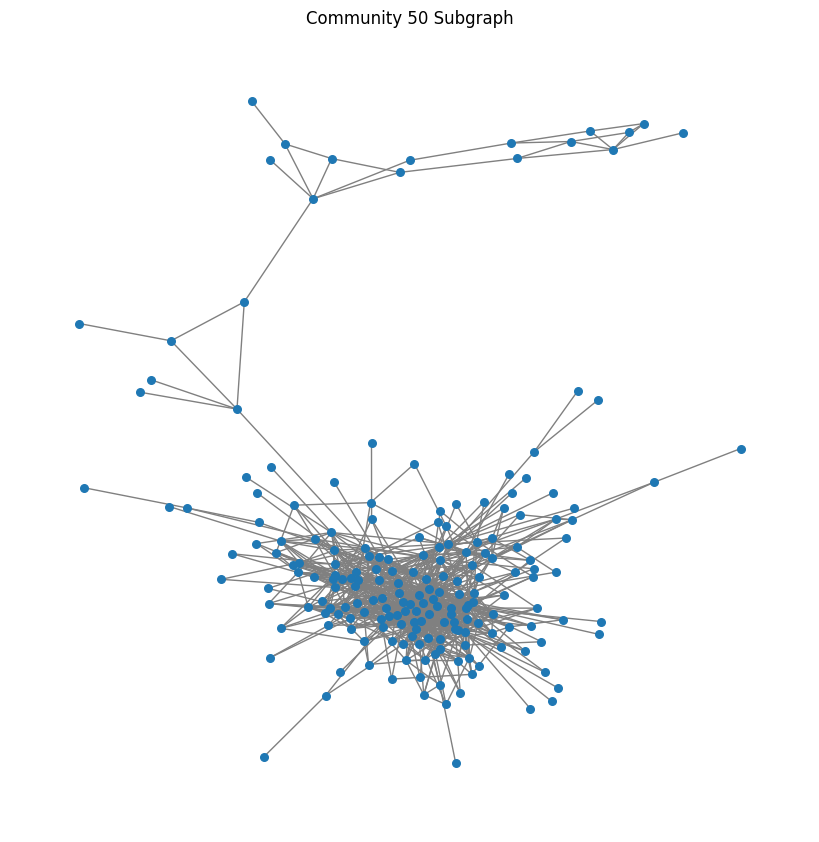

Artists in Community 18:
- Breiðablik
- Sumargleðin
- Friðrik Dór
- Rari Boys
- Unnsteinn
- Yung Nigo Drippin'
- Elly Vilhjálms
- Helgi Björnsson
- Einar Júlíusson
- Jóhanna Guðrún
- BlazRoca
- Iceland Symphony Orchestra
- Brunaliðið
- Mambakid
- Edda Heiðrún Backman
- Sigríður Thorlacius
- FM95BLÖ
- Steinar
- Alda Dis
- Katla María
- Hjálmar
- Baggalútur
- Villi Neto
- Nýdönsk
- Þú og ég
- Vilhjálmur Vilhjálmsson
- SUNCITY
- Emmsjé Gauti
- ISSI
- Ra:tio
- RAKEL
- Vök
- Ragga Gröndal
- Klara Elias
- Andreas Schuller
- Bjartmar Guðlaugsson
- Helgi B
- Emilíana Torrini
- THØR
- SZK
- Greta Salóme
- Friðrik Ómar
- Andrea Gylfadóttir
- Haffi Haff
- Steindi Jr.
- Floni
- Sælan
- La Melo
- Rikard Nordraak
- Stuðlabandið
- Herra Hnetusmjör
- Úlfur Úlfur
- Vaginaboys
- Drengur
- Shakespeare verður ástfanginn
- Plasticboy
- HLH flokkurinn
- Gummi Tóta
- krassasig
- GCD
- Memfismafían
- Markéta Irglová
- Björn Jörundur Friðbjörnsson
- Pálmi Gunnarsson
- Logi Pedro
- Steindinn okkar
- Prince Fend

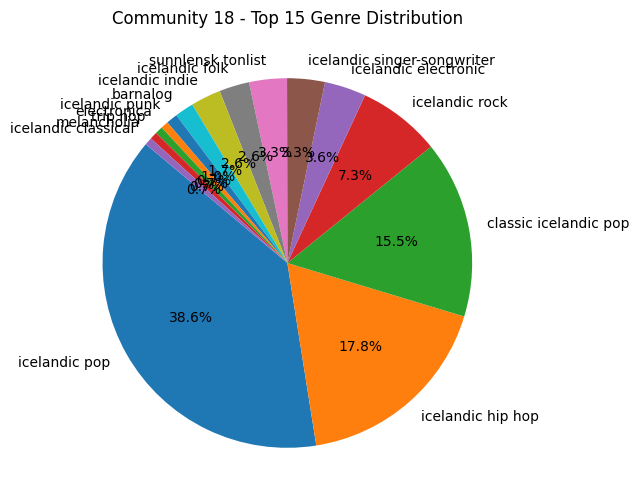

Global clustering coefficient for Community 18: 0.15964214438941013
Diameter for Community 18: 9
Density for Community 18: 0.02284148012791229

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.02161098161098161

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.012189353856020522

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.0220587062295605

Edge count: 450
Node count: 199
k = 4
Comparable regular lattice diameter: 50
Comparable regular lattice global clustering: 0.5


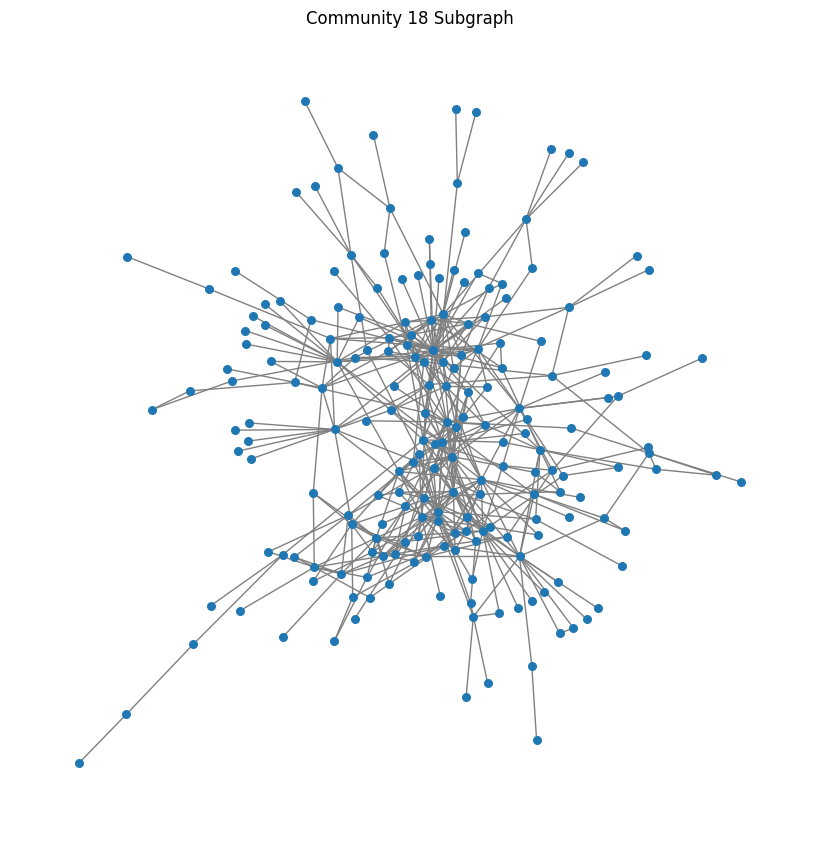

Artists in Community 64:
- Abra Cadabra
- DJ Noiz
- Nafe Smallz
- Silky
- Wiley
- Kano
- Ramz
- The Plug
- Cadet
- Kenny Allstar
- Popcaan
- Koomz
- Young T & Bugsey
- Lethal Bizzle
- Hardy Caprio
- Meekz
- Rema
- Robinson
- Blueboy
- Jaykae
- RaiM
- OFB
- RAY BLK
- Headie One
- LAUREN
- Not3s
- Chip
- ONEFOUR
- Jme
- Youngn Lipz
- JAY1
- Black Sherif
- MIST
- Wes Nelson
- Bugzy Malone
- S-X
- Loyle Carner
- Kojo Funds
- Baka Not Nice
- Loski
- Lady Leshurr
- Deno
- M1llionz
- dutchavelli
- Da Beatfreakz
- Tana
- MizOrMac
- Nick Brewer
- Benzz
- Alcemist
- King Promise
- Naomi Scott
- Big Shaq
- NSG
- Fuse ODG
- Central Cee
- One Acen
- DJ Tarico
- HAZEY
- GRM Daily
- Joe Weller
- Shakka
- Maverick Sabre
- MoStack
- Stormzy
- Dappy
- KSI
- Open Till L8
- Brady Watt
- Dimzy
- AJ x Deno
- J Hus
- AJ
- Smallgod
- Aitch
- Stylo G
- Unknown T
- Poundz
- Chase & Status
- Nines
- Kate Nash
- Fekky
- Frosty
- M.O
- SwitchOTR
- Afro B
- AJ Tracey
- N-Dubz
- Lil Macks
- iLL BLU
- Mr Eazi
- E1 (3

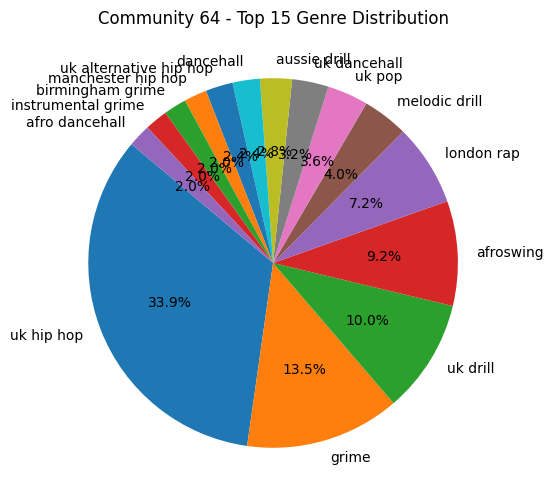

Global clustering coefficient for Community 64: 0.2786935022151989
Diameter for Community 64: 9
Density for Community 64: 0.06489326765188834

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.05565398796004723

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.06643161039999684

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.05560682066962474

Edge count: 988
Node count: 175
k = 12
Comparable regular lattice diameter: 15
Comparable regular lattice global clustering: 0.6818181818181818


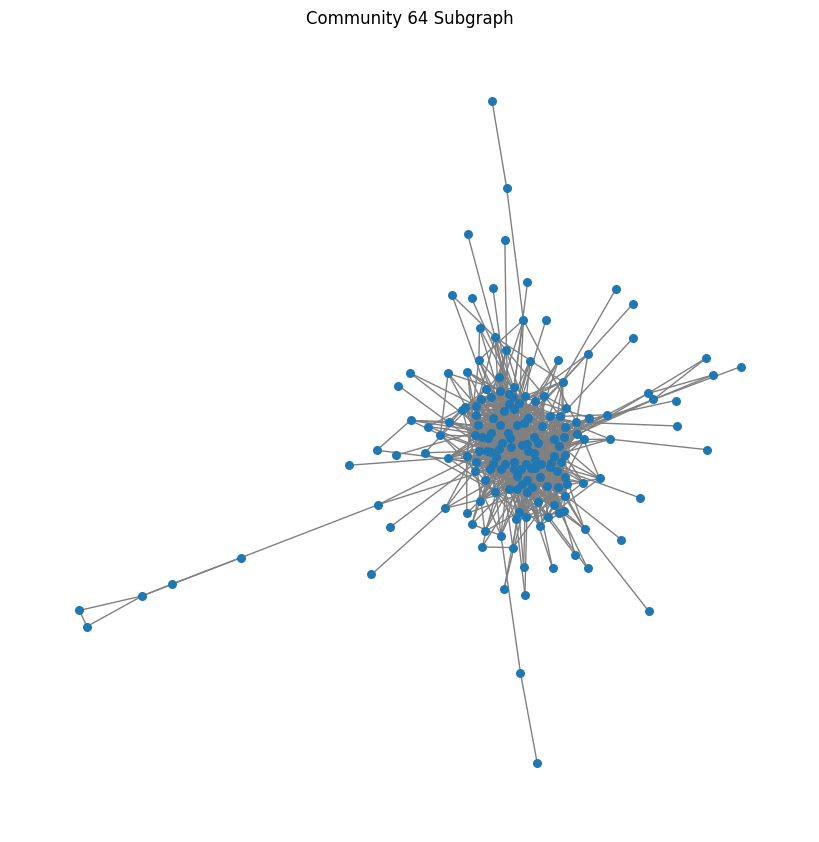

Artists in Community 56:
- שחר סאול
- ותן חלקנו
- Bar Tzabary
- Eden Hason
- Eden Ben Zaken
- Nadav Guedj
- Ella Lee
- Nikos Vertis
- Teddy Neguse
- קייט ואור
- Nathan Goshen
- Jasmin Moallem
- Maya Dadon
- Zehava Ben
- Aviv Geffen
- Noy Fadlon
- Guy & Yahel
- Berry Sakharof
- Omer Netzer
- Eden Meiri
- Itay Levi
- Netta
- 7 Jaws
- Shai Tsabari
- Kobi Marimi
- Niv Demirel
- יוצרות את הבום
- Mooki
- Matti Caspi
- Avi Aburomi
- Alma Zohar
- Static & Ben El
- Dudu Faruk
- Kobi Peretz
- Beit Habubot
- Adi Ulmansky
- Harel Skaat
- Kobi Maman
- Gal Adam
- Full Trunk
- Stephane Legar
- Anna Zak
- Nasrin Kadri
- Sarit Hadad
- Ofek Hamalach
- Shaked Komemy
- Eden Alene
- Talisman
- Liran Danino
- Ivri Lider
- Elai Botner and Yaldei Hachutz
- Dudu Aharon
- Hadag Nahash
- Nofar Salman
- Ishay Levi
- Ninet Tayeb
- Ido Shoam
- Elai Botner
- Maor Cohen
- Shlomi Shabat
- Chen Aharoni
- Riff Cohen
- Mercedes Band
- Metro the Savage
- Omri 69 Segal
- Avior Malasa
- Dudu Tassa
- Gil Vain
- Meir Ariel
- 

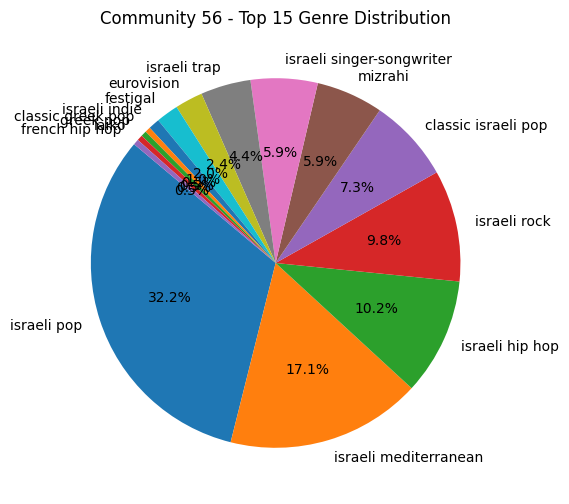

Global clustering coefficient for Community 56: 0.14178666692211583
Diameter for Community 56: 8
Density for Community 56: 0.03354827466016033

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.031881253404432215

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.03435625047467152

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.017683501683501683

Edge count: 385
Node count: 152
k = 6
Comparable regular lattice diameter: 26
Comparable regular lattice global clustering: 0.6


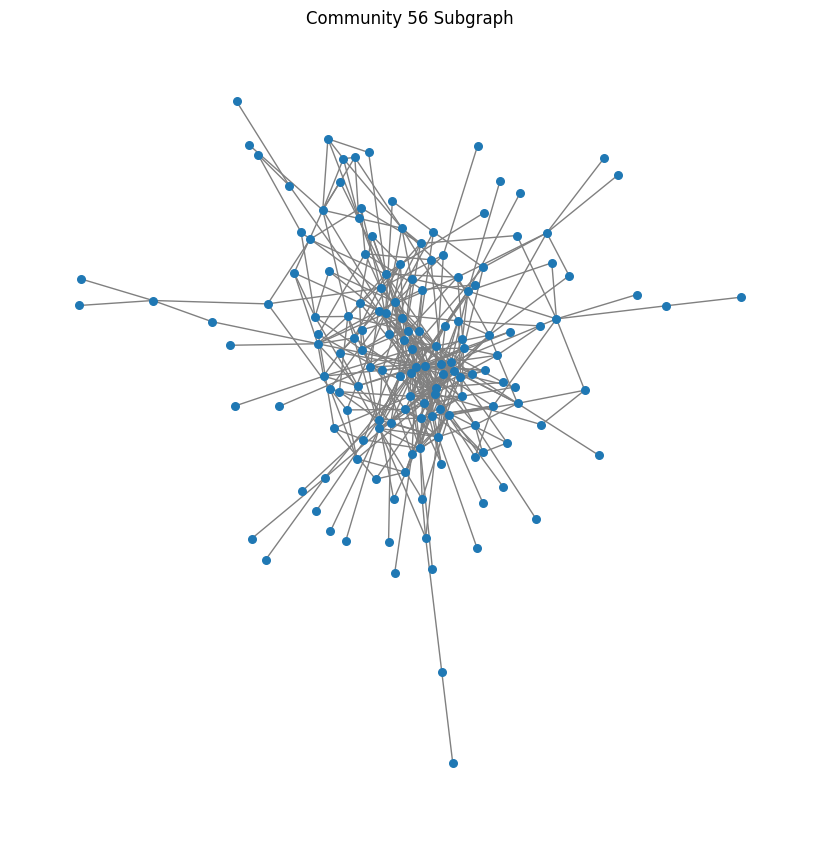

Artists in Community 34:
- Nasrat Al Badr
- Ghaliaa
- Shehab
- Ahmed Kamel
- Salah Al Zadjali
- Arsenik
- Ali Adora
- Nancy Ajram
- Dyler
- Humood AlKhudher
- Blvxb
- Mohamed AlSalim
- Disco Misr
- Sabah Mahmod
- Ameen Khattab
- Moustafa Hagag
- Hoda Bondok
- Telecom Egypt
- Ahmed Santa
- Abu
- Yasser Abd Alwahab
- Saif Amer
- Ahmed Basyoni
- Batistuta
- Hamo ElTikha
- Various Artists
- Amr Saad
- Mahmoud Al Turky
- Jafar Al Ghazal
- 7l2olo
- Ali Saber
- Evan Naji
- 3enaba
- Al Nather
- Dalia
- Essam Sasa
- Ahmed Mekky
- Mohamed Zizo
- Marwan Pablo
- فيلو
- Hamada Abo El Soud
- Samer Elmedany
- Memaar Al Morshedy
- Mahmoud El Leithy
- حماده الاسمر
- Moscow
- Wegz
- Muslim
- Bahaa Sultan
- Felo
- G. Oka
- Shaimaa El Maghraby
- DJ Totti
- احمد موزه
- Abdelrahman Roshdy
- Intomymind
- احمد الدوجري
- Cairokee
- Wama
- Shahyn
- Moslem
- Salma Rachid
- Hassan Shakosh
- Hamza Namira
- Rawan Bin Hussain
- Amir Eid
- Abdelmoula
- Abo El Anwar
- Daffy
- Rashed Muzik
- Aida el Ayoubi
- Ali Saber


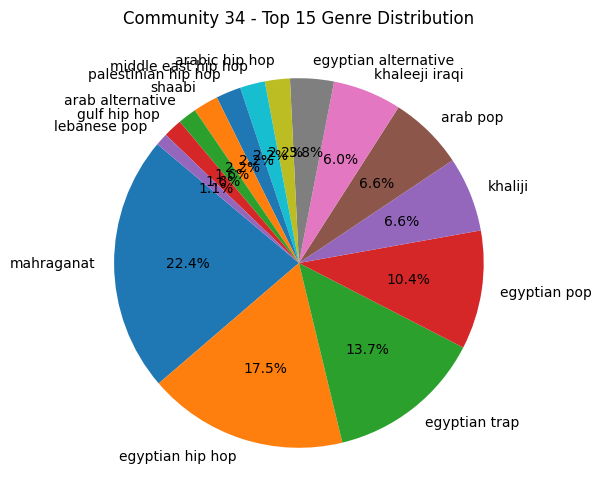

Global clustering coefficient for Community 34: 0.14596657370062505
Diameter for Community 34: 16
Density for Community 34: 0.026470882029767256

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.024717150804107323

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.02683824691123961

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.030164358887763143

Edge count: 265
Node count: 142
k = 4
Comparable regular lattice diameter: 36
Comparable regular lattice global clustering: 0.5


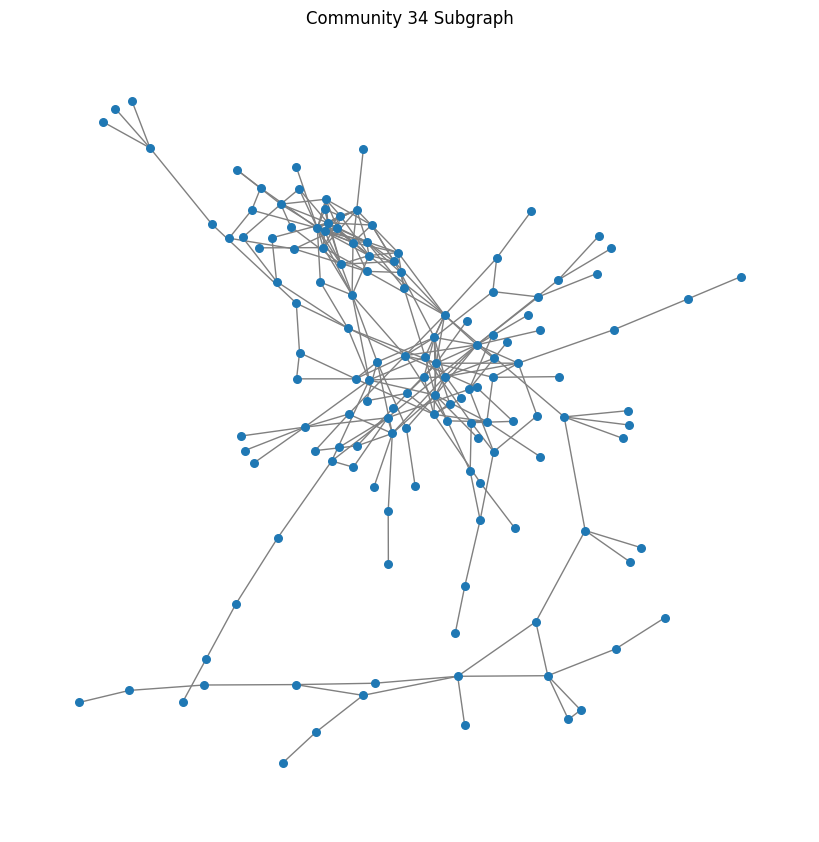

Artists in Community 32:
- KKevin
- Apu
- 6363
- Nks
- Zaporozsec
- Tiah
- Killakikitt
- Hundred Sins
- Solére
- Berkes Olivér
- Kisé
- Kállay Saunders
- Pápai Joci
- Kis Grófo
- Kasza Tibi
- ibbigang
- Nemazalány
- Krúbi
- Konyha
- Punnany Massif
- Misshmusic
- Irie Maffia
- Szakács Gergő
- T. Danny
- G.w.M.
- Opitz Barbara
- Reza
- Manuel
- Dé:Nash
- King Monroe
- AK26
- Mario
- Kowalsky Meg A Vega
- Bëlga
- gyuris
- Atka
- Red Bull Pilvaker
- Paulina
- Nági
- Rácz Gergõ
- Horváth Tamás
- HoneyBeast
- Mikee Mykanic
- Tóth Andi
- Republic
- Wellhello
- Tankcsapda
- AWS
- Egs
- Mynea
- Hiro
- Tirpa
- Kelemen Kabátban
- Zubi
- Freddie
- Rúzsa Magdolna
- Bereczki Zoltán
- ScarcityBP
- SuperStereo
- Zävodi
- AKC Kretta
- LMEN PRALA
- Soulwave
- Curtis
- Mehringer
- Brains
- Kollányi Zsuzsi
- Halott Pénz
- New Level Empire
- Filius Dei
- The Biebers
- Essemm
- Figura
- Follow The Flow
- frendz
- 4tress
- DESH
- Ákos
- Pixa
- Azahriah
- DR BRS
- Lotfi Begi
- Csondor Kata
- ALEE
- Majka
- Se

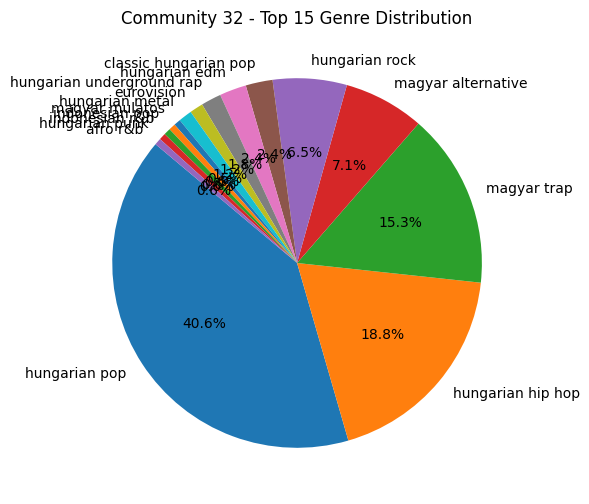

Global clustering coefficient for Community 32: 0.2135377463207652
Diameter for Community 32: 11
Density for Community 32: 0.03845462713387242

Comparable random graph diameter: 8
Comparable random graph global clustering: 0.03934996220710506

Comparable random graph diameter: 7
Comparable random graph global clustering: 0.039297272306981046

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.022478991596638655

Edge count: 214
Node count: 106
k = 4
Comparable regular lattice diameter: 27
Comparable regular lattice global clustering: 0.5


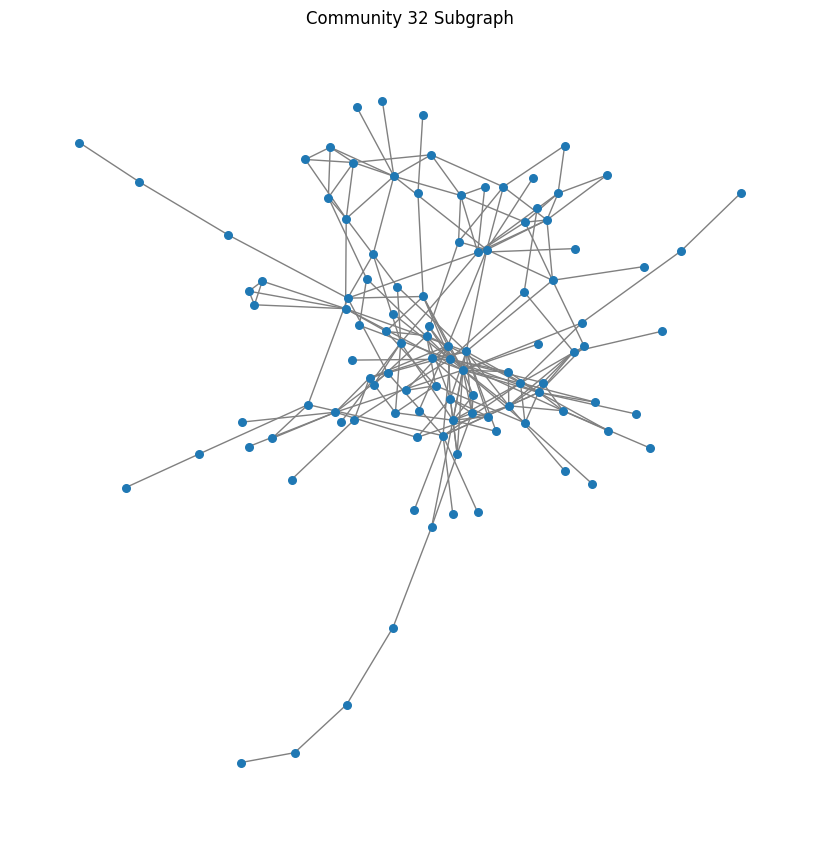

Artists in Community 547:
- Abdullah Al Mukhles
- بدر العزي
- Abdullah Al Farwan
- Fahed Bin Fasla
- منصور الوايلي
- فلاح المسردي
- سلطان الفهادي
- دحام العبيوي
- محمد ال دلبج
- غريب ال مخلص
- بندر بن عوير
- Faisal Abdulkareem

Community 547 Top 15 Genre Distribution:
- sheilat: 8 artist(s)
- khaliji: 5 artist(s)
- khaleeji iraqi: 1 artist(s)


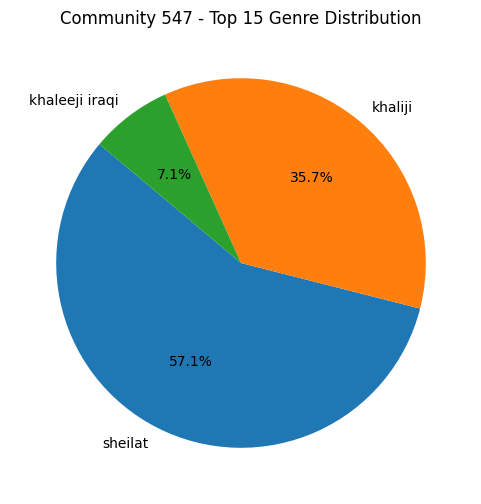

Global clustering coefficient for Community 547: 0.13888888888888887
Diameter for Community 547: 5
Density for Community 547: 0.25757575757575757

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.37222222222222223

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.19166666666666665

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.1696969696969697

Edge count: 17
Node count: 12
k = 2
Comparable regular lattice diameter: 6
Comparable regular lattice global clustering: 0.0


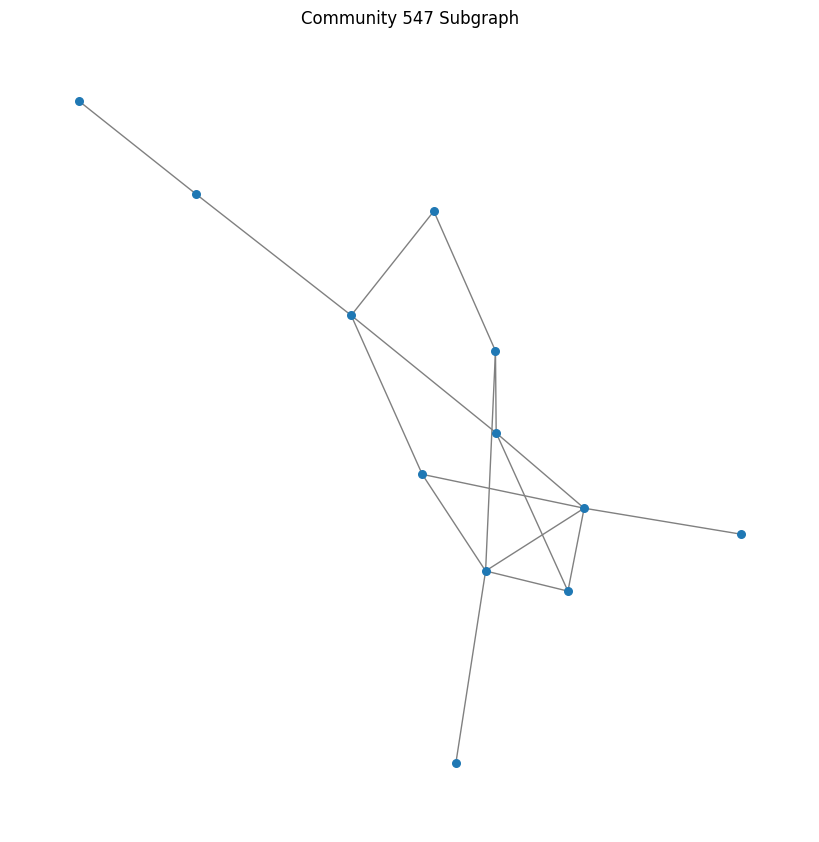

Artists in Community 818:
- Rumberos
- La De Roberto
- Japiaguar
- LaNuestra
- Chapa C
- Diego Ríos
- Cumbia Juan
- Los Verduleros
- Qmbia Juan
- Talento de Barrio

Community 818 Top 15 Genre Distribution:
- cumbia paraguaya: 6 artist(s)
- cumbia pop: 3 artist(s)
- pop paraguayo: 3 artist(s)
- paraguayan rock: 3 artist(s)
- latin hip hop: 1 artist(s)
- reggaeton: 1 artist(s)
- cumbia boliviana: 1 artist(s)


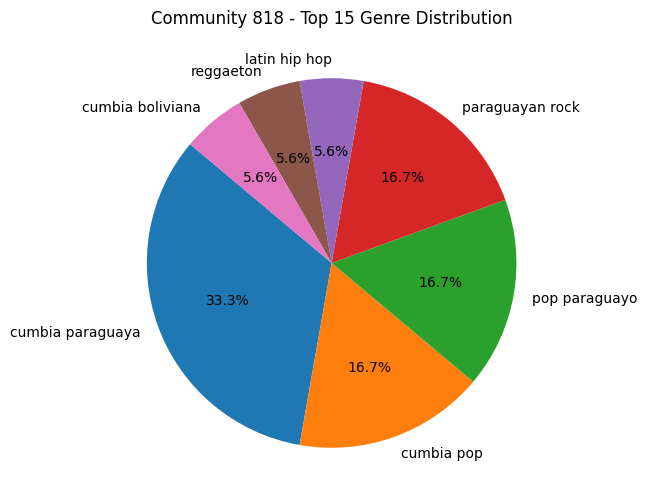

Global clustering coefficient for Community 818: 0.23333333333333334
Diameter for Community 818: 5
Density for Community 818: 0.2222222222222222

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.08333333333333333

Edge count: 10
Node count: 10
k = 2
Comparable regular lattice diameter: 5
Comparable regular lattice global clustering: 0.0


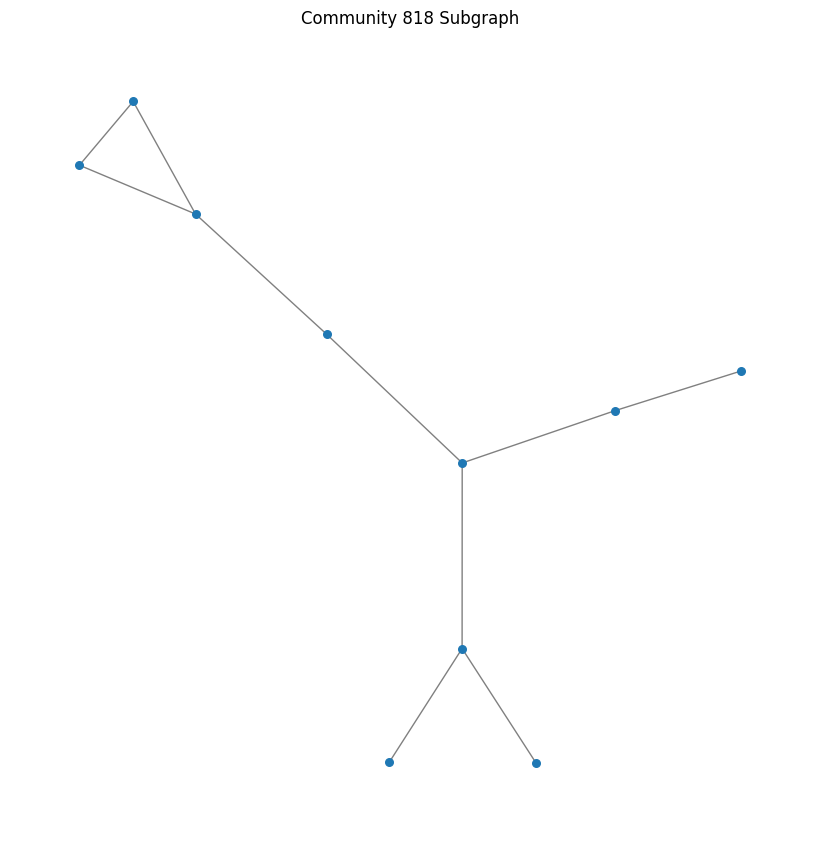

Artists in Community 20:
- Hanzy
- Wikw
- JESSIA
- Lost Identities
- EQRIC
- 5HOW
- 8D Tunes
- Simock
- The FifthGuys

Community 20 Top 15 Genre Distribution:
- covertronica: 2 artist(s)
- sad rap: 1 artist(s)
- alt z: 1 artist(s)
- pop edm: 1 artist(s)
- 8d: 1 artist(s)
- traprun: 1 artist(s)


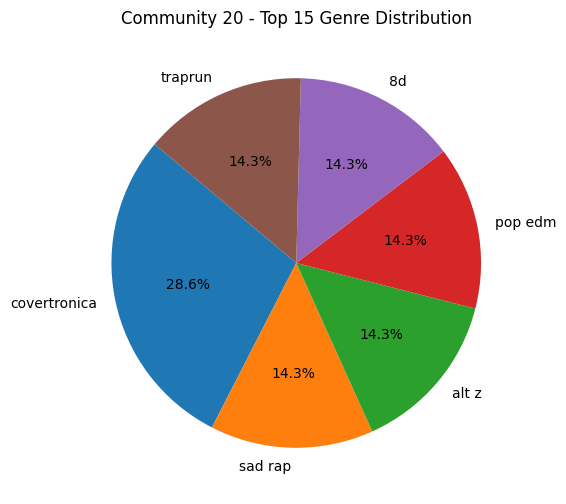

Global clustering coefficient for Community 20: 0.16666666666666666
Diameter for Community 20: 4
Density for Community 20: 0.25

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.3703703703703704

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.43333333333333335

Edge count: 9
Node count: 9
k = 2
Comparable regular lattice diameter: 5
Comparable regular lattice global clustering: 0.0


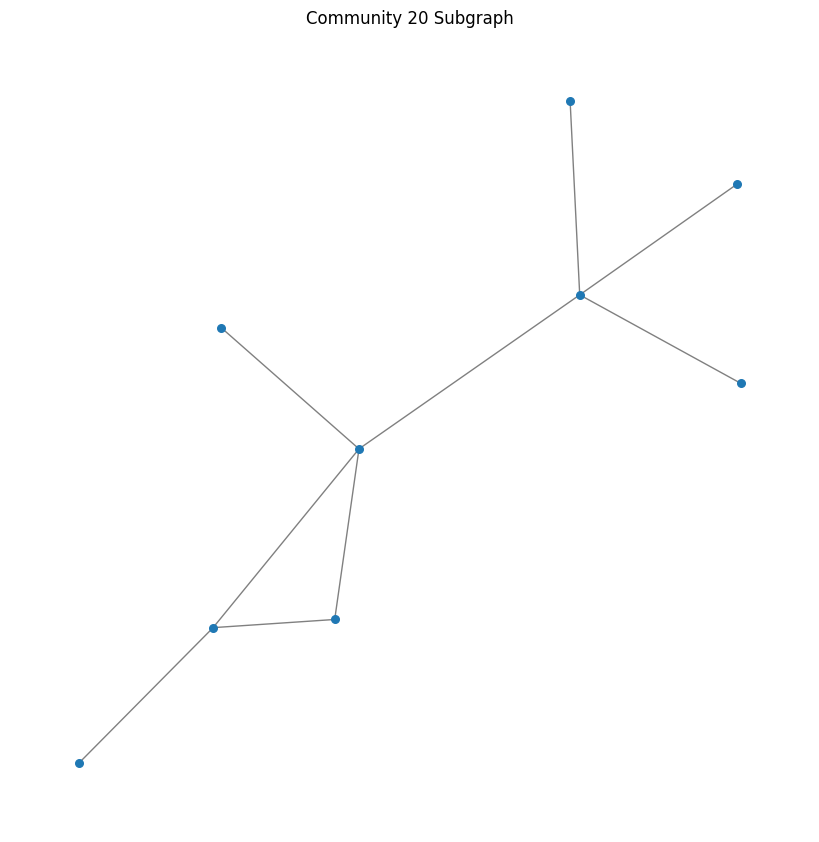

Artists in Community 605:
- Julio Melgar
- Redimi2
- Aliento
- Kari Jobe
- Miel San Marcos
- Alex Zurdo
- Gabriela Rocha
- Elevation Worship
- Lead

Community 605 Top 15 Genre Distribution:
- latin worship: 5 artist(s)
- latin christian: 4 artist(s)
- rap cristiano: 2 artist(s)
- ccm: 2 artist(s)
- christian music: 2 artist(s)
- worship: 2 artist(s)
- rap conciencia: 1 artist(s)
- christian alternative rock: 1 artist(s)
- world worship: 1 artist(s)
- reggaeton cristiano: 1 artist(s)
- adoracao: 1 artist(s)
- brazilian gospel: 1 artist(s)


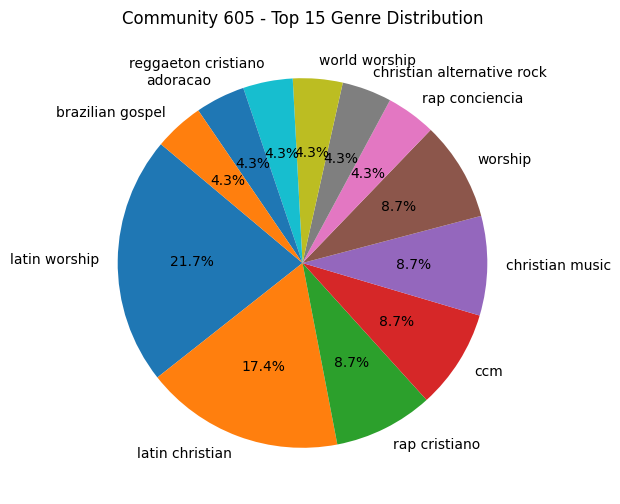

Global clustering coefficient for Community 605: 0.37037037037037035
Diameter for Community 605: 4
Density for Community 605: 0.3333333333333333

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.42592592592592593

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.25925925925925924

Edge count: 12
Node count: 9
k = 2
Comparable regular lattice diameter: 5
Comparable regular lattice global clustering: 0.0


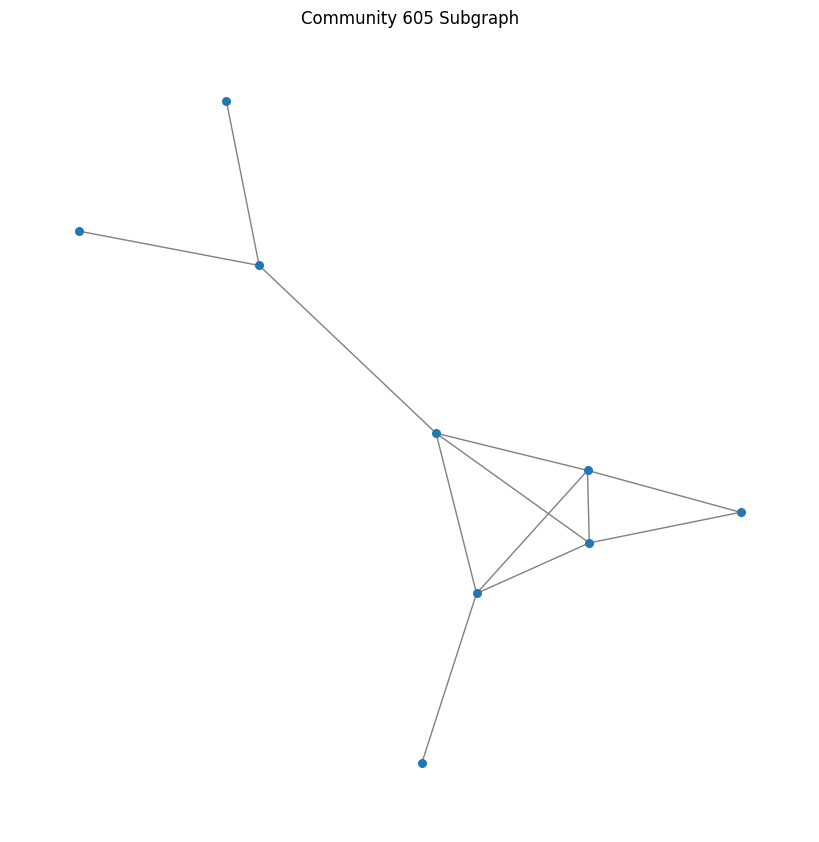

Artists in Community 174:
- Steven Pineda
- JWolfy
- Nassir Chahin
- Juan Oliva
- Jesus Aguilar
- J Calix
- Capi
- Stayleave

Community 174 Top 15 Genre Distribution:
- pop catracho: 7 artist(s)
- indie nica: 1 artist(s)


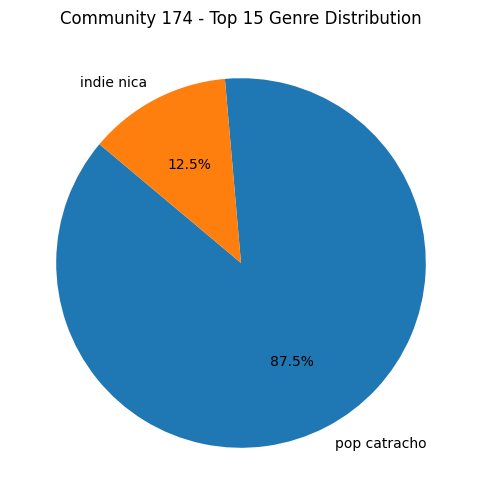

Global clustering coefficient for Community 174: 0.1875
Diameter for Community 174: 4
Density for Community 174: 0.35714285714285715

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.33333333333333337

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.0

Edge count: 10
Node count: 8
k = 2
Comparable regular lattice diameter: 4
Comparable regular lattice global clustering: 0.0


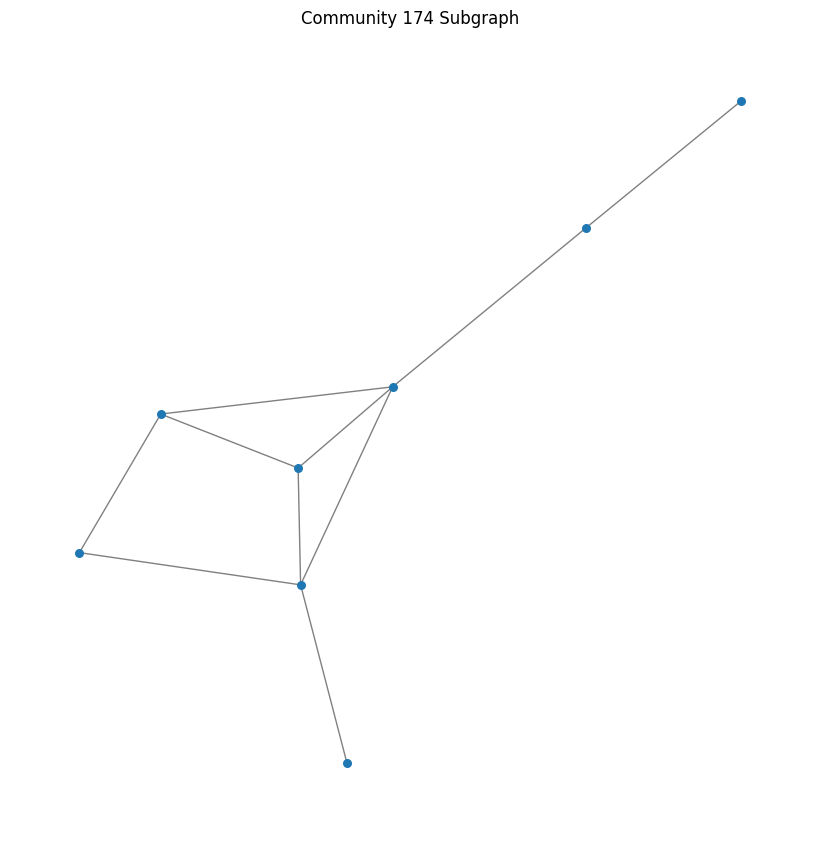

Artists in Community 176:
- Олександр Пономарьов
- Нумер 482
- Motor'Rolla
- Epolets
- СТРУКТУРА ЩАСТЯ
- хейтспіч
- Tartak
- Arsen Mirzoyan

Community 176 Top 15 Genre Distribution:
- ukrainian rock: 7 artist(s)
- ukrainian pop: 6 artist(s)
- ukrainian folk rock: 2 artist(s)
- ukrainian alternative rock: 1 artist(s)
- ukrainian indie: 1 artist(s)
- ukrainian viral pop: 1 artist(s)


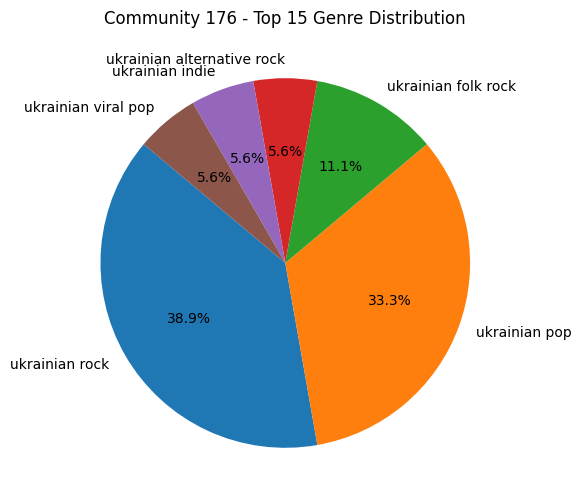

Global clustering coefficient for Community 176: 0.0
Diameter for Community 176: 5
Density for Community 176: 0.25

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.3333333333333333

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.3523809523809524

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.0

Edge count: 7
Node count: 8
k = 2
Comparable regular lattice diameter: 4
Comparable regular lattice global clustering: 0.0


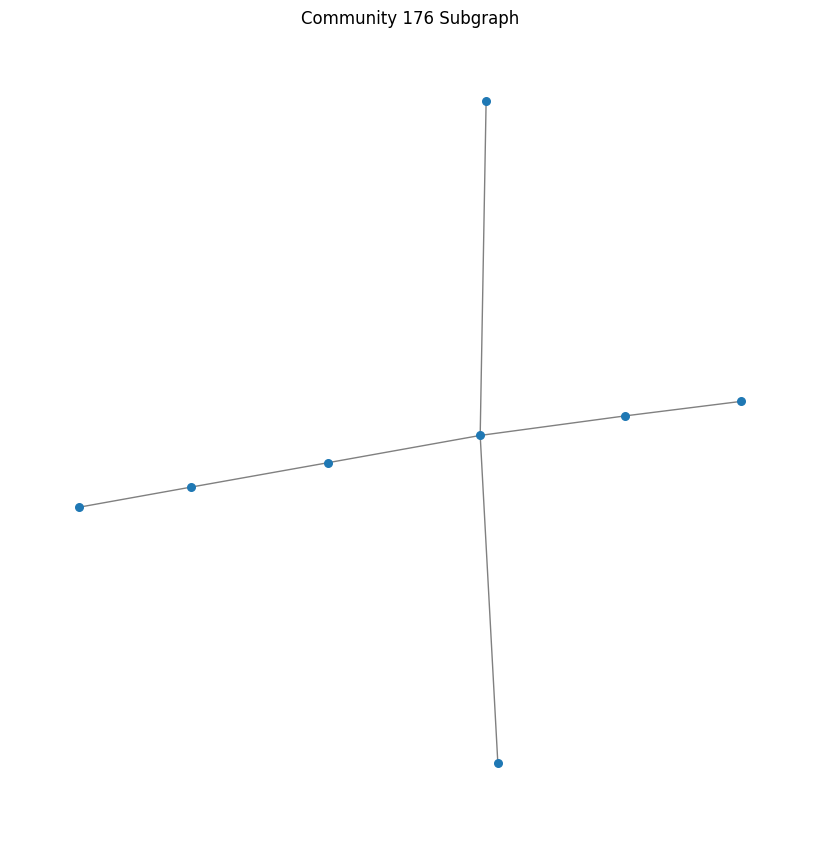

Artists in Community 1191:
- Aniceto Molina
- Calixto Ochoa
- Lisandro Meza
- Los Corraleros De Majagual
- La Luz Roja De San Marcos
- Armando Hernandez
- Calixto Ochoa y Su Conjunto

Community 1191 Top 15 Genre Distribution:
- cumbia: 7 artist(s)
- tropical: 4 artist(s)
- chicha: 2 artist(s)
- cumbia salvadorena: 2 artist(s)
- folclor colombiano: 1 artist(s)
- musica andina colombiana: 1 artist(s)
- folclor afrocolombiano: 1 artist(s)
- musica costena: 1 artist(s)
- porro: 1 artist(s)


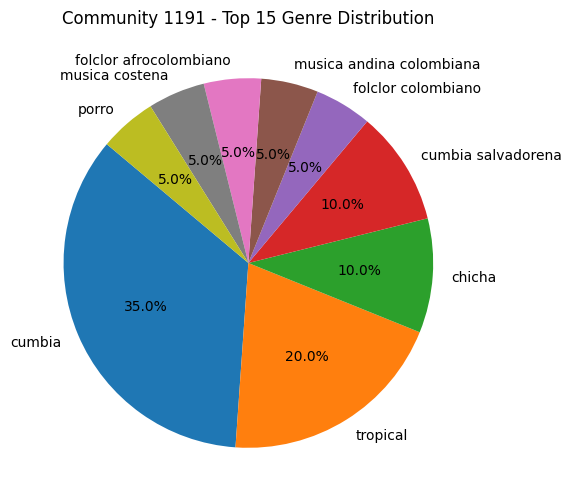

Global clustering coefficient for Community 1191: 0.0
Diameter for Community 1191: 3
Density for Community 1191: 0.2857142857142857

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.3095238095238095

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.8666666666666666

Edge count: 6
Node count: 7
k = 2
Comparable regular lattice diameter: 4
Comparable regular lattice global clustering: 0.0


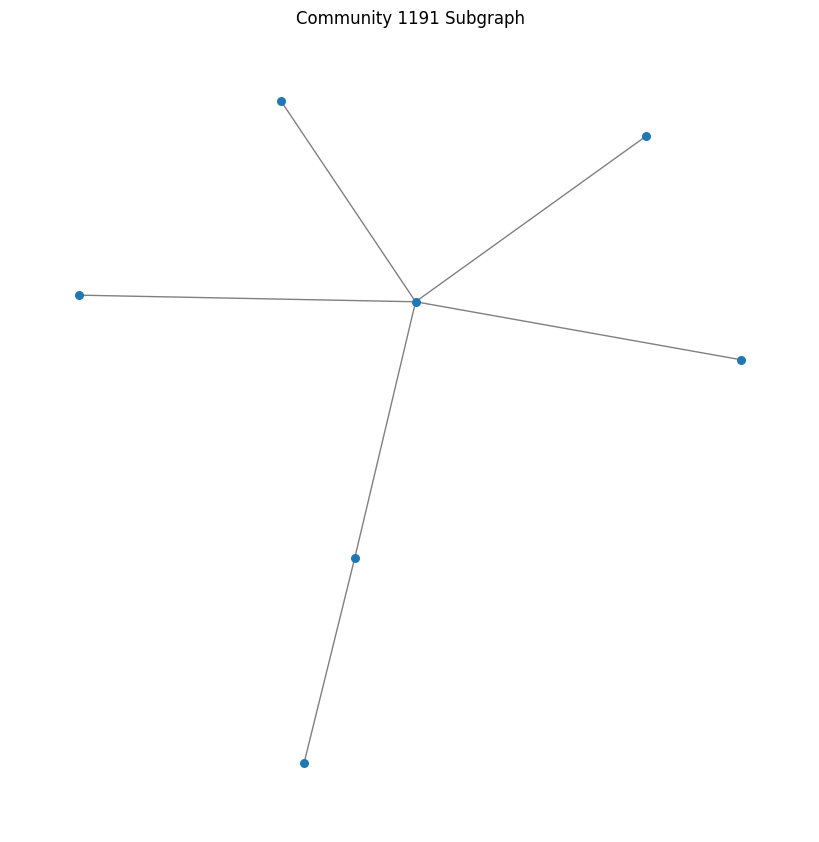

Artists in Community 145:
- Aiman Tino
- Luqman Faiz
- Yazid Izaham
- Sufian Suhaimi
- Fieya Julia
- Fara Hezel

Community 145 Top 15 Genre Distribution:
- malaysian pop: 6 artist(s)
- malay rap: 1 artist(s)


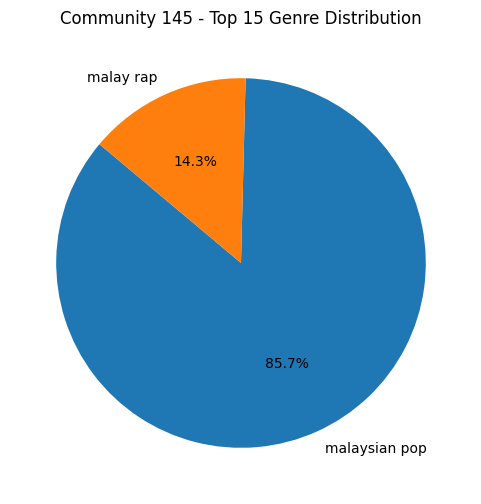

Global clustering coefficient for Community 145: 0.9333333333333332
Diameter for Community 145: 2
Density for Community 145: 0.9333333333333333

Comparable random graph diameter: 1
Comparable random graph global clustering: 1.0

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.9333333333333332

Comparable random graph diameter: 1
Comparable random graph global clustering: 1.0

Edge count: 14
Node count: 6
k = 4
Comparable regular lattice diameter: 2
Comparable regular lattice global clustering: 0.6666666666666666


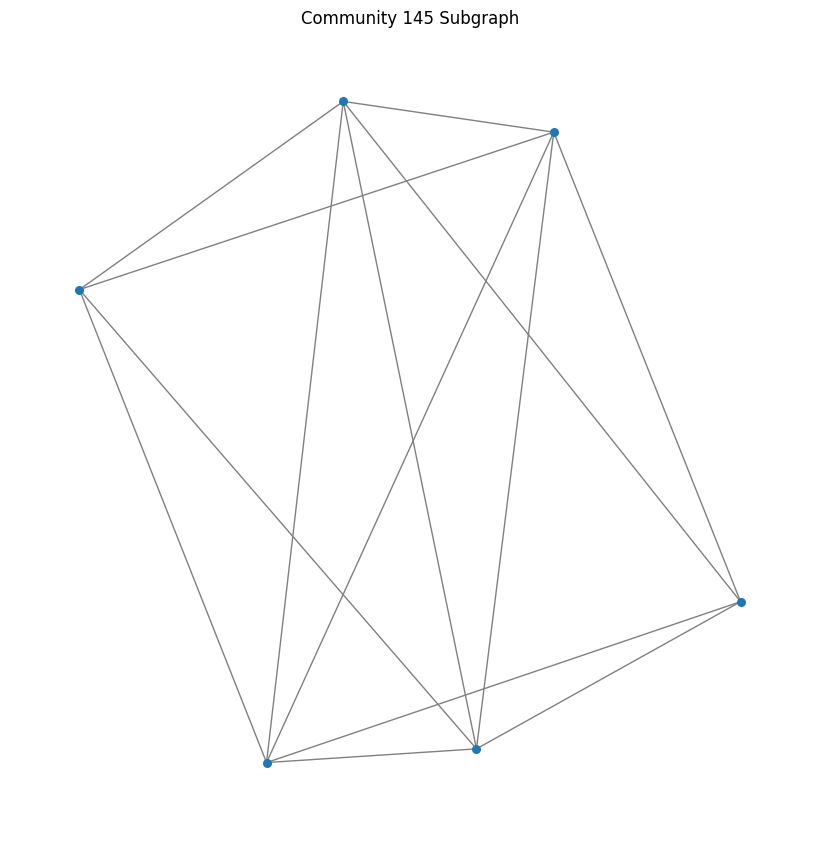

Artists in Community 124:
- EeOneGuy
- Kolaba
- To Eternity
- ENLEO
- Маша Кондратенко

Community 124 Top 15 Genre Distribution:
- russian viral rap: 1 artist(s)
- ukrainian viral pop: 1 artist(s)


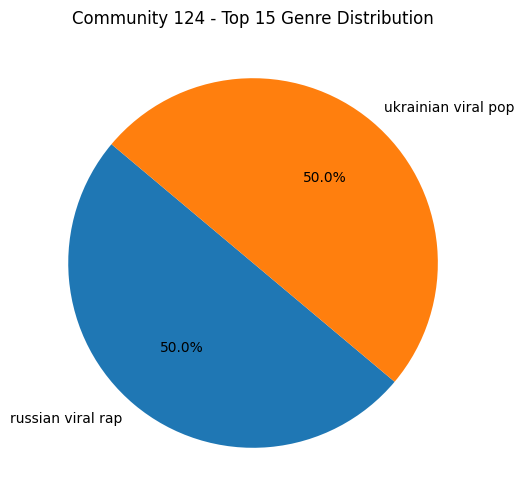

Global clustering coefficient for Community 124: 0.4666666666666667
Diameter for Community 124: 3
Density for Community 124: 0.5

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.0

Edge count: 5
Node count: 5
k = 2
Comparable regular lattice diameter: 3
Comparable regular lattice global clustering: 0.0


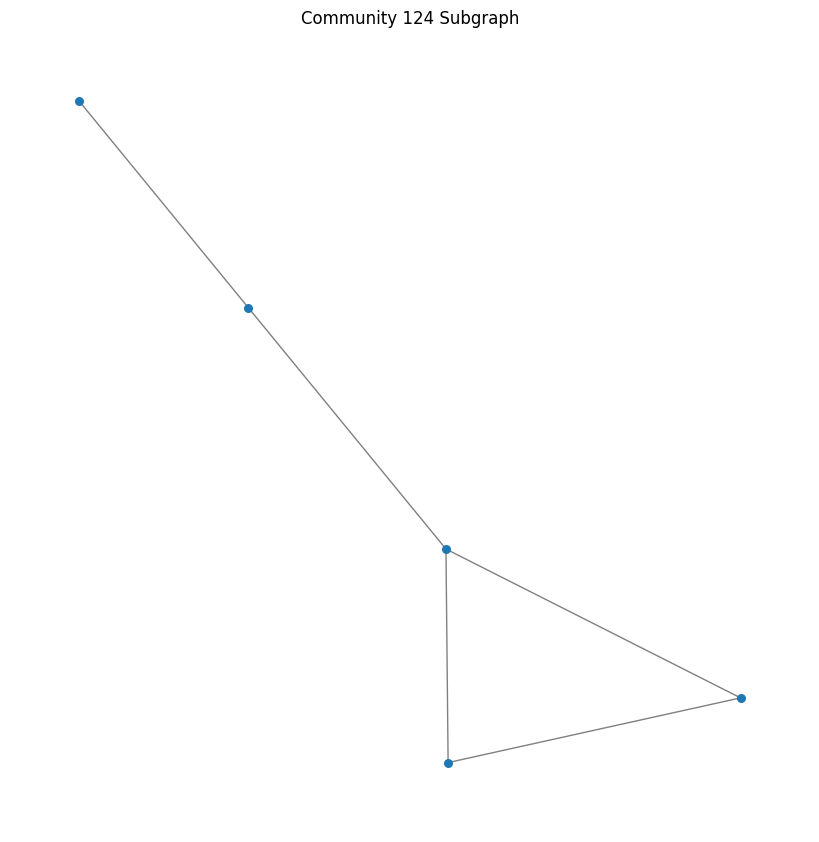

Artists in Community 347:
- Sint Kids
- Telekids Musicalschool
- Pietenkidz
- Sinterklaasliedjes
- Kinderliedjes

Community 347 Top 15 Genre Distribution:
- muziek voor kinderen: 2 artist(s)
- christmas product: 1 artist(s)


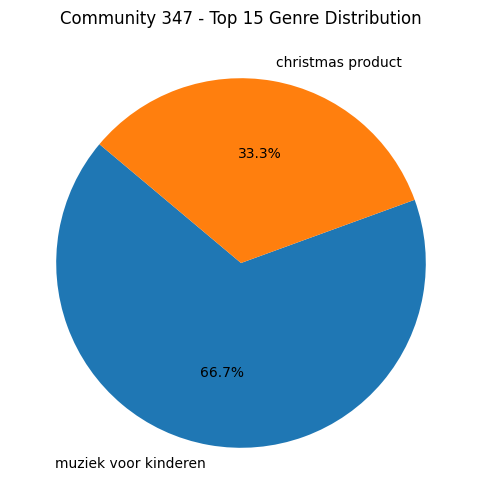

Global clustering coefficient for Community 347: 0.0
Diameter for Community 347: 2
Density for Community 347: 0.4

Comparable random graph diameter: 2
Comparable random graph global clustering: 0.5833333333333334

Comparable random graph diameter: 3
Comparable random graph global clustering: 0.0

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.0

Edge count: 4
Node count: 5
k = 2
Comparable regular lattice diameter: 3
Comparable regular lattice global clustering: 0.0


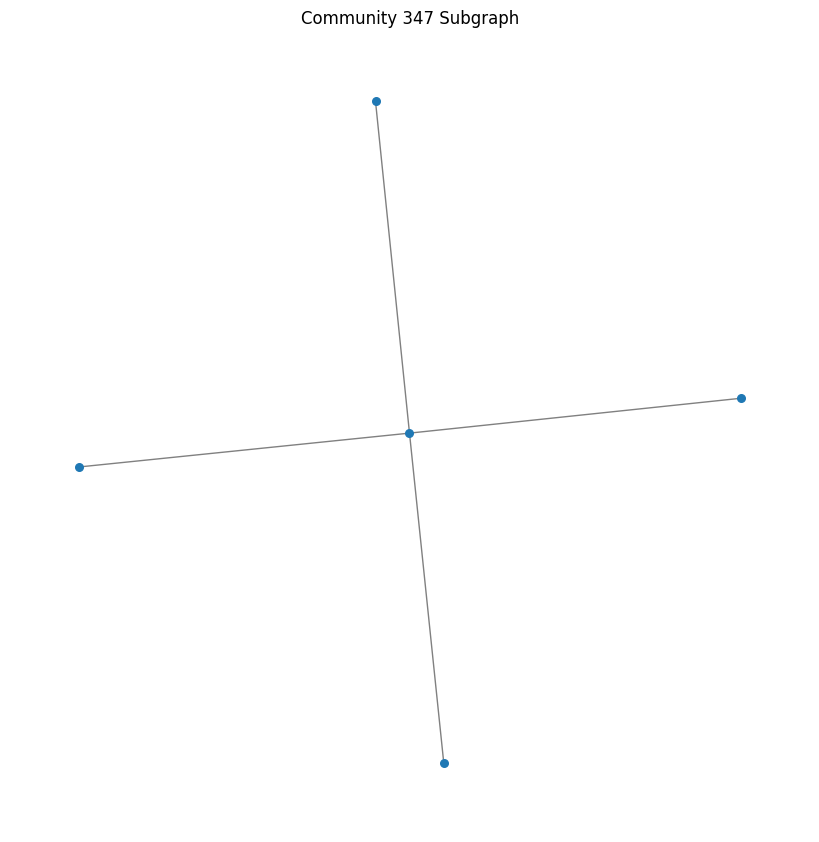

In [680]:
# loop through each community w/ at least 5 members & analyze:
for community_id, members in sorted(community_groups.items(), key=lambda x: len(x[1]), reverse=True):
    
    # process only if there are 5+ artists in the community:
    if len(members) < 5:
        continue
    
    # subgraph:
    community_subgraph = subgraph.subgraph(members).copy()
    
    genre_count = defaultdict(int)
    artist_names = []
    
    # count genres:
    for node in members:
        genres = G.nodes[node].get('genres', [])
        for genre in genres:
            genre_count[genre] += 1

        artist_name = G.nodes[node].get('name', 'Unknown')
        artist_names.append(artist_name)

    # print artists:
    print(f"Artists in Community {community_id}:")
    for artist in artist_names:
        print(f"- {artist}")

    # sort genres & select top 15:
    sorted_genres = sorted(genre_count.items(), key=lambda x: x[1], reverse=True)[:15]
    
    # only process if there are genres in this community:
    if sorted_genres:
        genres, counts = zip(*sorted_genres)
        print(f"\nCommunity {community_id} Top 15 Genre Distribution:")
        
        # display genre distribution:
        for genre, count in zip(genres, counts):
            print(f"- {genre}: {count} artist(s)")
        
        # plot pie chart:
        plt.figure(figsize=(6, 6))
        plt.pie(counts, labels=genres, autopct='%1.1f%%', startangle=140)
        plt.title(f"Community {community_id} - Top 15 Genre Distribution")
        plt.show()

    # global clustering:
    clustering_coefficient = nx.average_clustering(community_subgraph)
    print(f"Global clustering coefficient for Community {community_id}: {clustering_coefficient}")

    # diameter:
    diameter = nx.diameter(community_subgraph)
    print(f"Diameter for Community {community_id}: {diameter}")

    # density:
    density = nx.density(community_subgraph)
    print(f"Density for Community {community_id}: {density}\n")

    # COMPARABLE RANDOM GRAPHS:
    n = len(community_subgraph)
    p = density

    # generate & draw 3 samples:
    random_graphs = generate_graphs(n, p, 3)

    # analyze each random graph:
    for random_G in random_graphs:
        # check if random graph sample is connected. if not, use largest connected component:
        if not nx.is_connected(random_G):
            largest_cc = max(nx.connected_components(random_G), key=len)
            random_G = random_G.subgraph(largest_cc).copy()
            
        # approximate diameter calculation using largest connected component:
        randomG_diameter = nx.diameter(random_G)
        print(f"Comparable random graph diameter: {randomG_diameter}")
            
        # global clustering coefficient:
        randomG_clustering = nx.average_clustering(random_G)
        print(f"Comparable random graph global clustering: {randomG_clustering}")

        print('')

    # COMPARABLE REGULAR LATTICE:
    edge_count = community_subgraph.number_of_edges()
    print("Edge count:", edge_count)

    node_count = community_subgraph.number_of_nodes()
    print("Node count:", node_count)

    # decide k:
    k = (2 * edge_count) / len(community_subgraph)
    k = int(k)
    if k % 2 != 0:
        k += 1  # make k even
    print(f"k = {k}")

    if n > k:
        # generate regular lattice:
        reg_lat = nx.watts_strogatz_graph(n, k, 0)

        # diameter calculation:
        reg_lat_diameter = ceil(n / k)
        print(f"Comparable regular lattice diameter: {reg_lat_diameter}")
                
        # calculate global clustering coefficient:
        reg_lat_clustering = nx.average_clustering(reg_lat)
        print(f"Comparable regular lattice global clustering: {reg_lat_clustering}")
    else:
        print(f"Skipping regular lattice for Community {community_id} because n < k.\n")
        continue

    # plot subgraph:
    pos = nx.spring_layout(community_subgraph, seed=42)
    plt.figure(figsize=(8, 8))
    nx.draw(community_subgraph, pos, with_labels=False, node_size=30, edge_color='gray')
    plt.title(f"Community {community_id} Subgraph")
    plt.show()

Here's the top 20 visualized:

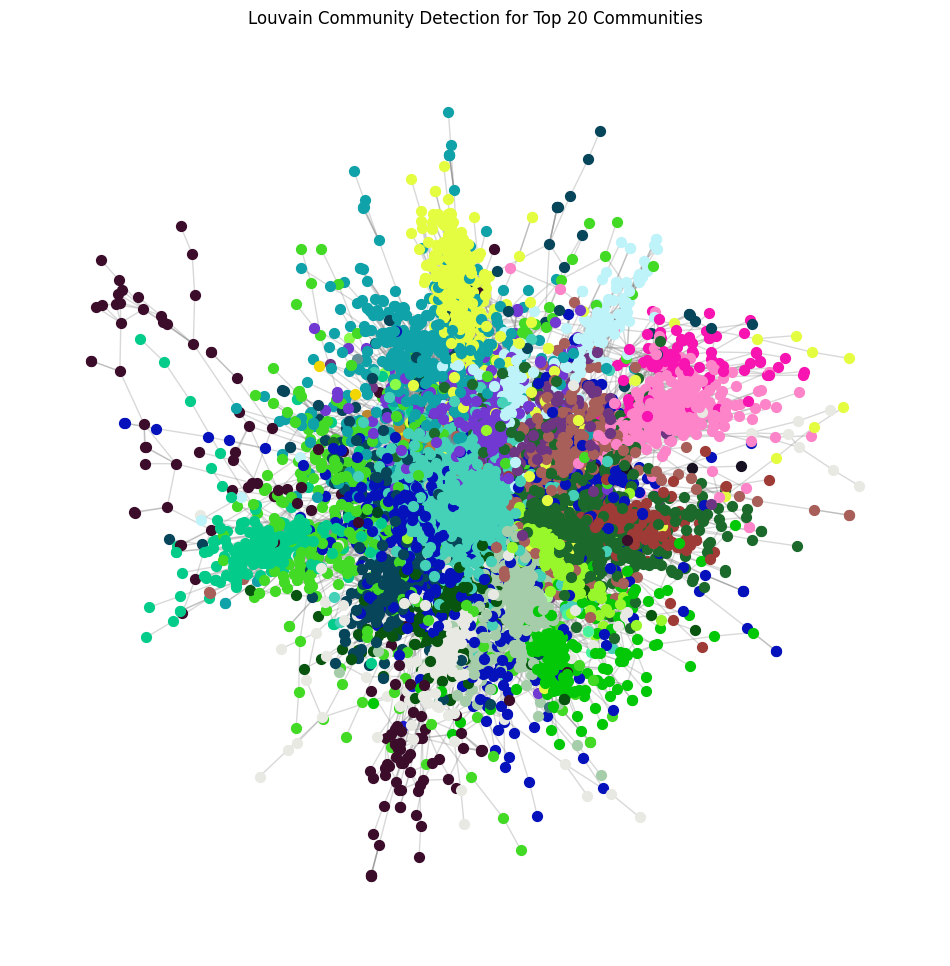

In [681]:
# runtime ~5min

# choose top 20 communities based on size:
top_20_communities = sorted(community_groups.items(), key=lambda x: len(x[1]), reverse=True)[:20]

# create graph w/ only nodes from top 20 communities:
top_20_nodes = [node for community_id, members in top_20_communities for node in members]
top_20_subgraph = G.subgraph(top_20_nodes).copy()

# apply Louvain partitioning on top 20 subgraph:
top_20_partition = community_louvain.best_partition(top_20_subgraph)

# generate colors for each community:
unique_communities = list(set(top_20_partition.values()))
community_colors = {community_id: (random.random(), random.random(), random.random()) for community_id in unique_communities}

# positioning:
pos = nx.spring_layout(top_20_subgraph, seed=42)

# plot graph w/ communities colored:
plt.figure(figsize=(12, 12))
for node, community_id in top_20_partition.items():
    nx.draw_networkx_nodes(top_20_subgraph, pos, nodelist=[node], node_size=50, node_color=[community_colors[community_id]])

nx.draw_networkx_edges(top_20_subgraph, pos, alpha=0.3, edge_color="gray")
plt.title("Louvain Community Detection for Top 20 Communities")
plt.axis("off")
plt.show()

**A look at genre distributions:**

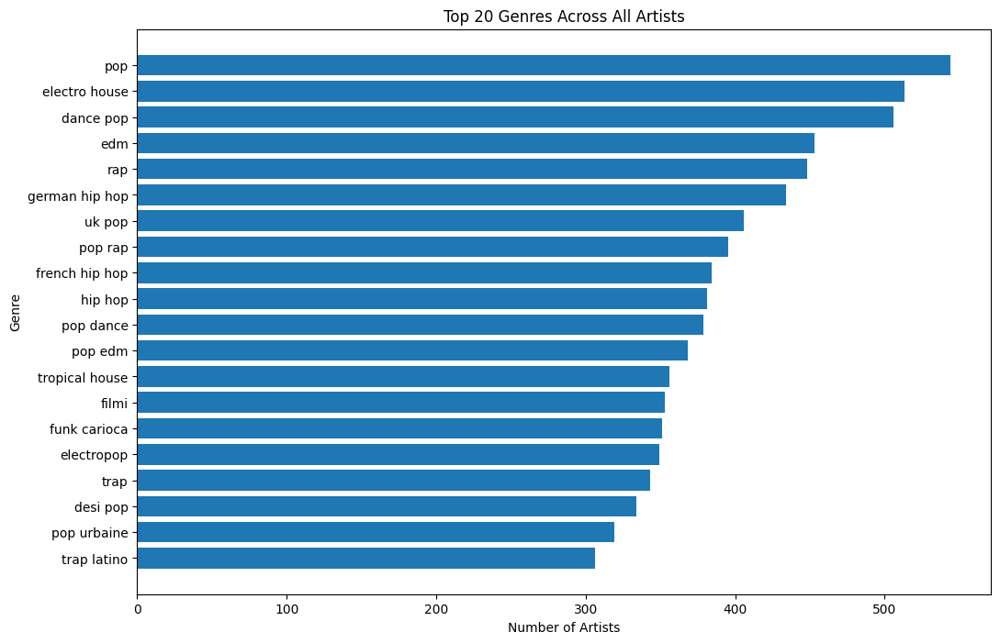

[('pop', 544),
 ('electro house', 513),
 ('dance pop', 506),
 ('edm', 453),
 ('rap', 448),
 ('german hip hop', 434),
 ('uk pop', 406),
 ('pop rap', 395),
 ('french hip hop', 384),
 ('hip hop', 381),
 ('pop dance', 379),
 ('pop edm', 368),
 ('tropical house', 356),
 ('filmi', 353),
 ('funk carioca', 351),
 ('electropop', 349),
 ('trap', 343),
 ('desi pop', 334),
 ('pop urbaine', 319),
 ('trap latino', 306)]

In [683]:
# extract genres from all artists (including non-seed/non-chart-toppers)
nodes_df['genres'] = nodes_df['genres'].fillna('[]').apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)
all_genres = [genre for genres in nodes_df['genres'] for genre in genres]

# count occurrences of each genre:
genre_counts = Counter(all_genres)

# identify top 20 genres:
top_genres = genre_counts.most_common(20)

# plot top genres:
genres, counts = zip(*top_genres)
plt.figure(figsize=(12, 8))
plt.barh(genres, counts)
plt.xlabel("Number of Artists")
plt.ylabel("Genre")
plt.title("Top 20 Genres Across All Artists")
plt.gca().invert_yaxis()
plt.show()

# return top 20 genres:
top_genres

**Looking at only chart topper artists:**

Let's look at some of their graph properties and compare them to G(n, p) and regular lattice:

In [461]:
# runtime ~15 min

import ast

# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes to include only those w/ non-empty 'chart_hits':
chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: len(x) > 0)]

# remove duplicates in 'spotify_id' column:
chart_toppers = chart_toppers.drop_duplicates(subset='spotify_id')

# get set of filtered artist IDs:
filtered_artist_ids = set(chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_edges = edges_df[
    (edges_df['id_0'].isin(filtered_artist_ids)) & (edges_df['id_1'].isin(filtered_artist_ids))
]

# create subgraph:
chart_toppers_G = nx.Graph()
chart_toppers_G.add_edges_from(filtered_edges.values)  # Add edges
chart_toppers_G.add_nodes_from([  # Add nodes with attributes
    (node_id, attr) for node_id, attr in chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = chart_toppers_G.number_of_nodes()
num_edges = chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
clustering_coefficient = nx.average_clustering(chart_toppers_G)
print(f"Global clustering coefficient for chart topper artists: {clustering_coefficient}")

# analyze diameter of subgraph:
largest_cc_nodes = max(nx.connected_components(chart_toppers_G), key=len)
largest_cc_subgraph = chart_toppers_G.subgraph(largest_cc_nodes).copy()
diameter = nx.diameter(largest_cc_subgraph)
print(f"Diameter for chart topper artists: {diameter}")

# find density:
density = nx.density(chart_toppers_G)
print(f"Density for chart topper artists: {density}\n")

# COMPARABLE RANDOM GRAPHS:
n = len(chart_toppers_G)
p = density

# generate & draw 3 samples:
random_graphs = generate_graphs(n, p, 3)

# analyze each:
for random_G in random_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
        
    # approximate diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # Calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes & edges:    
edge_count = chart_toppers_G.number_of_edges()
print("Edge count:", edge_count)

node_count = chart_toppers_G.number_of_nodes()
print("Node count:", node_count)

# decide k:
k = (2 * edge_count) / len(chart_toppers_G)
k = int(k)
if k % 2 != 0:
    k += 1  # make k even
print(f"k = {k}")

# generate regular lattice:
reg_lat = nx.watts_strogatz_graph(n, k, 0)

# diameter calculation:
reg_lat_diameter = nx.diameter(reg_lat)
print(f"Comparable regular lattice diameter: {reg_lat_diameter}")
        
# calculate global clustering coefficient:
reg_lat_clustering = nx.average_clustering(reg_lat)
print(f"Comparable regular lattice global clustering: {reg_lat_clustering}")


Subgraph created with 19562 nodes and 72207 edges.
Global clustering coefficient for chart topper artists: 0.12147760596271856
Diameter for chart topper artists: 18
Density for chart topper artists: 0.0003774026885327709

Comparable random graph diameter: 10
Comparable random graph global clustering: 0.0003928614554460801

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.00040222379558697087

Comparable random graph diameter: 9
Comparable random graph global clustering: 0.00038325937896292354

Edge count: 72207
Node count: 19562
k = 8
Comparable regular lattice diameter: 2446
Comparable regular lattice global clustering: 0.6428571428571429


Vertex degree distribution again, but just for the chart-toppers:

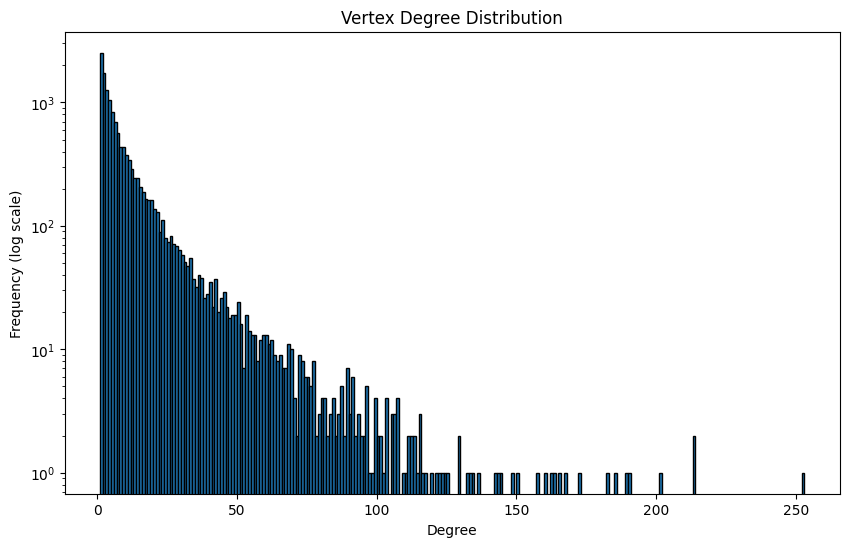

In [470]:
# graph vertex degree dist:
degrees = [degree for node, degree in chart_toppers_G.degree()]
plt.figure(figsize=(10, 6))
plt.hist(degrees, bins=range(1, max(degrees) + 1), edgecolor='black')
plt.yscale('log')
plt.xlabel("Degree")
plt.ylabel("Frequency (log scale)")
plt.title("Vertex Degree Distribution")
plt.show()

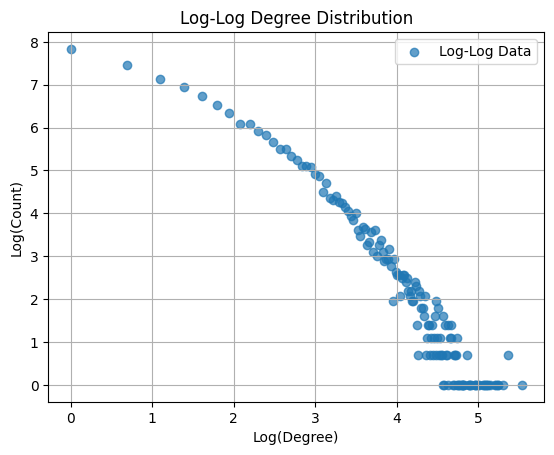

R^2: 0.9282


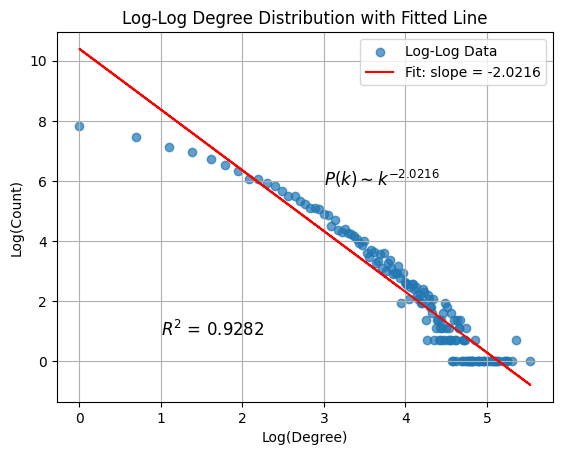

R^2: 0.9282
Slope of the log-log fit: -2.0216
R^2 value: 0.9282


In [466]:
# power law analysis for CHART TOPPERS:

slope = plot_and_fit_log_log(chart_toppers_G)
r2_value = compute_r2(chart_toppers_G)

print(f"Slope of the log-log fit: {slope:.4f}")
print(f"R^2 value: {r2_value:.4f}")

So, a slightly higher slope seen in the power law for the (non-biased) chart-topper data.

Let's look at their genres:

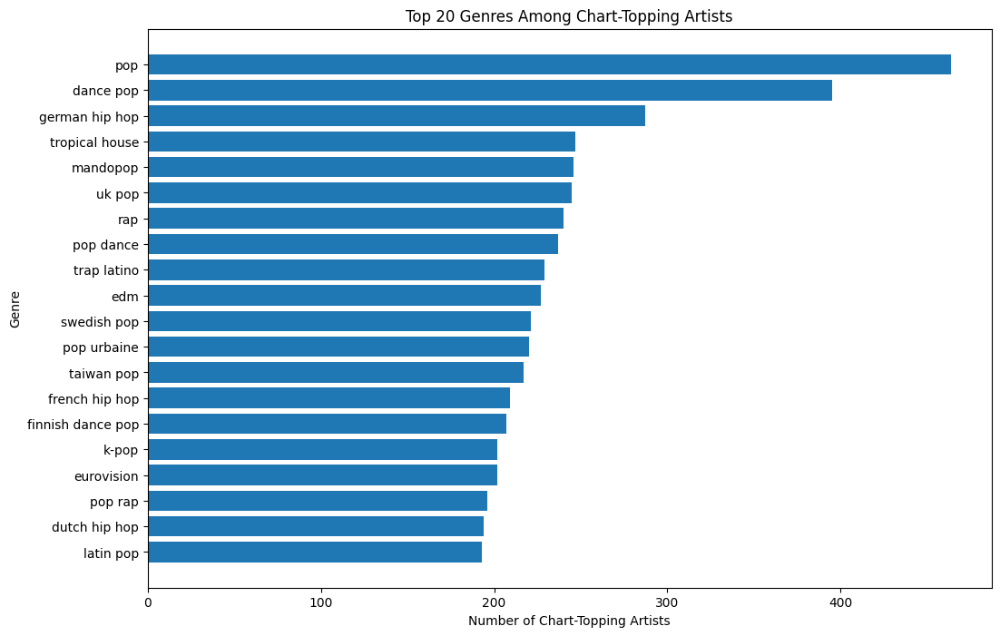

In [70]:
# extract genres for chart-topping artists:
chart_toppers['genres'] = chart_toppers['genres'].fillna('[]').apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)
chart_toppers_genres = [genre for genres in chart_toppers['genres'] for genre in genres]

# count occurrences of each genre among chart-topping artists:
chart_toppers_genre_counts = Counter(chart_toppers_genres)

# identify top 20 genres for chart-topping artists:
top_chart_toppers_genres = chart_toppers_genre_counts.most_common(20)

# plot top genres for chart toppers:
chart_genres, chart_counts = zip(*top_chart_toppers_genres)
plt.figure(figsize=(12, 8))
plt.barh(chart_genres, chart_counts)
plt.xlabel("Number of Chart-Topping Artists")
plt.ylabel("Genre")
plt.title("Top 20 Genres Among Chart-Topping Artists")
plt.gca().invert_yaxis()
plt.show()

Definitely more pop, among some other changes.

**Chart toppers in the U.S.**

Again, let's look at the graph properties:

In [684]:
# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# Convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in U.S.:
us_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('us' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
us_chart_toppers = us_chart_toppers.drop_duplicates(subset='spotify_id')

# get set of filtered artist IDs:
filtered_us_artist_ids = set(us_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in the filtered artist list:
filtered_us_edges = edges_df[
    (edges_df['id_0'].isin(filtered_us_artist_ids)) & (edges_df['id_1'].isin(filtered_us_artist_ids))
]

# create subgraph:
us_chart_toppers_G = nx.Graph()
us_chart_toppers_G.add_edges_from(filtered_us_edges.values)
us_chart_toppers_G.add_nodes_from([
    (node_id, attr) for node_id, attr in us_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = us_chart_toppers_G.number_of_nodes()
num_edges = us_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
us_clustering_coefficient = nx.average_clustering(us_chart_toppers_G)
print(f"Global clustering coefficient for top United States artists: {us_clustering_coefficient}")

# analyze diameter of subgraph:
us_largest_cc_nodes = max(nx.connected_components(us_chart_toppers_G), key=len)
us_largest_cc_subgraph = us_chart_toppers_G.subgraph(us_largest_cc_nodes).copy()
us_diameter = nx.diameter(us_largest_cc_subgraph)
print(f"Diameter for top United States artists: {us_diameter}")

# find density:
us_density = nx.density(us_chart_toppers_G)
print(f"Density for top United States artists: {us_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_us = len(us_chart_toppers_G)
p_us = us_density

# generate & draw 3 samples:
random_us_graphs = generate_graphs(n_us, p_us, 3)

# analyze each:
for random_G in random_us_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
        
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes & edges:    
edge_count_us = us_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_us)

node_count_us = us_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_us)

# decide k:
k_us = (2 * edge_count_us) / len(us_chart_toppers_G)
k_us = int(k_us)
if k_us % 2 != 0:
    k_us += 1  # make k even
print(f"k = {k_us}")

# generate regular lattice:
us_reg_lat = nx.watts_strogatz_graph(n_us, k_us, 0)

# diameter calculation:
us_reg_lat_diameter = ceil(n_us / k_us)
print(f"Comparable regular lattice diameter: {us_reg_lat_diameter}")
        
# calculate global clustering coefficient:
us_reg_lat_clustering = nx.average_clustering(us_reg_lat)
print(f"Comparable regular lattice global clustering: {us_reg_lat_clustering}")


Subgraph created with 1185 nodes and 8507 edges.
Global clustering coefficient for top United States artists: 0.17188109933012694
Diameter for top United States artists: 8
Density for top United States artists: 0.012126525259436652

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.011630261061865948

Comparable random graph diameter: 4
Comparable random graph global clustering: 0.013531466669670074

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.011974175876593872

Edge count: 8507
Node count: 1185
k = 14
Comparable regular lattice diameter: 85
Comparable regular lattice global clustering: 0.6923076923076923


Genre distribution:

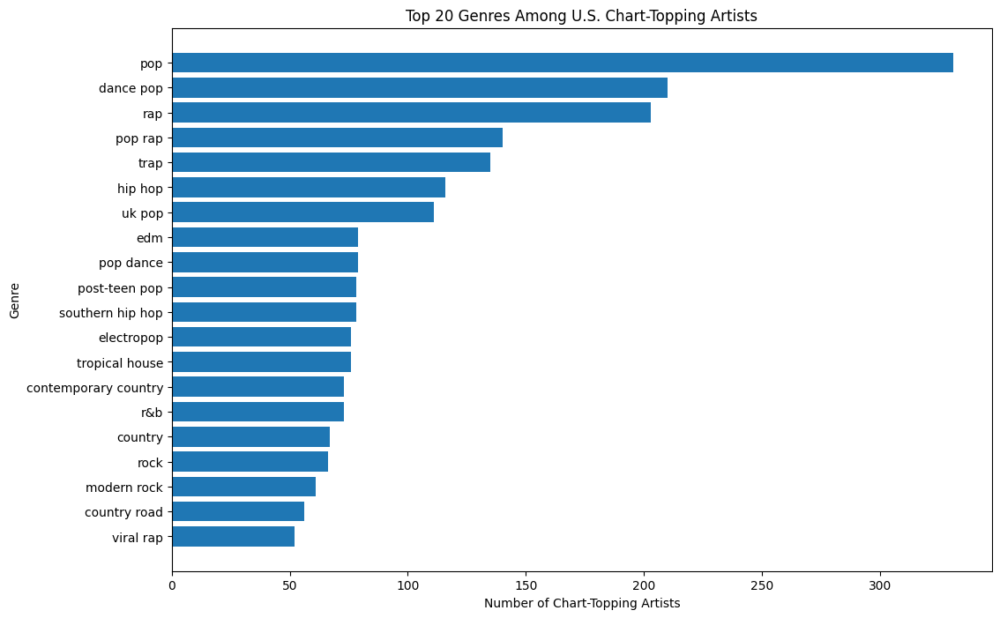

In [72]:
# extract genres for U.S. chart-topping artists:
us_chart_toppers['genres'] = us_chart_toppers['genres'].fillna('[]').apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)
us_chart_toppers_genres = [genre for genres in us_chart_toppers['genres'] for genre in genres]

# count occurrences of each genre among chart-topping artists:
us_chart_toppers_genre_counts = Counter(us_chart_toppers_genres)

# identify top 20 genres for chart-topping artists:
us_top_chart_toppers_genres = us_chart_toppers_genre_counts.most_common(20)

# plot top genres for chart toppers:
us_chart_genres, us_chart_counts = zip(*us_top_chart_toppers_genres)
plt.figure(figsize=(12, 8))
plt.barh(us_chart_genres, us_chart_counts)
plt.xlabel("Number of Chart-Topping Artists")
plt.ylabel("Genre")
plt.title("Top 20 Genres Among U.S. Chart-Topping Artists")
plt.gca().invert_yaxis()
plt.show()

Pop and hip hop for the win.

**Chart-toppers in United Kingdom:**

In [ ]:
# Replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# Convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in the UK:
uk_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('gb' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
uk_chart_toppers = uk_chart_toppers.drop_duplicates(subset='spotify_id')

# get the set of filtered artist IDs:
filtered_uk_artist_ids = set(uk_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_uk_edges = edges_df[
    (edges_df['id_0'].isin(filtered_uk_artist_ids)) & (edges_df['id_1'].isin(filtered_uk_artist_ids))
]

# create subgraph:
uk_chart_toppers_G = nx.Graph()
uk_chart_toppers_G.add_edges_from(filtered_uk_edges.values)
uk_chart_toppers_G.add_nodes_from([
    (node_id, attr) for node_id, attr in uk_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = uk_chart_toppers_G.number_of_nodes()
num_edges = uk_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
uk_clustering_coefficient = nx.average_clustering(uk_chart_toppers_G)
print(f"Global clustering coefficient for top United Kingdom artists: {uk_clustering_coefficient}")

# analyze diameter of subgraph:
uk_largest_cc_nodes = max(nx.connected_components(uk_chart_toppers_G), key=len)
uk_largest_cc_subgraph = uk_chart_toppers_G.subgraph(uk_largest_cc_nodes).copy()
uk_diameter = nx.diameter(uk_largest_cc_subgraph)
print(f"Diameter for top United Kingdom artists: {uk_diameter}")

# find density:
uk_density = nx.density(uk_chart_toppers_G)
print(f"Density for top United Kingdom artists: {uk_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_uk = len(uk_chart_toppers_G)
p_uk = uk_density

# generate & draw 3 samples:
random_uk_graphs = generate_graphs(n_uk, p_uk, 3)

# analyze each:
for random_G in random_uk_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
        
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes and edges:    
edge_count_uk = uk_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_uk)

node_count_uk = uk_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_uk)

# decide k:
k_uk = (2 * edge_count_uk) / len(uk_chart_toppers_G)
k_uk = int(k_uk)
if k_uk % 2 != 0:
    k_uk += 1  # make k even
print(f"k = {k_uk}")

# generate regular lattice:
uk_reg_lat = nx.watts_strogatz_graph(n_uk, k_uk, 0)

# diameter calculation:
uk_reg_lat_diameter = ceil(n_uk / k_uk)
print(f"Comparable regular lattice diameter: {uk_reg_lat_diameter}")
        
# calculate global clustering coefficient:
uk_reg_lat_clustering = nx.average_clustering(uk_reg_lat)
print(f"Comparable regular lattice global clustering: {uk_reg_lat_clustering}")


Subgraph created with 617 nodes and 3019 edges.
Global clustering coefficient for top United Kingdom artists: 0.20269309021695683
Diameter for top United Kingdom artists: 9
Density for top United Kingdom artists: 0.01588646361741986

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.01491345564058331

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.014808202862911152

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.01376274888764163

Edge count: 3019
Node count: 617
k = 10
Comparable regular lattice diameter: 31
Comparable regular lattice global clustering: 0.6666666666666666


**India's Chart-toppers:**

In [384]:
# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# Convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in the India:
in_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('in' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
in_chart_toppers = in_chart_toppers.drop_duplicates(subset='spotify_id')

# get set of filtered artist IDs:
filtered_in_artist_ids = set(in_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_in_edges = edges_df[
    (edges_df['id_0'].isin(filtered_in_artist_ids)) & (edges_df['id_1'].isin(filtered_in_artist_ids))
]

# create subgraph:
in_chart_toppers_G = nx.Graph()
in_chart_toppers_G.add_edges_from(filtered_in_edges.values)
in_chart_toppers_G.add_nodes_from([ 
    (node_id, attr) for node_id, attr in in_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = in_chart_toppers_G.number_of_nodes()
num_edges = in_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
in_clustering_coefficient = nx.average_clustering(in_chart_toppers_G)
print(f"Global clustering coefficient for top India artists: {in_clustering_coefficient}")

# analyze diameter of subgraph:
in_largest_cc_nodes = max(nx.connected_components(in_chart_toppers_G), key=len)
in_largest_cc_subgraph = in_chart_toppers_G.subgraph(in_largest_cc_nodes).copy()
in_diameter = nx.diameter(in_largest_cc_subgraph)
print(f"Diameter for top India artists: {in_diameter}")

# find density:
in_density = nx.density(in_chart_toppers_G)
print(f"Density for top India artists: {in_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_in = len(in_chart_toppers_G)
p_in = in_density

# generate & draw 3 samples:
random_in_graphs = generate_graphs(n_in, p_in, 3)

# analyze each:
for random_G in random_in_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
        
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes & edges:    
edge_count_in = in_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_in)

node_count_in = in_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_in)

# decide k:
k_in = (2 * edge_count_in) / len(in_chart_toppers_G)
k_in = int(k_in)
if k_in % 2 != 0:
    k_in += 1  # make k even
print(f"k = {k_in}")

# generate regular lattice:
in_reg_lat = nx.watts_strogatz_graph(n_in, k_in, 0)

# diameter calculation:
in_reg_lat_diameter = ceil(n_in / k_in)
print(f"Comparable regular lattice diameter: {in_reg_lat_diameter}")
        
# calculate global clustering coefficient:
in_reg_lat_clustering = nx.average_clustering(in_reg_lat)
print(f"Comparable regular lattice global clustering: {in_reg_lat_clustering}")

Subgraph created with 617 nodes and 3019 edges.
Global clustering coefficient for top India artists: 0.20269309021695683
Diameter for top India artists: 9
Density for top India artists: 0.01588646361741986

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.01811705162132427

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.01785280924328849

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.013380780843136599

Edge count: 3019
Node count: 617
k = 10
Comparable regular lattice diameter: 31
Comparable regular lattice global clustering: 0.6666666666666666


**Brazil's Chart-toppers:**

In [386]:
# replace NaN values in 'chart_hits' w/ empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in Brazil:
br_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('br' in hit for hit in x))]

# remove duplicates in 'spotify_id' column:
br_chart_toppers = br_chart_toppers.drop_duplicates(subset='spotify_id')

# get set of filtered artist IDs:
filtered_br_artist_ids = set(br_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_br_edges = edges_df[
    (edges_df['id_0'].isin(filtered_br_artist_ids)) & (edges_df['id_1'].isin(filtered_br_artist_ids))
]

# create subgraph:
br_chart_toppers_G = nx.Graph()
br_chart_toppers_G.add_edges_from(filtered_in_edges.values)
br_chart_toppers_G.add_nodes_from([
    (node_id, attr) for node_id, attr in br_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = br_chart_toppers_G.number_of_nodes()
num_edges = br_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
br_clustering_coefficient = nx.average_clustering(br_chart_toppers_G)
print(f"Global clustering coefficient for top Brazil artists: {br_clustering_coefficient}")

# analyze diameter of subgraph:
br_largest_cc_nodes = max(nx.connected_components(br_chart_toppers_G), key=len)
br_largest_cc_subgraph = br_chart_toppers_G.subgraph(br_largest_cc_nodes).copy()
br_diameter = nx.diameter(br_largest_cc_subgraph)
print(f"Diameter for top Brazil artists: {br_diameter}")

# find density:
br_density = nx.density(br_chart_toppers_G)
print(f"Density for top Brazil artists: {br_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_br = len(br_chart_toppers_G)
p_br = br_density

# generate & draw 3 samples:
random_br_graphs = generate_graphs(n_br, p_br, 3)

# analyze each:
for random_G in random_br_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
        
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes and edges:    
edge_count_br = br_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_br)

node_count_br = br_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_br)

# decide k:
k_br = (2 * edge_count_br) / len(br_chart_toppers_G)
k_br = int(k_br)
if k_br % 2 != 0:
    k_br += 1  # make k even
print(f"k = {k_br}")

# generate regular lattice:
br_reg_lat = nx.watts_strogatz_graph(n_br, k_br, 0)

# diameter calculation:
br_reg_lat_diameter = ceil(n_br / k_br)
print(f"Comparable regular lattice diameter: {br_reg_lat_diameter}")
        
# calculate global clustering coefficient:
br_reg_lat_clustering = nx.average_clustering(br_reg_lat)
print(f"Comparable regular lattice global clustering: {br_reg_lat_clustering}")

Subgraph created with 1081 nodes and 6395 edges.
Global clustering coefficient for top India artists: 0.1881414594671468
Diameter for top India artists: 8
Density for top India artists: 0.01095521978963237

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.010909800425012517

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.011161745710437869

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.010892638950140188

Edge count: 6395
Node count: 1081
k = 12
Comparable regular lattice diameter: 46
Comparable regular lattice global clustering: 0.6818181818181818


**Japan's Chart-toppers:**

In [393]:
# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in Japan:
jp_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('jp' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
jp_chart_toppers = jp_chart_toppers.drop_duplicates(subset='spotify_id')

# get the set of filtered artist IDs:
filtered_jp_artist_ids = set(jp_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_jp_edges = edges_df[
    (edges_df['id_0'].isin(filtered_jp_artist_ids)) & (edges_df['id_1'].isin(filtered_jp_artist_ids))
]

# create subgraph:
jp_chart_toppers_G = nx.Graph()
jp_chart_toppers_G.add_edges_from(filtered_in_edges.values) 
jp_chart_toppers_G.add_nodes_from([ 
    (node_id, attr) for node_id, attr in jp_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = jp_chart_toppers_G.number_of_nodes()
num_edges = jp_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
jp_clustering_coefficient = nx.average_clustering(jp_chart_toppers_G)
print(f"Global clustering coefficient for top Japan artists: {jp_clustering_coefficient}")

# analyze diameter of subgraph:
jp_largest_cc_nodes = max(nx.connected_components(jp_chart_toppers_G), key=len)
jp_largest_cc_subgraph = jp_chart_toppers_G.subgraph(jp_largest_cc_nodes).copy()
jp_diameter = nx.diameter(jp_largest_cc_subgraph)
print(f"Diameter for top Japan artists: {jp_diameter}")

# find density:
jp_density = nx.density(jp_chart_toppers_G)
print(f"Density for top Japan artists: {jp_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_jp = len(jp_chart_toppers_G)
p_jp = jp_density

# generate & draw 3 samples:
random_jp_graphs = generate_graphs(n_jp, p_jp, 3)

# analyze each:
for random_G in random_jp_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
        
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes & edges:    
edge_count_jp = jp_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_jp)

node_count_jp = jp_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_jp)

# decide k:
k_jp = (2 * edge_count_jp) / len(jp_chart_toppers_G)
k_jp = int(k_jp)
if k_jp % 2 != 0:
    k_jp += 1  # make k even
print(f"k = {k_jp}")

# generate regular lattice:
jp_reg_lat = nx.watts_strogatz_graph(n_jp, k_jp, 0)

# diameter calculation:
jp_reg_lat_diameter = ceil(n_jp / k_jp)
print(f"Comparable regular lattice diameter: {jp_reg_lat_diameter}")
        
# calculate global clustering coefficient:
jp_reg_lat_clustering = nx.average_clustering(jp_reg_lat)
print(f"Comparable regular lattice global clustering: {jp_reg_lat_clustering}")

Subgraph created with 1431 nodes and 6395 edges.
Global clustering coefficient for top Japan artists: 0.14212502982808226
Diameter for top Japan artists: 8
Density for top Japan artists: 0.006250213797383609

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.006707476064136304

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.005940255191736651

Comparable random graph diameter: 6
Comparable random graph global clustering: 0.005850113965366025

Edge count: 6395
Node count: 1431
k = 8
Comparable regular lattice diameter: 90
Comparable regular lattice global clustering: 0.6428571428571429


**Nigeria's Chart-toppers:**

In [394]:
# replace NaN values in 'chart_hits' with empty lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].fillna('[]')

# convert 'chart_hits' strings to lists:
nodes_df['chart_hits'] = nodes_df['chart_hits'].apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# filter nodes for artists w/ chart hits in Nigeria:
ng_chart_toppers = nodes_df[nodes_df['chart_hits'].apply(lambda x: any('ng' in hit for hit in x))]

# remove duplicates in the 'spotify_id' column:
ng_chart_toppers = ng_chart_toppers.drop_duplicates(subset='spotify_id')

# get the set of filtered artist IDs:
filtered_ng_artist_ids = set(ng_chart_toppers['spotify_id'])

# filter edges to include only those where both endpoints are in filtered artist list:
filtered_ng_edges = edges_df[
    (edges_df['id_0'].isin(filtered_ng_artist_ids)) & (edges_df['id_1'].isin(filtered_ng_artist_ids))
]

# create subgraph:
ng_chart_toppers_G = nx.Graph()
ng_chart_toppers_G.add_edges_from(filtered_in_edges.values) 
ng_chart_toppers_G.add_nodes_from([ 
    (node_id, attr) for node_id, attr in ng_chart_toppers.set_index('spotify_id').to_dict('index').items()
])

# info:
num_nodes = ng_chart_toppers_G.number_of_nodes()
num_edges = ng_chart_toppers_G.number_of_edges()
print(f"Subgraph created with {num_nodes} nodes and {num_edges} edges.")

# analyze global clustering of subgraph:
ng_clustering_coefficient = nx.average_clustering(ng_chart_toppers_G)
print(f"Global clustering coefficient for top Nigeria artists: {ng_clustering_coefficient}")

# analyze diameter of subgraph:
ng_largest_cc_nodes = max(nx.connected_components(ng_chart_toppers_G), key=len)
ng_largest_cc_subgraph = ng_chart_toppers_G.subgraph(ng_largest_cc_nodes).copy()
ng_diameter = nx.diameter(ng_largest_cc_subgraph)
print(f"Diameter for top Nigeria artists: {ng_diameter}")

# find density:
ng_density = nx.density(ng_chart_toppers_G)
print(f"Density for top Nigeria artists: {ng_density}\n")

# COMPARABLE RANDOM GRAPHS:
n_ng = len(ng_chart_toppers_G)
p_ng = ng_density

# generate & draw 3 samples:
random_ng_graphs = generate_graphs(n_ng, p_ng, 3)

# analyze each:
for random_G in random_ng_graphs:
    # check if random graph sample is connected. if not, use largest connected component:
    if not nx.is_connected(random_G):
        largest_cc_nodes = max(nx.connected_components(random_G), key=len)
        random_G = random_G.subgraph(largest_cc_nodes).copy()
        
    # diameter calculation using largest connected component:
    randomG_diameter = nx.diameter(random_G)
    print(f"Comparable random graph diameter: {randomG_diameter}")
        
    # calculate global clustering coefficient:
    randomG_clustering = nx.average_clustering(random_G)
    print(f"Comparable random graph global clustering: {randomG_clustering}")

    print('')

# COMPARABLE REGULAR LATTICE:
# count nodes and edges:    
edge_count_ng = ng_chart_toppers_G.number_of_edges()
print("Edge count:", edge_count_ng)

node_count_ng = ng_chart_toppers_G.number_of_nodes()
print("Node count:", node_count_ng)

# decide k:
k_ng = (2 * edge_count_ng) / len(ng_chart_toppers_G)
k_ng = int(k_ng)
if k_ng % 2 != 0:
    k_ng += 1  # make k even
print(f"k = {k_ng}")

# generate regular lattice:
ng_reg_lat = nx.watts_strogatz_graph(n_ng, k_ng, 0)

# diameter calculation:
ng_reg_lat_diameter = ceil(n_ng / k_ng)
print(f"Comparable regular lattice diameter: {ng_reg_lat_diameter}")
        
# calculate global clustering coefficient:
ng_reg_lat_clustering = nx.average_clustering(ng_reg_lat)
print(f"Comparable regular lattice global clustering: {ng_reg_lat_clustering}")

Subgraph created with 946 nodes and 6395 edges.
Global clustering coefficient for top Nigeria artists: 0.21499039924311386
Diameter for top Nigeria artists: 8
Density for top Nigeria artists: 0.014306967795339888

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.015548264914593147

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.015521816110561519

Comparable random graph diameter: 5
Comparable random graph global clustering: 0.014052312258090168

Edge count: 6395
Node count: 946
k = 14
Comparable regular lattice diameter: 34
Comparable regular lattice global clustering: 0.6923076923076923


**More Genre Analysis**

We can actually make a network for them:

In [610]:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/nodes.csv'
nodes_df = pd.read_csv(nodes_path)

# replace NaN values in the 'genres' column & convert strings to lists:
nodes_df['genres'] = nodes_df['genres'].fillna('[]').apply(
    lambda x: ast.literal_eval(x) if isinstance(x, str) else x
)

# count genre co-occurrences:
co_occurrences = Counter()
for genres in nodes_df['genres']:
    # create all pairs of genres:
    for genre_pair in combinations(sorted(genres), 2):
        co_occurrences[genre_pair] += 1

# build co-occurrence network:
genre_co_occurrence_G = nx.Graph()
for (genre1, genre2), count in co_occurrences.items():
    if count > 5:  # (only include significant co-occurrences)
        genre_co_occurrence_G.add_edge(genre1, genre2, weight=count)

# identify top genres by degree (number of connections):
top_genres_by_degree = sorted(
    genre_co_occurrence_G.degree, key=lambda x: x[1], reverse=True
)[:10]  # (top 10 genres by degree)

#  for each top genre, find its most co-occurring genres:
top_genre_cooccurrences = []
for genre, _ in top_genres_by_degree:
    neighbors = sorted(
        genre_co_occurrence_G[genre].items(),
        key=lambda x: x[1]['weight'],  # Sort by co-occurrence weight
        reverse=True
    )[:5]  # top 5 neighbors for each genre:
    top_genre_cooccurrences.append({
        "Genre": genre,
        "Top Co-Occurring Genres": [neighbor[0] for neighbor in neighbors],
        "Co-Occurrence Counts": [neighbor[1]['weight'] for neighbor in neighbors]
    })

# convert results to a df for display:
top_genre_cooccurrences_df = pd.DataFrame(top_genre_cooccurrences)

print(top_genre_cooccurrences_df)


           Genre                            Top Co-Occurring Genres  \
0      dance pop  [pop, post-teen pop, uk pop, pop dance, tropic...   
1            rap  [hip hop, trap, southern hip hop, pop rap, gan...   
2            pop  [dance pop, uk pop, post-teen pop, electropop,...   
3     electropop   [pop, uk pop, indie poptimism, dance pop, alt z]   
4        hip hop  [rap, gangster rap, hardcore hip hop, pop rap,...   
5            edm  [electro house, pop dance, tropical house, pop...   
6           rock  [modern rock, classic rock, album rock, mellow...   
7  electro house  [edm, pop dance, pop edm, progressive electro ...   
8    electronica  [alternative dance, new rave, microhouse, trip...   
9        pop rap  [rap, southern hip hop, trap, hip hop, gangste...   

        Co-Occurrence Counts  
0  [236, 129, 124, 121, 116]  
1  [247, 208, 178, 177, 174]  
2   [236, 160, 126, 118, 75]  
3      [118, 92, 89, 81, 70]  
4  [247, 165, 124, 121, 120]  
5  [302, 289, 155, 132, 102]  
6

Attempts to visualize whole graph:

(Note that to run these successfully, you need the Cytoscape application)

In [ ]:
import py4cytoscape as p4c

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# check for missing nodes:
missing_source_nodes = edges[~edges['source'].isin(nodes['id'])]
missing_target_nodes = edges[~edges['target'].isin(nodes['id'])]

print("Missing source nodes:\n", missing_source_nodes)
print("Missing target nodes:\n", missing_target_nodes)

# remove invalid edges:
valid_edges = edges[
    edges['source'].isin(nodes['id']) & edges['target'].isin(nodes['id'])
]

# create network:
p4c.create_network_from_data_frames(
    nodes=nodes,
    edges=valid_edges,
    title='Artist Network',
    collection='My Network Collection'
)

# apply layout:
p4c.layout_network('force-directed')

In [413]:
# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# create graph:
G = nx.Graph()
G.add_nodes_from(nodes['id'])
G.add_edges_from(edges[['source', 'target']].values)
print("graph created successfully")
print(f"Number of nodes: {nx.number_of_nodes(G)}")
print(f"Number of edges: {nx.number_of_edges(G)}")

# extract giant component:
giant_component = max(nx.connected_components(G), key=len)
giant_subgraph = G.subgraph(giant_component)
print(f"\nNumber of nodes in subgraph: {nx.number_of_nodes(giant_subgraph)}")
print(f"Number of edges in subgraph: {nx.number_of_edges(giant_subgraph)}")

# prepare nodes & edges for Cytoscape:
giant_nodes = pd.DataFrame(list(giant_subgraph.nodes), columns=['id'])
giant_edges = pd.DataFrame(
    list(giant_subgraph.edges), columns=['source', 'target']
)

# create network:
p4c.create_network_from_data_frames(
    nodes=giant_nodes,
    edges=giant_edges,
    title='Artist Network - Giant Component',
    collection='My Network Collection'
)

# apply layout:
p4c.layout_network('force-directed')

graph created successfully
Number of nodes: 156326
Number of edges: 300386

Number of nodes in subgraph: 148386
Number of edges in subgraph: 296770
Applying default style...


In commands_post(): No network views selected.
In commands_post(): No network views selected.


Applying preferred layout


{}

In [417]:
# top 1%:

import py4cytoscape as p4c

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# create graph:
G = nx.Graph()
G.add_nodes_from(nodes['id'])
G.add_edges_from(valid_edges[['source', 'target']].values)

# calculate node degrees:
degree_dict = dict(G.degree())
nodes['degree'] = nodes['id'].map(degree_dict)

# determine threshold for the top 1% of nodes by degree:
threshold = nodes['degree'].quantile(0.99)

# filter for top 1% of nodes by degree:
top_nodes = nodes[nodes['degree'] >= threshold]

# filter edges to include only those connecting the top 1% nodes:
top_edges = valid_edges[
    valid_edges['source'].isin(top_nodes['id']) & valid_edges['target'].isin(top_nodes['id'])
]

# create network:
p4c.create_network_from_data_frames(
    nodes=top_nodes,
    edges=top_edges,
    title='Top 1% Artists by Edge Count',
    collection='My Network Collection'
)

# apply layout:
p4c.layout_network('force-directed')


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/py4cytoscape/networks.py:1120: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if not interaction_type_list in edges.columns: edges[interaction_type_list] = 'interacts with'


Applying default style...
Applying preferred layout


{}

In [ ]:
# top 0.1%:

import py4cytoscape as p4c

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# create graph:
G = nx.Graph()
G.add_nodes_from(nodes['id'])
G.add_edges_from(valid_edges[['source', 'target']].values)

# calculate node degrees:
degree_dict = dict(G.degree())
nodes['degree'] = nodes['id'].map(degree_dict)

# determine threshold for the top 0.1% of nodes by degree:
threshold = nodes['degree'].quantile(0.999)

# filter for top 0.1% of nodes by degree:
top_nodes = nodes[nodes['degree'] >= threshold]

# filter edges to include only those connecting the top 0.1% nodes:
top_edges = valid_edges[
    valid_edges['source'].isin(top_nodes['id']) & valid_edges['target'].isin(top_nodes['id'])
]

# create network:
p4c.create_network_from_data_frames(
    nodes=top_nodes,
    edges=top_edges,
    title='Top 0.1% Artists by Edge Count',
    collection='My Network Collection'
)

# apply layout:
p4c.layout_network('force-directed')


Let's look at *Steve Aoki* (the most connected artist in the network):

In [ ]:
import py4cytoscape as p4c
import pandas as pd
import networkx as nx
import math

# load data:
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv'
nodes = pd.read_csv(nodes_path)
edges = pd.read_csv(edges_path)

# rename columns:
nodes.rename(columns={'Id': 'id'}, inplace=True)
edges.rename(columns={'id_0': 'source', 'id_1': 'target'}, inplace=True)

# ensure all IDs are strings:
nodes['id'] = nodes['id'].astype(str)
edges['source'] = edges['source'].astype(str)
edges['target'] = edges['target'].astype(str)

# create graph:
G = nx.Graph()
G.add_nodes_from(nodes['id'])
G.add_edges_from(edges[['source', 'target']].values)

# find Steve Aoki & his connections:
steve_aoki_id = nodes[nodes['name'] == "Steve Aoki"]['id'].values[0]
# direct neighbors of Steve Aoki:
neighbors = list(G.neighbors(steve_aoki_id))

# subgraph containing Aoki & his neighbors:
steve_aoki_subgraph = G.subgraph([steve_aoki_id] + neighbors)
print(f"Steve Aoki has  {nx.number_of_nodes(steve_aoki_subgraph) - 1} connections.")

# prep nodes & edges for Cytoscape:
steve_aoki_nodes = pd.DataFrame(list(steve_aoki_subgraph.nodes), columns=['id'])
steve_aoki_edges = pd.DataFrame(
    list(steve_aoki_subgraph.edges), columns=['source', 'target']
)

steve_aoki_nodes = pd.merge(steve_aoki_nodes, nodes, on='id', how='left')

# create network:
p4c.create_network_from_data_frames(
    nodes=steve_aoki_nodes,
    edges=steve_aoki_edges,
    title='Steve Aoki and Connections',
    collection='My Network Collection'
)

# apply force-directed layout to spread out network:
p4c.layout_network('force-directed')

# manually position Steve Aoki in center:
p4c.set_node_position(node_name="Steve Aoki", x_pos=0, y_pos=0)

# spread out neighbors around Steve Aoki in circular layout:
angle_step = 360 / len(neighbors)
radius = 300  # (distance from Aoki)
for i, neighbor in enumerate(neighbors):
    angle = i * angle_step
    x_pos = radius * math.cos(math.radians(angle))
    y_pos = radius * math.sin(math.radians(angle))
    p4c.set_node_position(node_name=neighbor, x_pos=x_pos, y_pos=y_pos)

# styling for Aoki:
p4c.set_node_property_bypass(node_name="Steve Aoki", visual_property='NODE_SIZE', value=100)
p4c.set_node_property_bypass(node_name="Steve Aoki", visual_property='NODE_FILL_COLOR', value='#FF0000')  # Red color

# styling for neighbors:
for neighbor in neighbors:
    p4c.set_node_property_bypass(node_name=neighbor, visual_property='NODE_SIZE', value=50)
    p4c.set_node_property_bypass(node_name=neighbor, visual_property='NODE_FILL_COLOR', value='#00FF00')  # Green color

# adjust edge transparency & width:
p4c.set_edge_property_bypass(edge_names='all', visual_property='EDGE_TRANSPARENCY', value=50)
p4c.set_edge_property_bypass(edge_names='all', visual_property='EDGE_WIDTH', value=2)


This would not load using PyVis:

In [396]:
from pyvis.network import Network

edges_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/edges.csv' 
nodes_path = '/Users/raquelanabush/Library/Mobile Documents/com~apple~CloudDocs/Documents/MTH565_final_project/cleaned_nodes.csv'
edges_df = pd.read_csv(edges_path)
nodes_df = pd.read_csv(nodes_path)

G = nx.from_pandas_edgelist(edges_df, source='id_0', target='id_1')

node_attributes = nodes_df.set_index('Id').to_dict('index')
nx.set_node_attributes(G, node_attributes)

# calculate degree for each node:
degree_dict = dict(G.degree())
nx.set_node_attributes(G, degree_dict, 'degree')

# determine top 1% threshold:
threshold = sorted(degree_dict.values(), reverse=True)[int(len(degree_dict) * 0.01)]

# initialize Pyvis Network:
net = Network(notebook=True, height="1000px", width="100%", bgcolor="#222222", font_color="white")

# add nodes and edges to the Pyvis graph:
for node, attrs in G.nodes(data=True):
    name = attrs.get('name', node)  # Use name if available, fallback to ID
    degree = attrs['degree']
    followers = attrs.get('followers', 0)
    
    if degree >= threshold:
        # top 1%: bigger, red, & labeled
        net.add_node(node, label=name, color="red", size=degree * 2)
    else:
        # other nodes: blue, no label
        net.add_node(node, color="blue", size=degree)

# add edges:
for source, target in G.edges():
    net.add_edge(source, target)

# save and display the graph:
net.show("artist_network.html")

artist_network.html
